#**EDAB6808 Assignment 2 (Group 1): Bayesian Networks and Synthetic Data Generation for Subsistence Retail**

**Group Members:**

Lethabo Phalime 2020264244

Melissa Mlotshwa 2021276346

**B.Com Hons Business and Financial Analytics (Hons), University of the Free State**  

**Due Date: 15 October 2025**  


---

####**Objective**

Our goal is to evaluate and compare the impact of data balancing and synthetic data generation techniques on Bayesian network modelling for purchase intention prediction in the Soweto subsistence retail dataset. Specifically, we will:

1. Build an initial Bayesian Network using the imbalanced dataset
2. Apply three synthetic balancing methods (SMOTE, ML-based imputation, GAN)
3. Re-train Bayesian Networks using the balanced datasets
4. Evaluate and compare the models for accuracy, interpretability, and trade-offs

---
####**The outline for this notebook is as follows:**

1. Data Preparation
2. Synthetic Data Generation
3. Balanced Bayesian Networks
4. Comparative Analysis & Reflection
5. Interpretation & Reporting
6. Deliverables & Conclusion

**Disclaimer:** AI (ChatGPT and Gemini AI) was used responsibly in the assignment, as a means to improve the quality of the work  and code with human oversight.

##**Phase 1.0: Initial Installation & Setup of Packages**

**Disclaimer:** All the relevant packages for this entire assessment are installed and imported in this section of the assignment.

In [ ]:
#Install Required Packages
!pip install -q pandas numpy matplotlib seaborn networkx imbalanced-learn scikit-learn pingouin factor_analyzer pgmpy bnlearn

In [ ]:
!pip install -q ctgan

In [ ]:
!pip install -q statsmodels

In [ ]:
from google.colab import files

In [ ]:
import pickle
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
#Import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import bnlearn as bn
import pickle
import pingouin as pg
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Bayesian Networks
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import HillClimbSearch, BicScore

In [ ]:
#Resampling techniques (Balancing)
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
#ML-based Imputation
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
#GAN for Synthetic Data Generation
from ctgan import CTGAN

In [ ]:
#Statistical Analysis
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats
from scipy.stats import chi2_contingency, spearmanr
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from factor_analyzer import (FactorAnalyzer, calculate_bartlett_sphericity, calculate_kmo)

In [ ]:

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

##**Phase 1: Data Dataset Acquisition & Preparation**

For this section of the assignment, the focus is on obtaining the publicly available **Soweto subsistence retail dataset** *([Data in Brief](https://www.sciencedirect.com/science/article/pii/S2352340922003043))*, which captures the purchasing behaviors and intentions of resource-constrained consumers in a South African township context. The dataset contains multi-dimensional variables spanning from demographics, perceptions, experiences, and purchase intentions. This phase focuses on obtaining, cleaning, and preparing the raw data for analysis and modeling.


**Key Objectives:**

1. Dataset Acquisition & Exploration
2. Descriptive Statistics, Distributions & Interpretation
3. Comprehensive Exploratory Data Analysis
4. Imbalance Analysis
5. Feature Selection & Final Preprocessing



###**1. Dataset Acquisition & Initial Exploration**

The dataset was sourced from the ***Data in Brief publication on Soweto subsistence retail***. It has a sample size of 281, and contains 41 variables, including **demographics** (e.g., Gender, Age, Marital Status), **behavioral indicators** (e.g., Shopping frequency, Regular Customer), **psychometric constructs** (E1 to E3, CT1 to CT7, PV1 to PV3), and four **purchase intention targets** (PI1 to PI4). Each variable is measured on a Likert scale (1-5), making the dataset fully discrete (all variables are of an interger datatype type).

In [ ]:
#Load and upload dataset onto colab
from google.colab import files
uploaded = files.upload()

Saving Subsistence Retail Consumer Data - Subsistence Retail Consumer Data.csv to Subsistence Retail Consumer Data - Subsistence Retail Consumer Data (1).csv


In [ ]:
#Assign a dataframe to the loaded dataset
soweto_retail_data = pd.read_csv('Subsistence Retail Consumer Data - Subsistence Retail Consumer Data.csv')
print("Dataset loaded successfully!")

Dataset loaded successfully!


In [ ]:
#Preview the 1st rows of the dataset
soweto_retail_data.head()

,Gender,Age,Marital Status,Employment Status,Level of Education,Regular Customer,Shopping frequency,E1,E2,E3,...,CT5,CT6,CT7,PV1,PV2,PV3,PI1,PI2,PI3,PI4
0,3,4,1,1,4,2,3,3,2,4,...,3,2,4,2,4,4,3,4,4,4
1,3,5,3,1,4,1,1,3,3,3,...,2,4,3,2,3,2,4,4,4,4
2,2,4,2,2,2,2,2,3,4,2,...,2,4,1,2,3,1,3,3,4,3
3,1,3,1,1,3,2,1,3,2,4,...,2,3,4,1,2,3,3,4,3,4
4,3,2,1,2,2,2,3,2,4,3,...,2,4,2,2,4,2,2,3,2,3


In [ ]:
#Preview the last 5 rows of the dataset
soweto_retail_data.tail()

,Gender,Age,Marital Status,Employment Status,Level of Education,Regular Customer,Shopping frequency,E1,E2,E3,...,CT5,CT6,CT7,PV1,PV2,PV3,PI1,PI2,PI3,PI4
276,1,3,1,2,3,1,2,2,3,2,...,2,3,5,3,3,4,4,4,5,4
277,2,3,3,1,2,1,1,5,4,2,...,1,1,5,2,1,5,4,4,3,4
278,2,4,3,1,3,1,2,5,5,3,...,4,4,4,4,4,4,4,5,5,5
279,2,5,2,2,3,1,1,3,3,3,...,3,3,3,3,3,4,4,4,4,4
280,2,5,1,1,2,1,1,5,5,5,...,5,4,5,4,3,5,4,5,4,5


In [ ]:
#Basic dataset information
print(f"Dataset Dimensions: {soweto_retail_data.shape}")
print(f"Number of features/variables: {soweto_retail_data.shape[1]}")
print(f"Number of observations: {soweto_retail_data.shape[0]}")

Dataset Dimensions: (281, 41)
Number of features/variables: 41
Number of observations: 281


In [ ]:
#Display the datatypes (column information)
print("\nDataset Columns and Data Types:")
print(soweto_retail_data.dtypes)


Dataset Columns and Data Types:
Gender                int64
Age                   int64
Marital Status        int64
Employment Status     int64
Level of Education    int64
Regular Customer      int64
Shopping frequency    int64
E1                    int64
E2                    int64
E3                    int64
E4                    int64
C1                    int64
C2                    int64
C3                    int64
PS1                   int64
PS2                   int64
PS3                   int64
PE1                   int64
PE2                   int64
PE3                   int64
PE4                   int64
PE5                   int64
PE6                   int64
PPQ1                  int64
PPQ2                  int64
PPQ3                  int64
PPQ4                  int64
CT1                   int64
CT2                   int64
CT3                   int64
CT4                   int64
CT5                   int64
CT6                   int64
CT7                   int64
PV1            

In [ ]:
#Display the overall info
print("\nDataset Info:")
print(soweto_retail_data.info())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 41 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   Gender              281 non-null    int64
 1   Age                 281 non-null    int64
 2   Marital Status      281 non-null    int64
 3   Employment Status   281 non-null    int64
 4   Level of Education  281 non-null    int64
 5   Regular Customer    281 non-null    int64
 6   Shopping frequency  281 non-null    int64
 7   E1                  281 non-null    int64
 8   E2                  281 non-null    int64
 9   E3                  281 non-null    int64
 10  E4                  281 non-null    int64
 11  C1                  281 non-null    int64
 12  C2                  281 non-null    int64
 13  C3                  281 non-null    int64
 14  PS1                 281 non-null    int64
 15  PS2                 281 non-null    int64
 16  PS3                 281 non-n

###**2. Descriptive Statistics, Distributions and Interpretation**

The analysis of 281 observations from the Soweto subsistence retail dataset reveals two key patterns critical for Bayesian Network modeling:

---

#####**Respondent Profile & Imbalance Clues**

- **Regular Customers:** The data shows a strong imbalance, with the majority of respondents being Regular Customers (median 1.0, mean 1.17, highly positively skewed at 1.73).

- **Demographics:** The sample is generally characterized by respondents who are single/never married and employed, as indicated by the low means (around 1.5) and medians (1.0) for Marital Status and Employment Status.

These demographic figures confirm the initial need to address class imbalance before modeling.

#####**Attitude Bias & Distribution**

- **Positive Sentiment:** All Likert-scale variables measuring attitudes (Expectations, Trust, Purchase Intention, etc.) cluster towards the high end. The means range from 3.04 to 4.02 (on a 5-point scale), with medians typically at 4.0.

- **High Scores:** The highest means are observed in Customer Trust (CT7 at 4.02) and Purchase Intention (PI items around 3.8), suggesting a highly positive overall sentiment towards subsistence retail.

- **Negative Skew:** The vast majority of these perception variables exhibit negative skewness (e.g., E2 at -0.823), indicating responses are heavily concentrated at the positive (high score) end of the scale.

- **Modeling Impact:** This strong positive bias confirms that the initial Bayesian Network will be trained on data highly skewed toward positive outcomes, underscoring the necessity of synthetic data generation to improve the predictive reliability for the minority (negative) intention class.



####**1. Basic Descriptive Statistics**

In [ ]:
#Display Basic statistics
print("Basic Descriptive Statistics:")
soweto_retail_data.describe(include='all').T

Basic Descriptive Statistics:


,count,mean,std,min,25%,50%,75%,max
Gender,281.0,1.576512,0.587382,1.0,1.0,2.0,2.0,3.0
Age,281.0,2.836299,1.417329,1.0,2.0,3.0,4.0,5.0
Marital Status,281.0,1.551601,0.720867,1.0,1.0,1.0,2.0,3.0
Employment Status,281.0,1.476868,0.500356,1.0,1.0,1.0,2.0,2.0
Level of Education,281.0,2.491103,0.945342,1.0,2.0,2.0,3.0,5.0
Regular Customer,281.0,1.174377,0.380110,1.0,1.0,1.0,1.0,2.0
Shopping frequency,281.0,2.185053,1.268263,1.0,1.0,2.0,3.0,5.0
E1,281.0,3.491103,1.159168,1.0,3.0,4.0,4.0,5.0
E2,281.0,3.697509,1.040756,1.0,3.0,4.0,4.0,5.0
E3,281.0,3.192171,1.091563,1.0,3.0,3.0,4.0,5.0


In [ ]:
#Display Advanced statistics
print("\nAdvanced Statistics (Skewness, Kurtosis):")
stats_summary = pd.DataFrame({
    'Mean': soweto_retail_data.mean(),
    'Median': soweto_retail_data.median(),
    'Std': soweto_retail_data.std(),
    'Skewness': soweto_retail_data.skew(),
    'Kurtosis': soweto_retail_data.kurtosis(),
})

display(stats_summary)


Advanced Statistics (Skewness, Kurtosis):


,Mean,Median,Std,Skewness,Kurtosis
Gender,1.576512,2.0,0.587382,0.445059,-0.687943
Age,2.836299,3.0,1.417329,0.171141,-1.303520
Marital Status,1.551601,1.0,0.720867,0.912822,-0.524341
Employment Status,1.476868,1.0,0.500356,0.093124,-2.005654
Level of Education,2.491103,2.0,0.945342,0.383425,-0.553210
Regular Customer,1.174377,1.0,0.380110,1.725588,0.984610
Shopping frequency,2.185053,2.0,1.268263,0.853749,-0.346172
E1,3.491103,4.0,1.159168,-0.497874,-0.545164
E2,3.697509,4.0,1.040756,-0.823212,0.376011
E3,3.192171,3.0,1.091563,-0.321734,-0.382324


####**2. Distribution plots for selected variables**

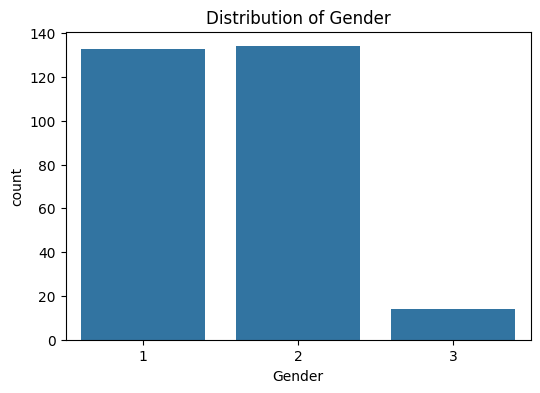

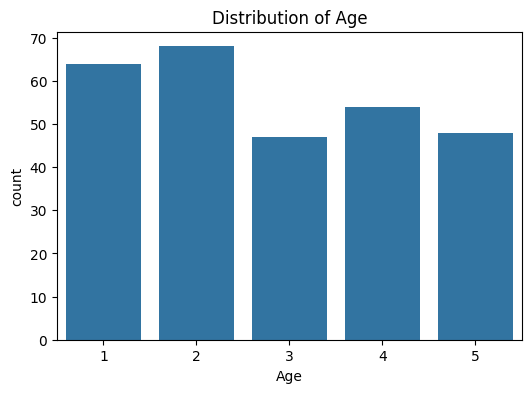

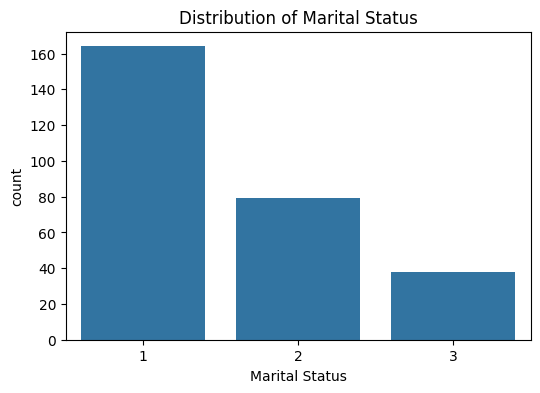

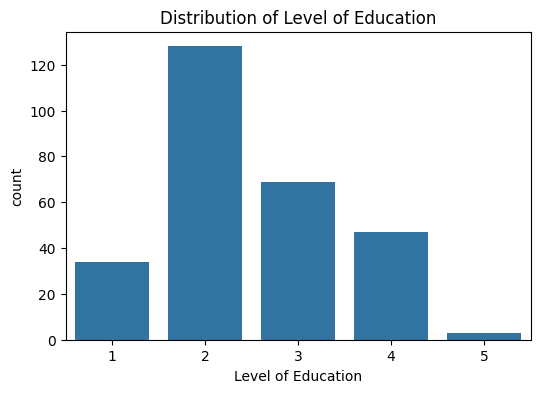

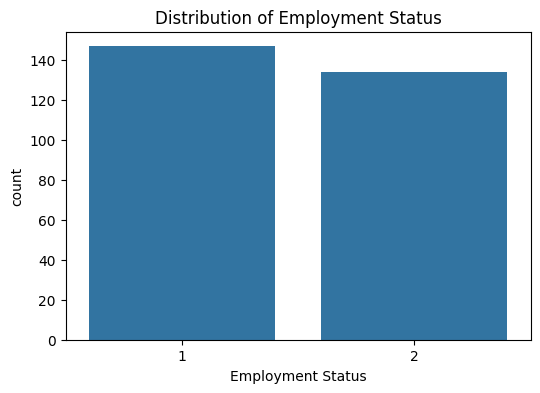

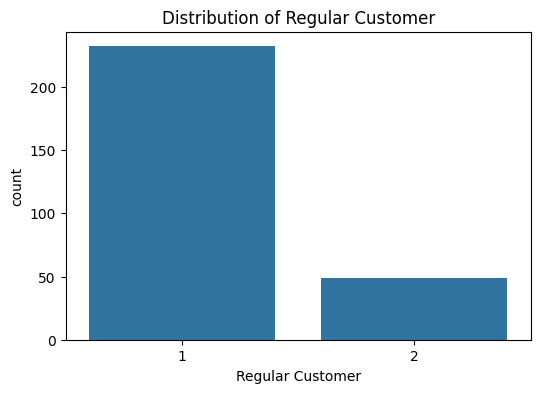

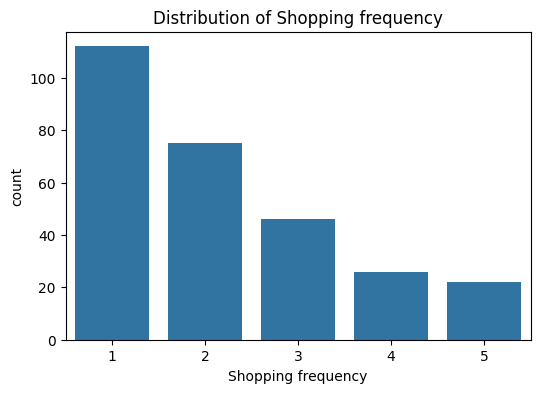

In [ ]:
#Distribution plots for demographics
for col in ["Gender", "Age", "Marital Status", "Level of Education", "Employment Status", "Regular Customer", "Shopping frequency"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

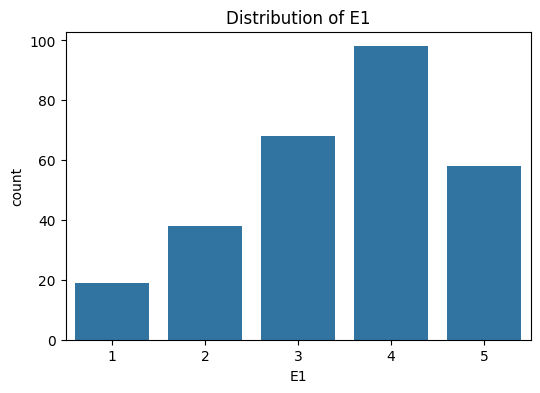

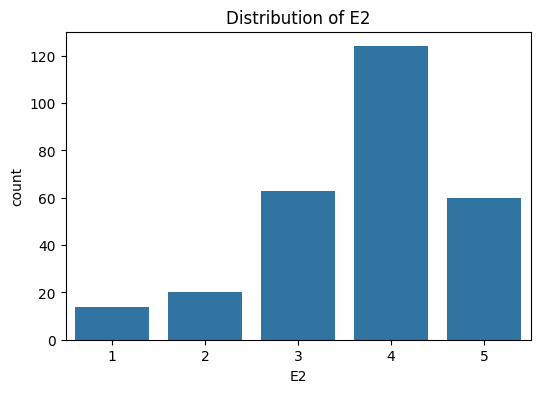

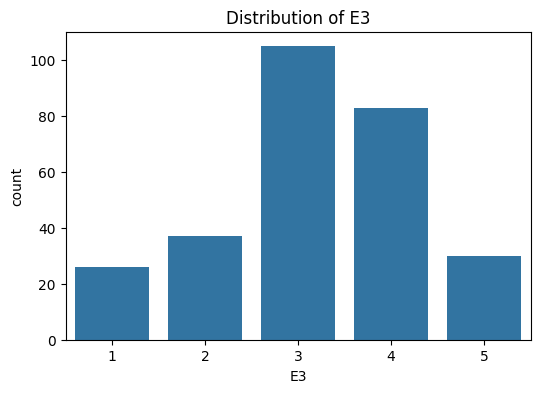

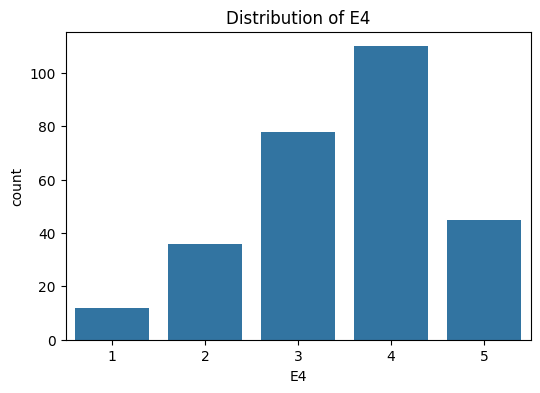

In [ ]:
#Distribution plots for Empathy
for col in ["E1", "E2", "E3", "E4"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

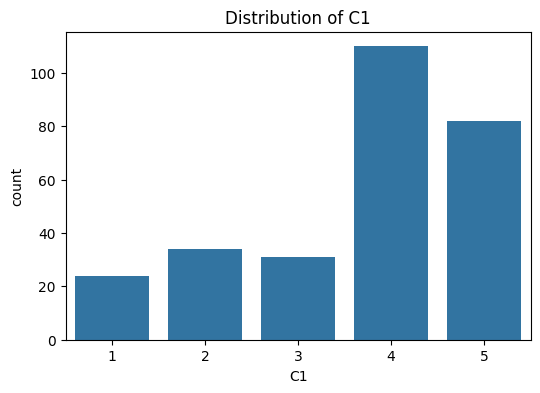

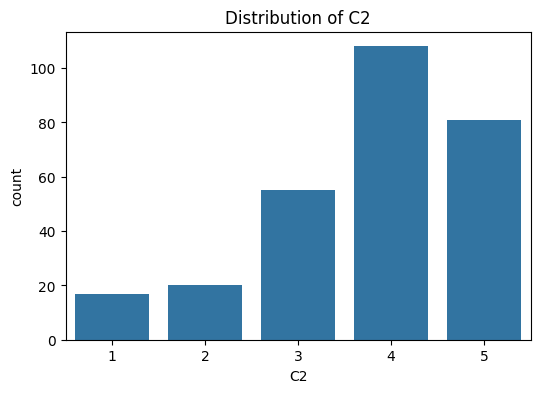

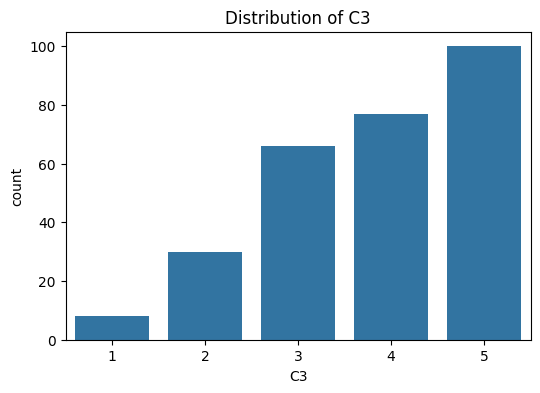

In [ ]:
#Distribution plots for Convenience
for col in ["C1", "C2", "C3"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

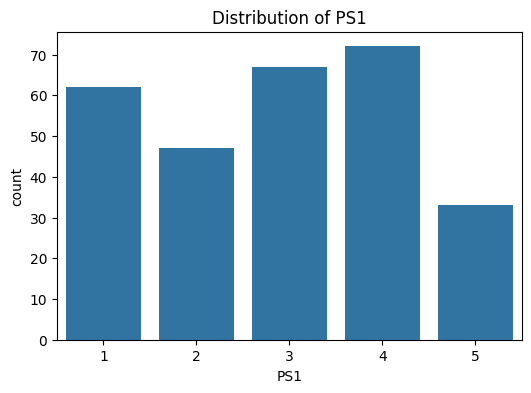

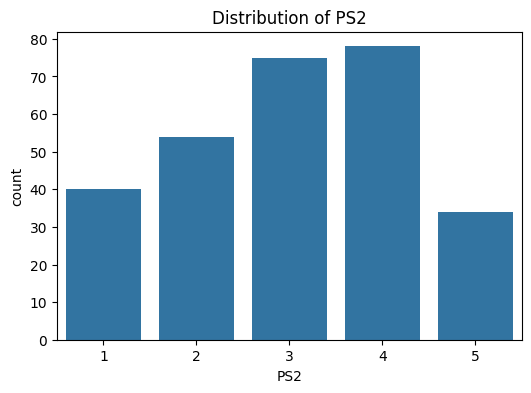

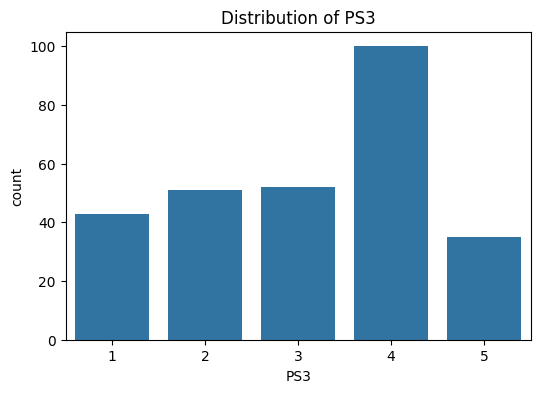

In [ ]:
#Distribution plots for Price Sensitivity
for col in ["PS1", "PS2", "PS3"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

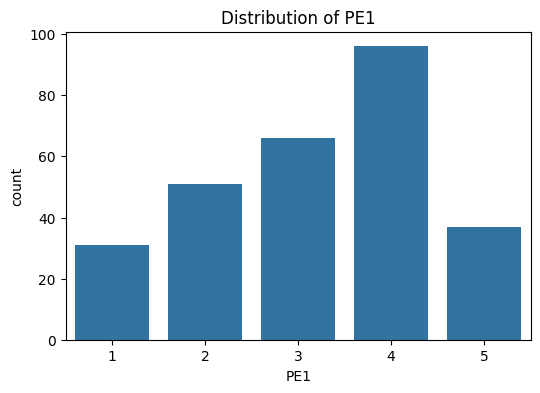

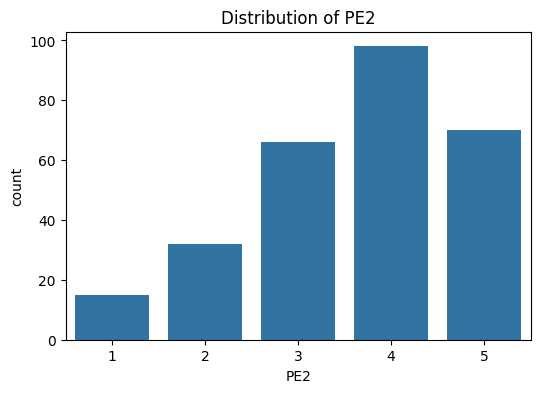

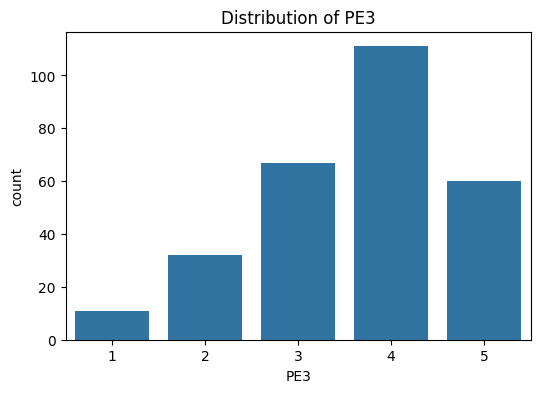

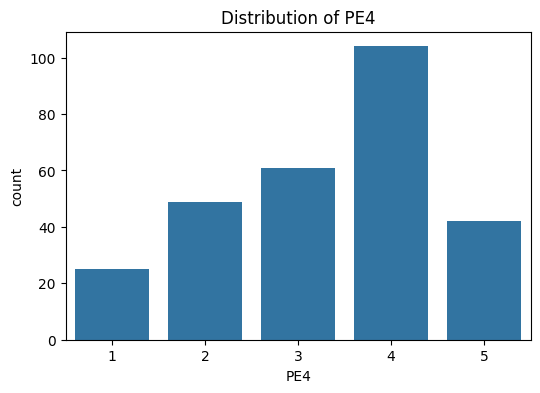

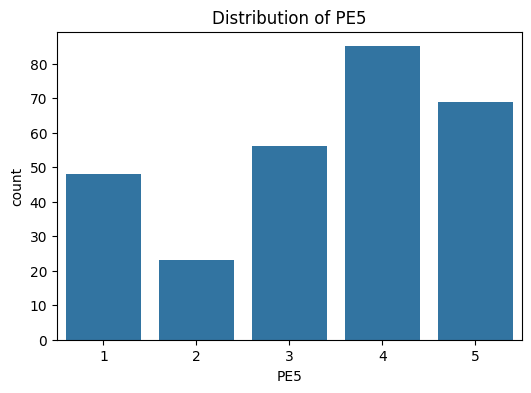

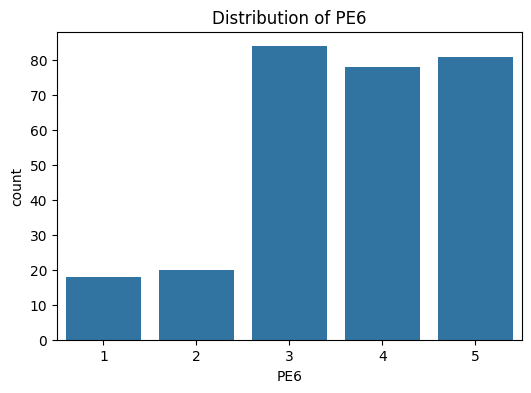

In [ ]:
#Distribution plots for Physical Environment
for col in ["PE1", "PE2", "PE3", "PE4","PE5", "PE6"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

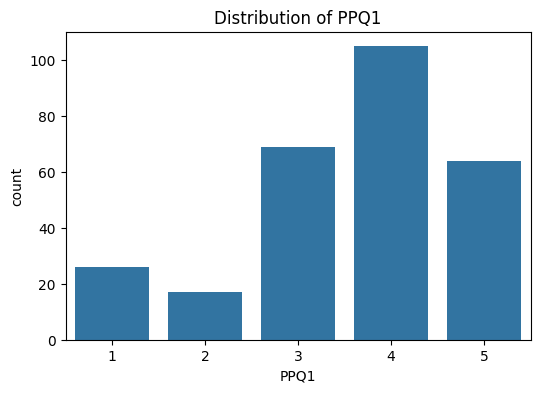

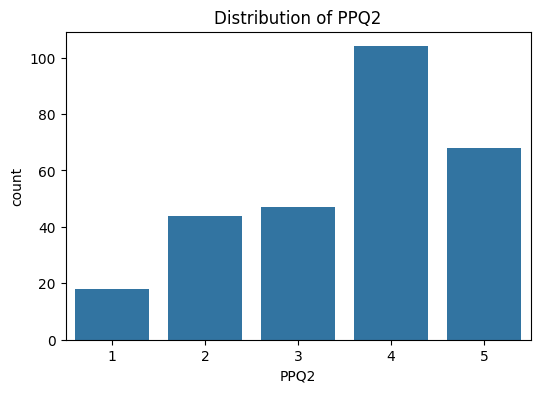

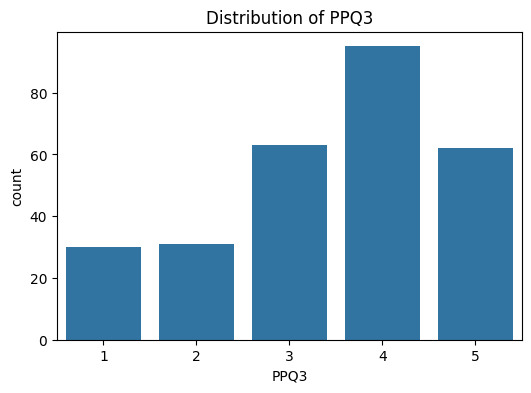

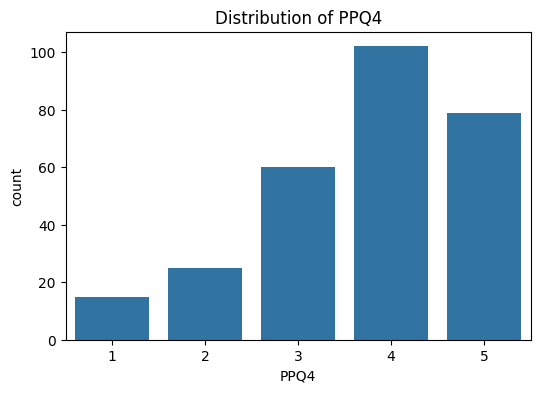

In [ ]:
#Distribution plots for Product Quality
for col in ["PPQ1", "PPQ2", "PPQ3", "PPQ4"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

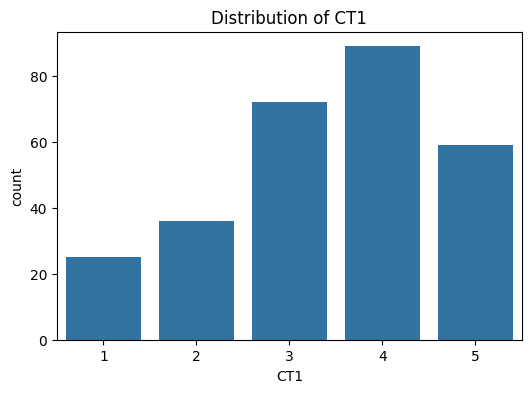

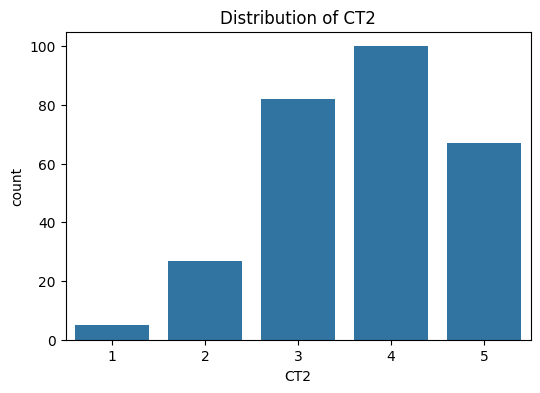

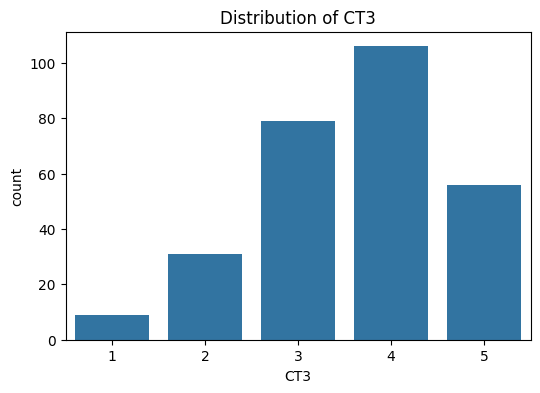

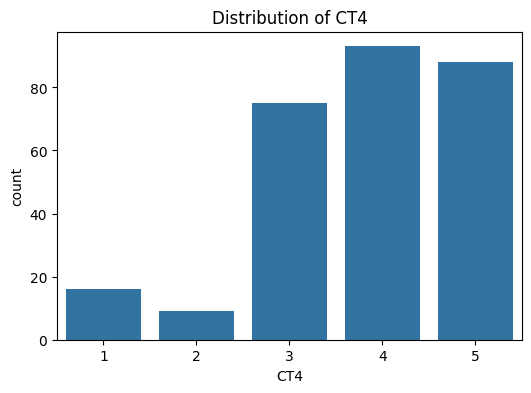

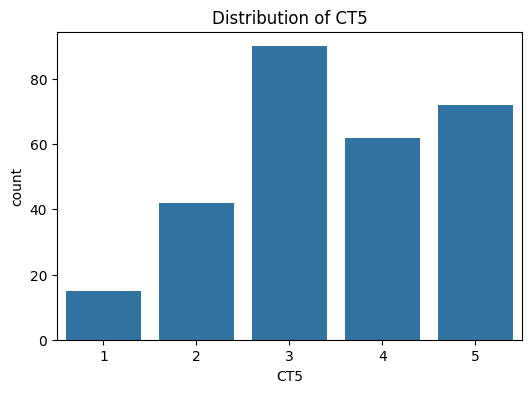

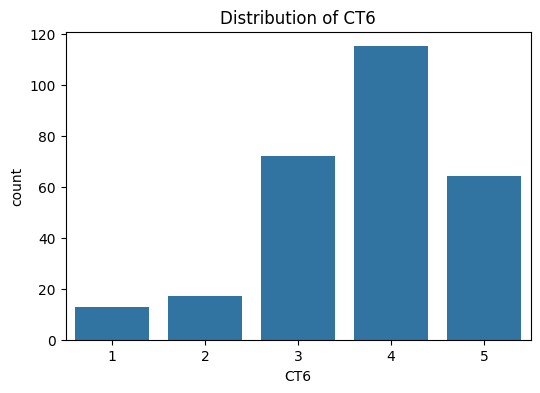

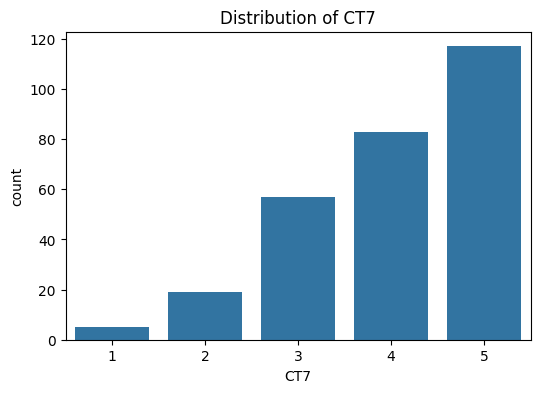

In [ ]:
#Distribution plots for Trust
for col in ["CT1", "CT2", "CT3", "CT4", "CT5", "CT6","CT7"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

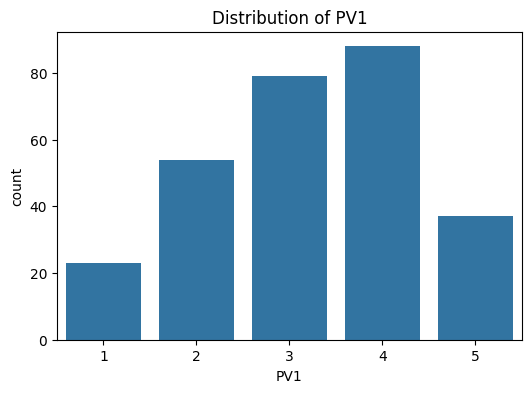

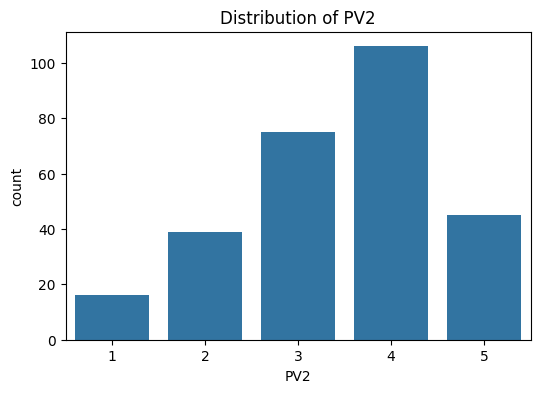

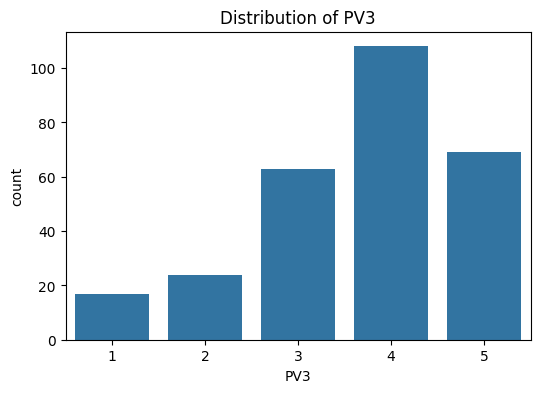

In [ ]:
#Distribution plots for Value
for col in ["PV1", "PV2", "PV3"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

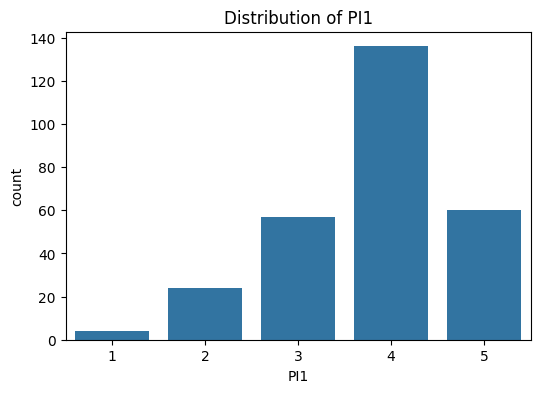

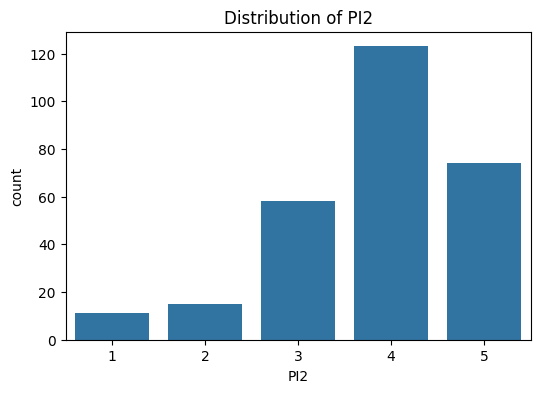

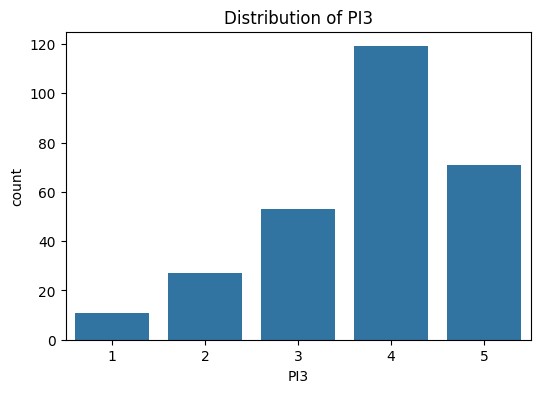

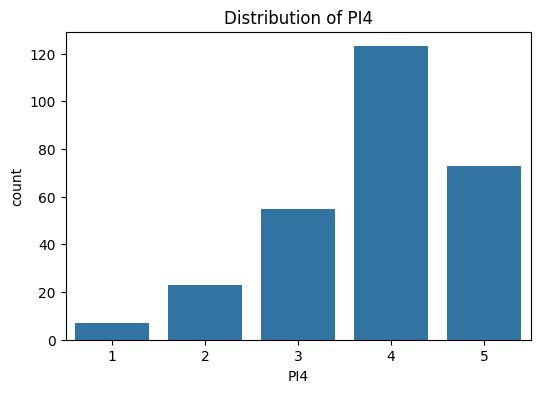

In [ ]:
#Distribution plots for Purchase Intention
for col in ["PI1", "PI2", "PI3", "PI4"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f"Distribution of {col}")
    plt.show()

###**3. Comprehensive Exploratory Data Analysis**

The comprehensive EDA revealed critical data characteristics and underlying relationships essential for feature engineering and Bayesian Network (BN) construction.

---

**Summary for Feature Engineering**

The dataset is composed entirely of 37 numerical categorical variables with zero missing values, simplifying initial cleaning. Due to the limited sample size ($N=281$) and the high count of 93 duplicate rows, these duplicates were retained to prevent information loss. Critically, the original 37-variable count was deemed excessive and noisy for effective DAG construction, mandating a focused feature selection process.

The correlation analysis revealed strong internal consistency, particularly among the four Purchase Intention (PI) items (up to $r = 0.954$), which are highly collinear and essentially measure the same latent construct. Beyond the PI items, the strongest predictors of Purchase Intention consistently emerged as PV3 (Perceived Value) and CT2/CT5 (Customer Trust). This outcome guides the BN feature engineering by prioritizing Perceived Value and Customer Trust constructs in the reduced feature set, ensuring the initial DAG is built on the most influential and interpretable variables.

####**Univariate Analysis: Data Quality Assessment**

In [ ]:
#Missing Values Analysis
missing_counts = soweto_retail_data.isnull().sum()
missing_summary = pd.DataFrame({'Missing Count': missing_counts, })
print("Missing data summary:\n", missing_summary)

Missing data summary:
                     Missing Count
Gender                          0
Age                             0
Marital Status                  0
Employment Status               0
Level of Education              0
Regular Customer                0
Shopping frequency              0
E1                              0
E2                              0
E3                              0
E4                              0
C1                              0
C2                              0
C3                              0
PS1                             0
PS2                             0
PS3                             0
PE1                             0
PE2                             0
PE3                             0
PE4                             0
PE5                             0
PE6                             0
PPQ1                            0
PPQ2                            0
PPQ3                            0
PPQ4                            0
CT1                      

In [ ]:
#Duplicate Data Detection
duplicates = soweto_retail_data.duplicated().sum()
print(f"Exact duplicate rows: {duplicates}")

Exact duplicate rows: 93


In [ ]:
#Identify categorical vs continuous
categorical_cols = soweto_retail_data.select_dtypes(include='object').columns.tolist()
numeric_cols = soweto_retail_data.select_dtypes(include=np.number).columns.tolist()
print("Categorical columns:", categorical_cols)
print("Numeric columns:", numeric_cols)

Categorical columns: []
Numeric columns: ['Gender', 'Age', 'Marital Status', 'Employment Status', 'Level of Education', 'Regular Customer', 'Shopping frequency', 'E1', 'E2', 'E3', 'E4', 'C1', 'C2', 'C3', 'PS1', 'PS2', 'PS3', 'PE1', 'PE2', 'PE3', 'PE4', 'PE5', 'PE6', 'PPQ1', 'PPQ2', 'PPQ3', 'PPQ4', 'CT1', 'CT2', 'CT3', 'CT4', 'CT5', 'CT6', 'CT7', 'PV1', 'PV2', 'PV3', 'PI1', 'PI2', 'PI3', 'PI4']


####**Univariate Analysis: Distribution Analysis (Histograms with KDE)**

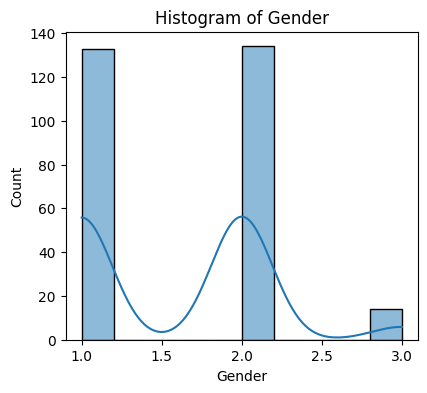

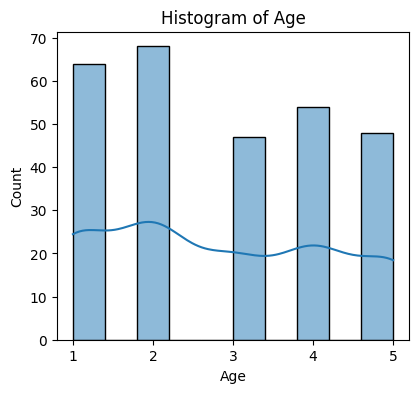

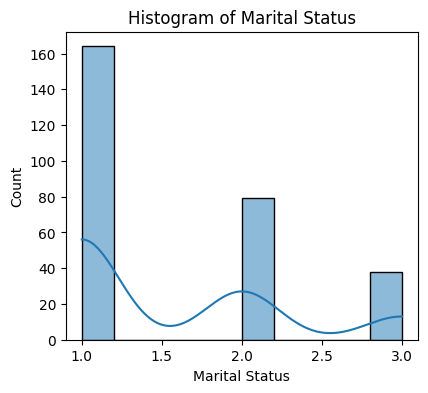

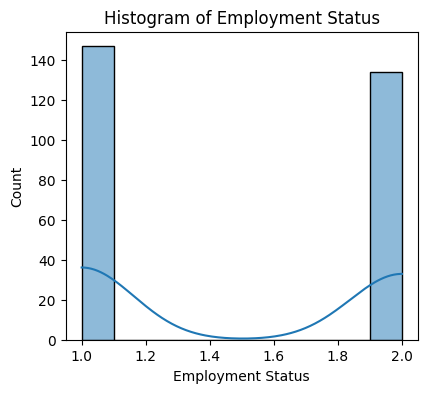

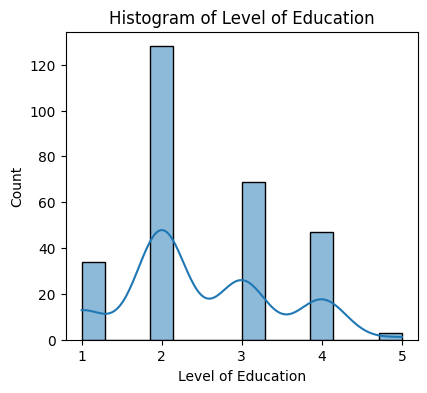

...

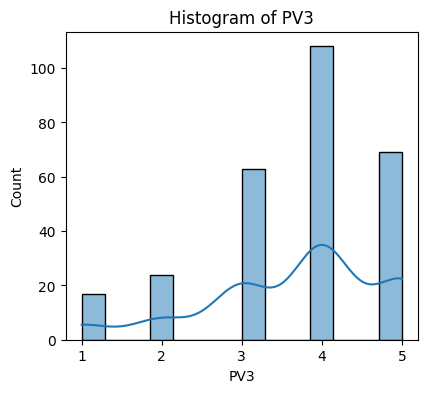

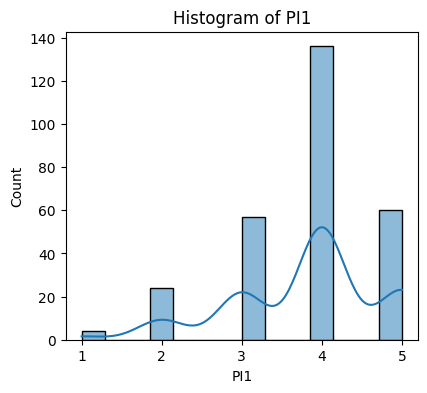

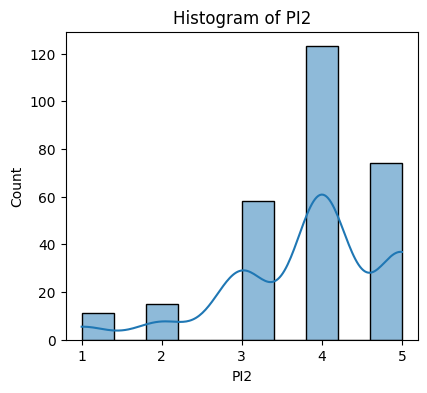

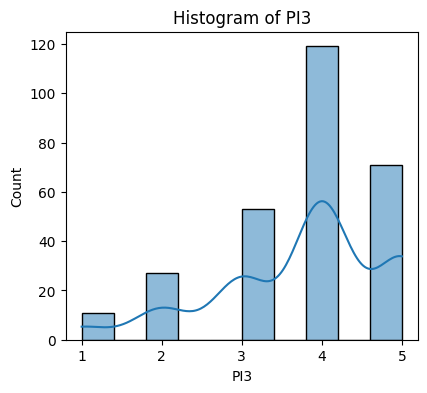

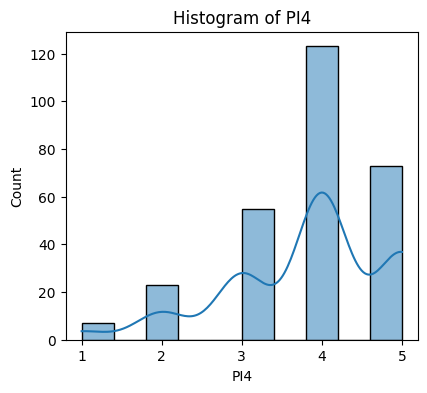

In [ ]:
#Histograms with KDE for numeric variables
for col in numeric_cols:
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    sns.histplot(soweto_retail_data[col], kde=True)
    plt.title(f'Histogram of {col}')
    plt.show()

Distribution of all variables:


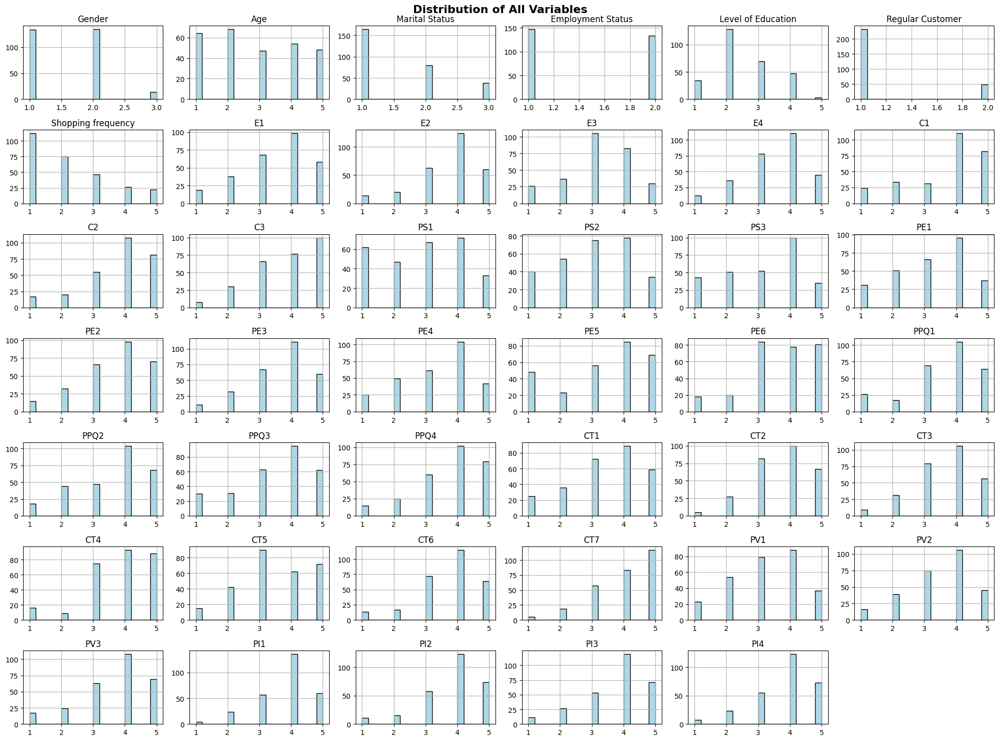

In [ ]:
#Distribution plots for all variables
print("Distribution of all variables:")
soweto_retail_data.hist(figsize=(20, 15), bins=20, color='lightblue', edgecolor='black')
plt.suptitle('Distribution of All Variables', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Frequency counts for Gender:
 Gender
1    133
2    134
3     14
Name: count, dtype: int64


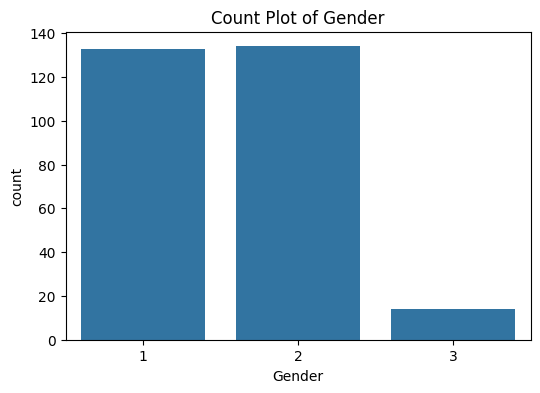


Frequency counts for Age:
 Age
1    64
2    68
3    47
4    54
5    48
Name: count, dtype: int64


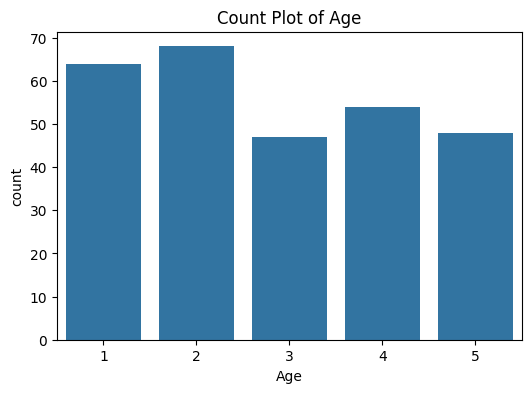


Frequency counts for Marital Status:
 Marital Status
1    164
2     79
3     38
Name: count, dtype: int64


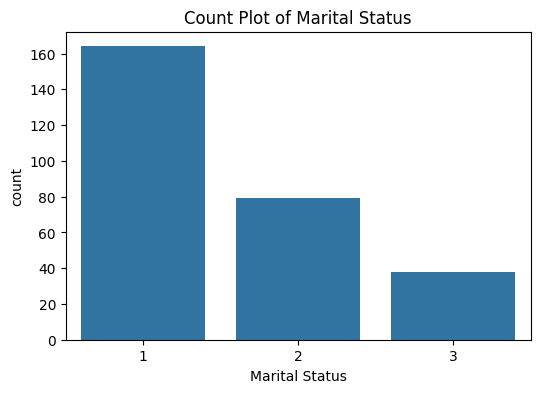


Frequency counts for Employment Status:
 Employment Status
1    147
2    134
Name: count, dtype: int64


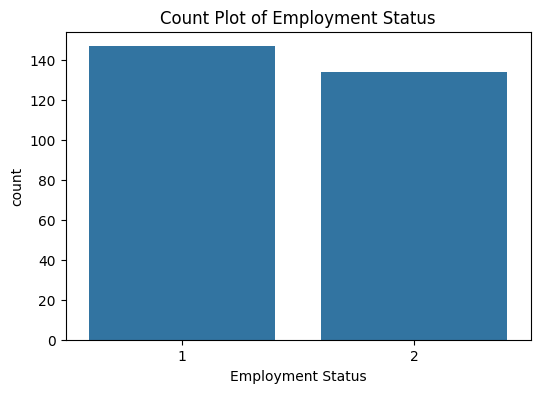


Frequency counts for Level of Education:
 Level of Education
1     34
2    128
3     69
4     47
5      3
Name: count, dtype: int64


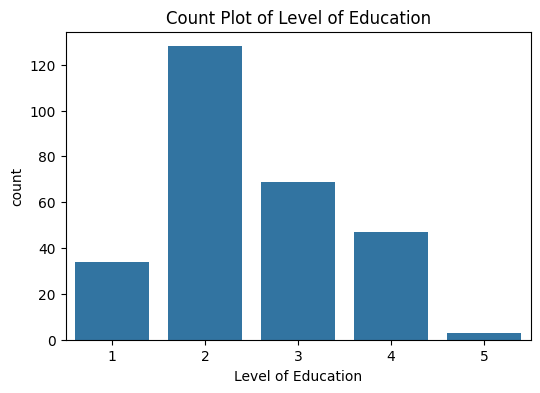


Frequency counts for Regular Customer:
 Regular Customer
1    232
2     49
Name: count, dtype: int64


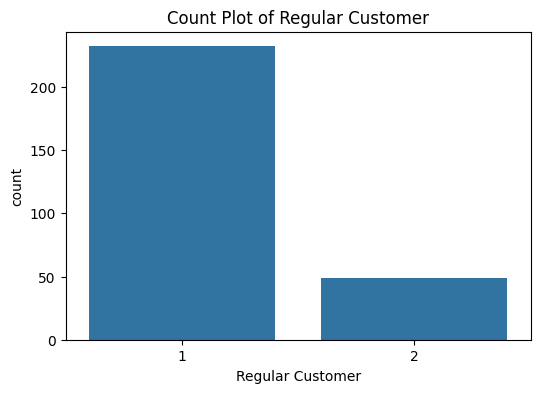


Frequency counts for Shopping frequency:
 Shopping frequency
1    112
2     75
3     46
4     26
5     22
Name: count, dtype: int64


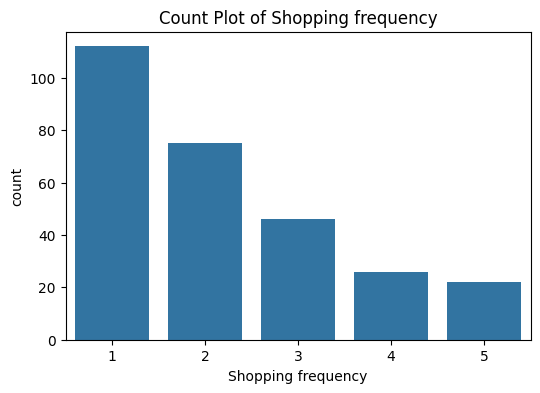


Frequency counts for E1:
 E1
1    19
2    38
3    68
4    98
5    58
Name: count, dtype: int64


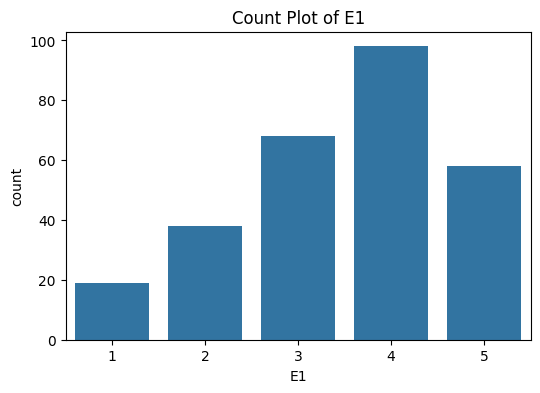


Frequency counts for E2:
 E2
1     14
2     20
3     63
4    124
5     60
Name: count, dtype: int64


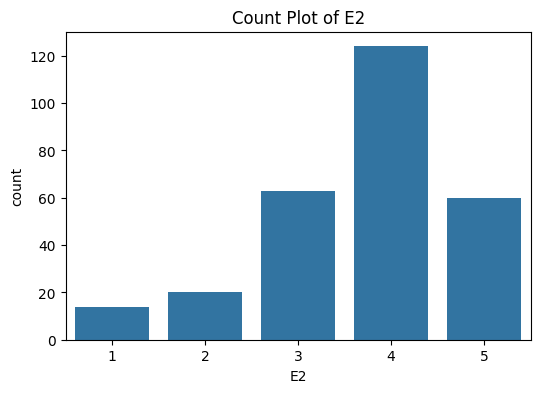


Frequency counts for E3:
 E3
1     26
2     37
3    105
4     83
5     30
Name: count, dtype: int64


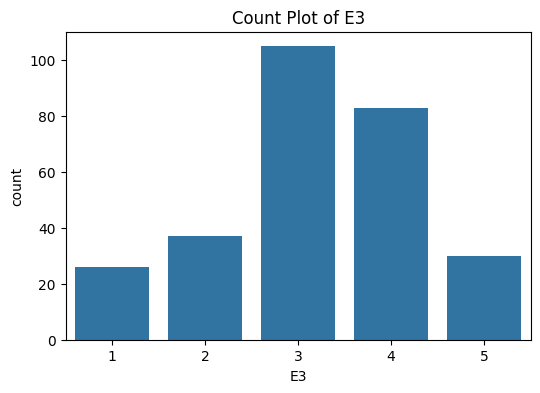


Frequency counts for E4:
 E4
1     12
2     36
3     78
4    110
5     45
Name: count, dtype: int64


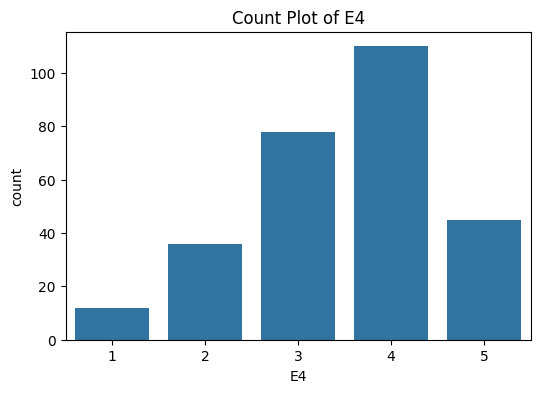


Frequency counts for C1:
 C1
1     24
2     34
3     31
4    110
5     82
Name: count, dtype: int64


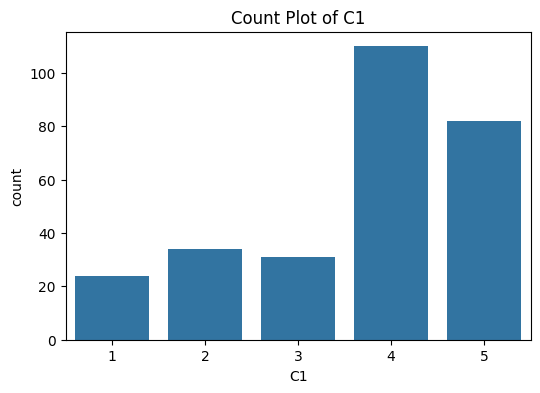


Frequency counts for C2:
 C2
1     17
2     20
3     55
4    108
5     81
Name: count, dtype: int64


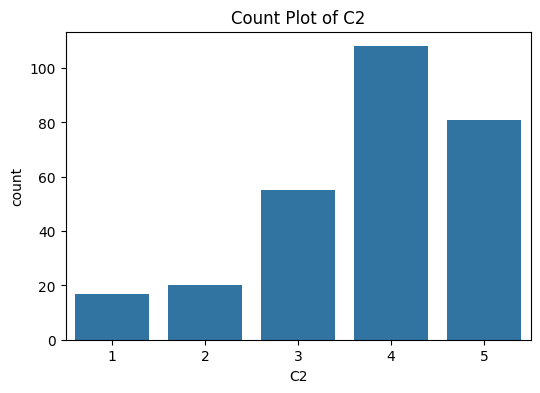


Frequency counts for C3:
 C3
1      8
2     30
3     66
4     77
5    100
Name: count, dtype: int64


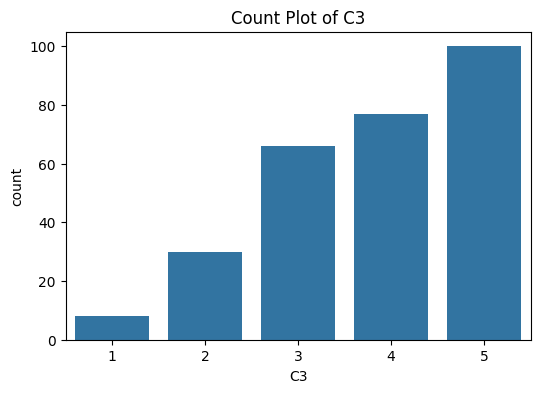


Frequency counts for PS1:
 PS1
1    62
2    47
3    67
4    72
5    33
Name: count, dtype: int64


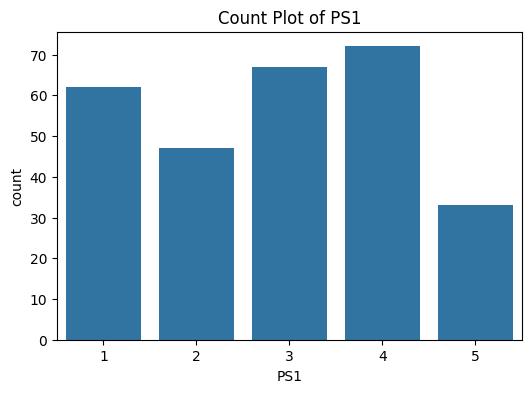


Frequency counts for PS2:
 PS2
1    40
2    54
3    75
4    78
5    34
Name: count, dtype: int64


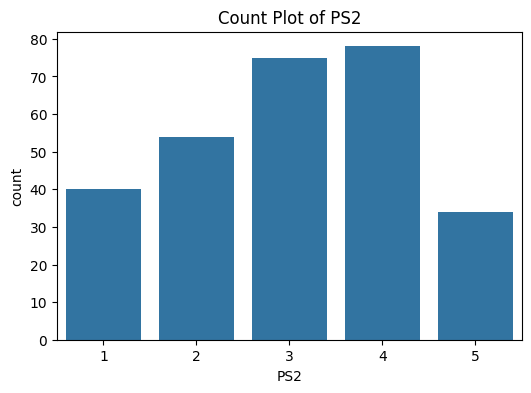


Frequency counts for PS3:
 PS3
1     43
2     51
3     52
4    100
5     35
Name: count, dtype: int64


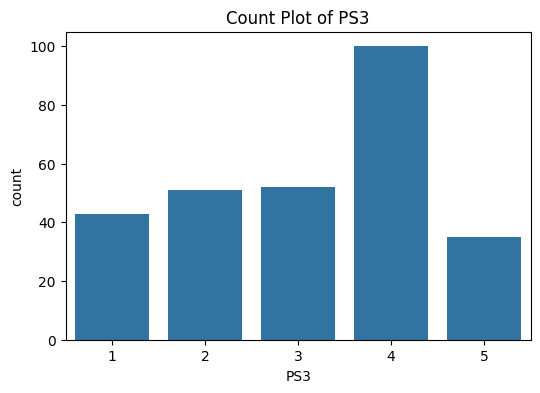


Frequency counts for PE1:
 PE1
1    31
2    51
3    66
4    96
5    37
Name: count, dtype: int64


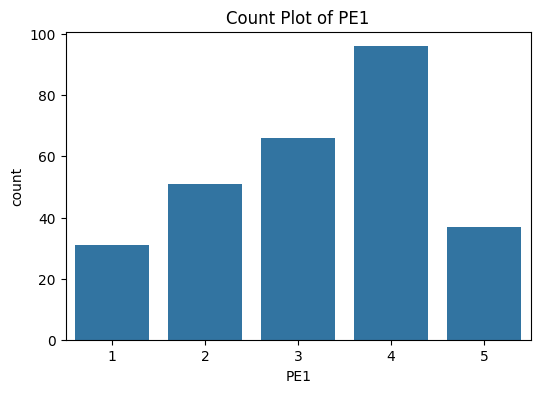


Frequency counts for PE2:
 PE2
1    15
2    32
3    66
4    98
5    70
Name: count, dtype: int64


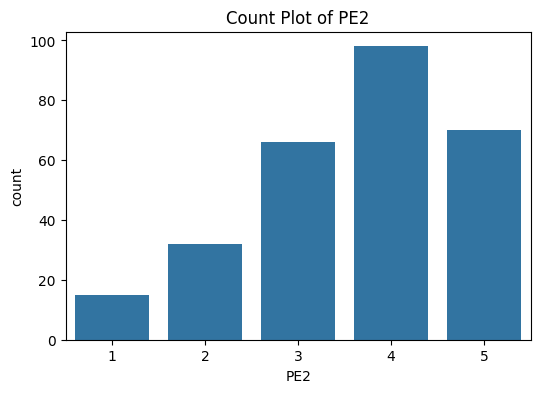


Frequency counts for PE3:
 PE3
1     11
2     32
3     67
4    111
5     60
Name: count, dtype: int64


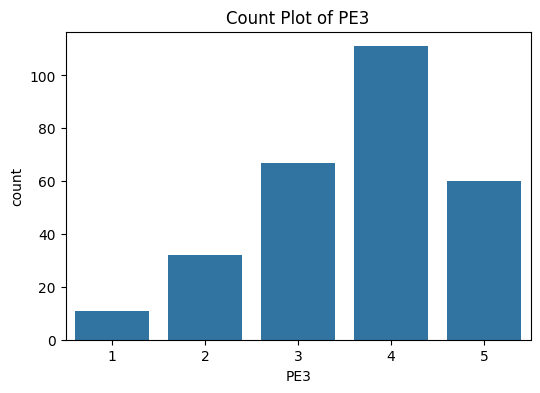


Frequency counts for PE4:
 PE4
1     25
2     49
3     61
4    104
5     42
Name: count, dtype: int64


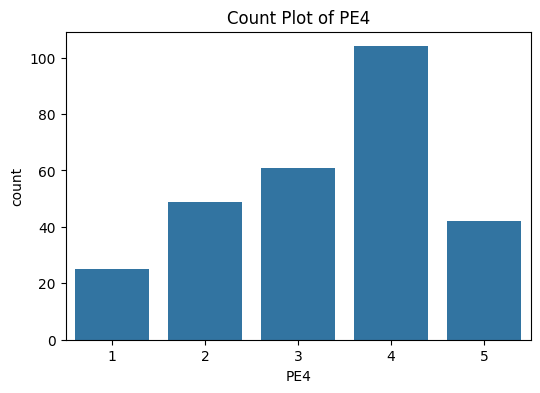


Frequency counts for PE5:
 PE5
1    48
2    23
3    56
4    85
5    69
Name: count, dtype: int64


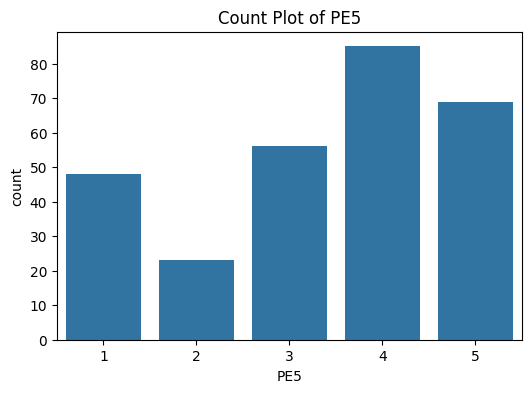


Frequency counts for PE6:
 PE6
1    18
2    20
3    84
4    78
5    81
Name: count, dtype: int64


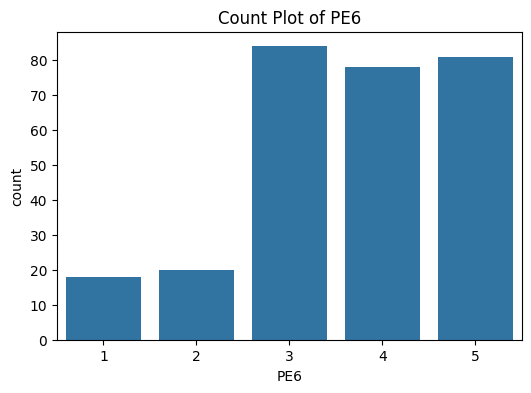


Frequency counts for PPQ1:
 PPQ1
1     26
2     17
3     69
4    105
5     64
Name: count, dtype: int64


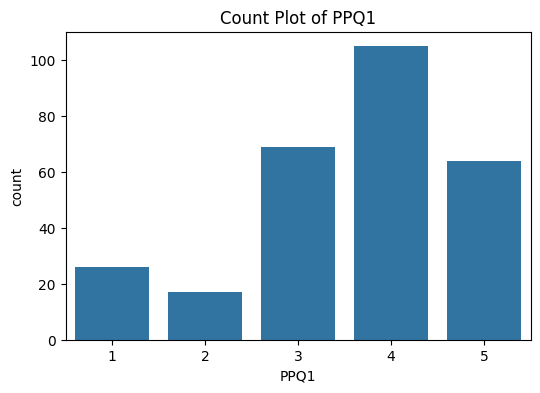


Frequency counts for PPQ2:
 PPQ2
1     18
2     44
3     47
4    104
5     68
Name: count, dtype: int64


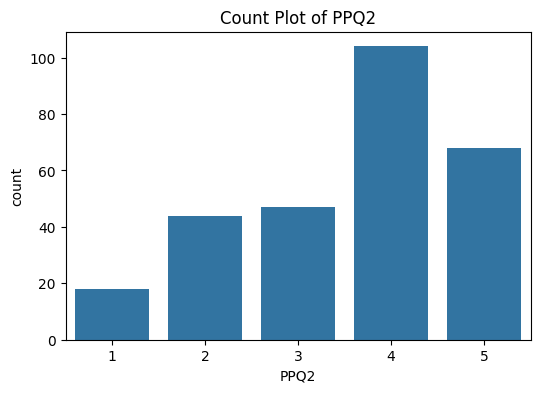


Frequency counts for PPQ3:
 PPQ3
1    30
2    31
3    63
4    95
5    62
Name: count, dtype: int64


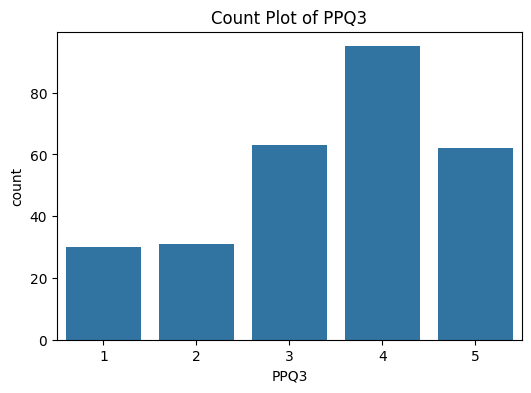


Frequency counts for PPQ4:
 PPQ4
1     15
2     25
3     60
4    102
5     79
Name: count, dtype: int64


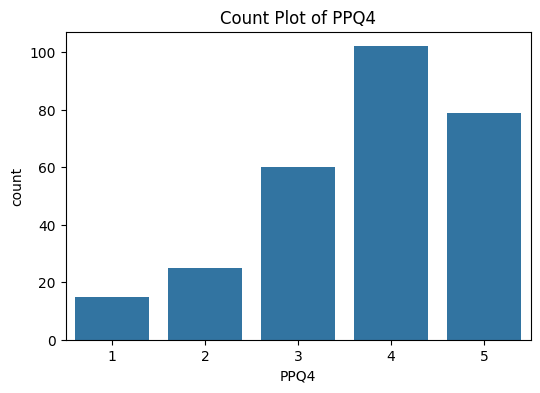


Frequency counts for CT1:
 CT1
1    25
2    36
3    72
4    89
5    59
Name: count, dtype: int64


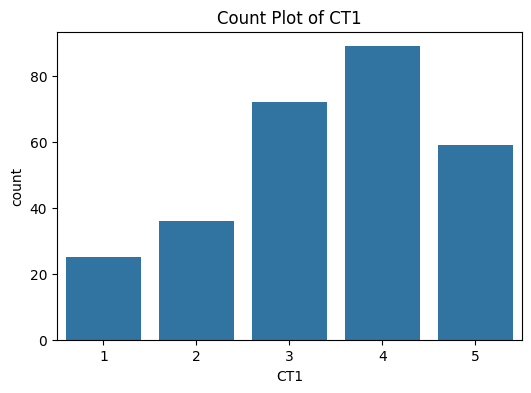


Frequency counts for CT2:
 CT2
1      5
2     27
3     82
4    100
5     67
Name: count, dtype: int64


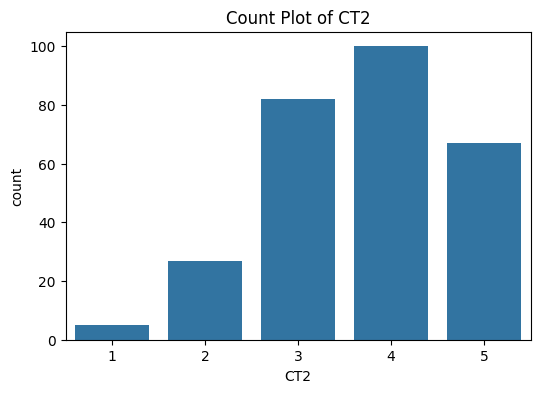


Frequency counts for CT3:
 CT3
1      9
2     31
3     79
4    106
5     56
Name: count, dtype: int64


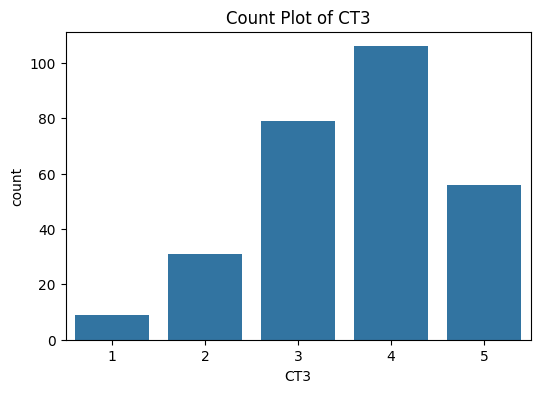


Frequency counts for CT4:
 CT4
1    16
2     9
3    75
4    93
5    88
Name: count, dtype: int64


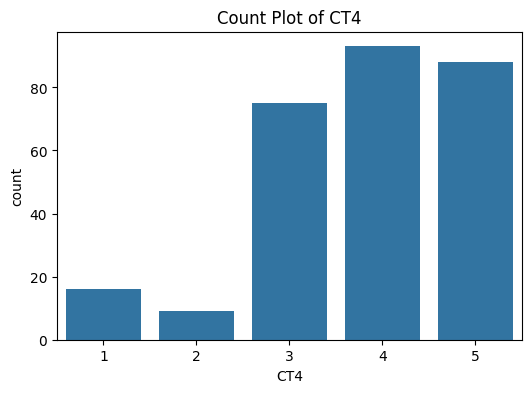


Frequency counts for CT5:
 CT5
1    15
2    42
3    90
4    62
5    72
Name: count, dtype: int64


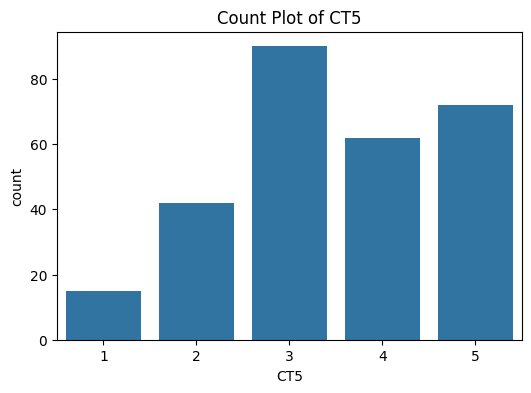


Frequency counts for CT6:
 CT6
1     13
2     17
3     72
4    115
5     64
Name: count, dtype: int64


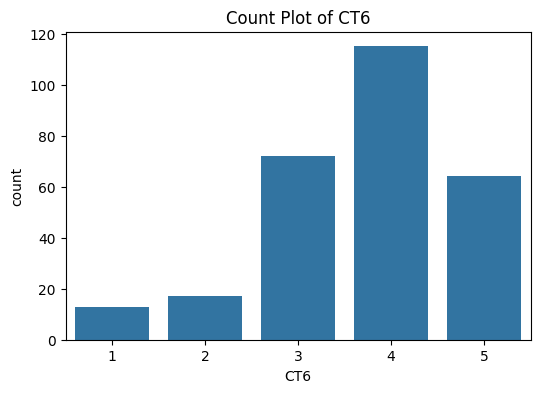


Frequency counts for CT7:
 CT7
1      5
2     19
3     57
4     83
5    117
Name: count, dtype: int64


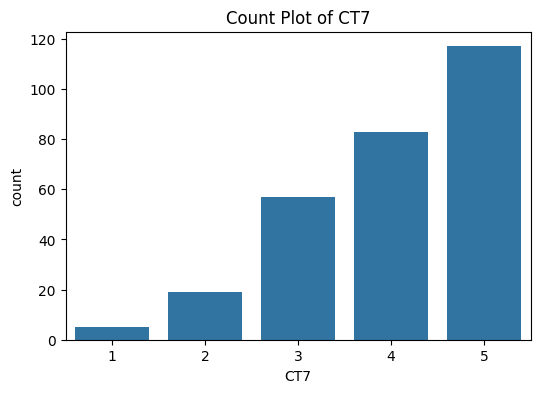


Frequency counts for PV1:
 PV1
1    23
2    54
3    79
4    88
5    37
Name: count, dtype: int64


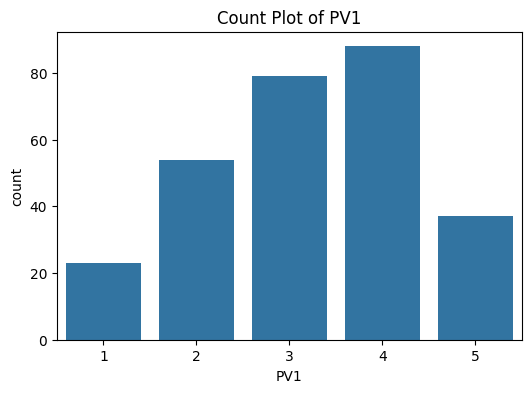


Frequency counts for PV2:
 PV2
1     16
2     39
3     75
4    106
5     45
Name: count, dtype: int64


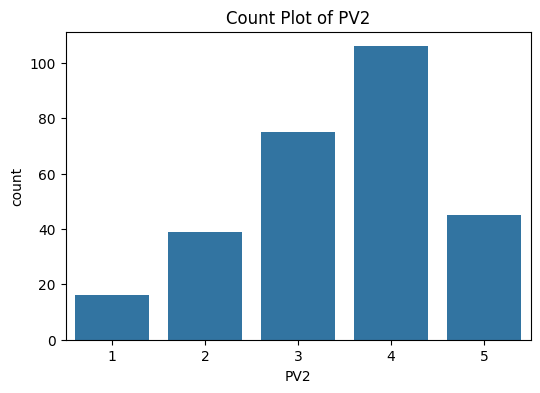


Frequency counts for PV3:
 PV3
1     17
2     24
3     63
4    108
5     69
Name: count, dtype: int64


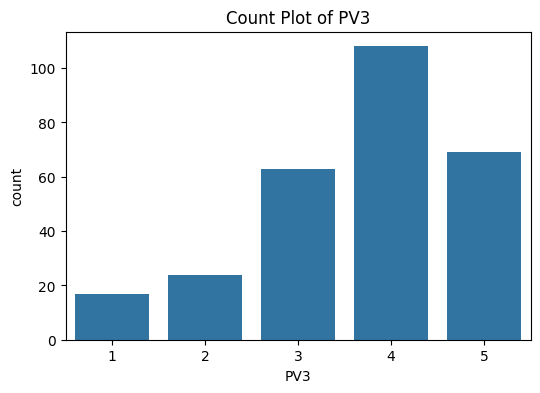


Frequency counts for PI1:
 PI1
1      4
2     24
3     57
4    136
5     60
Name: count, dtype: int64


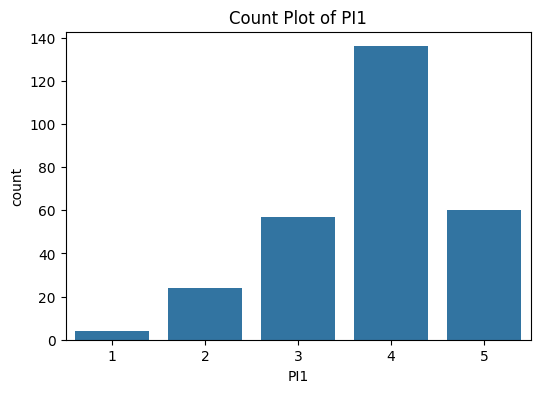


Frequency counts for PI2:
 PI2
1     11
2     15
3     58
4    123
5     74
Name: count, dtype: int64


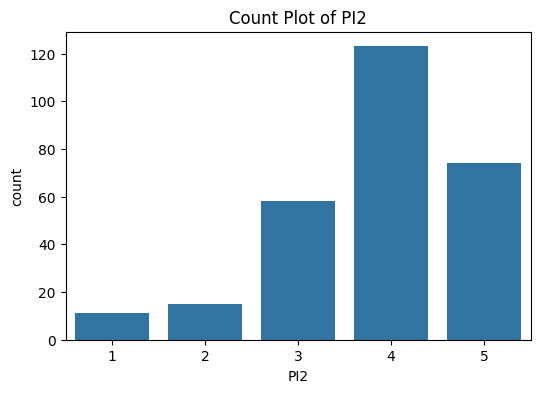


Frequency counts for PI3:
 PI3
1     11
2     27
3     53
4    119
5     71
Name: count, dtype: int64


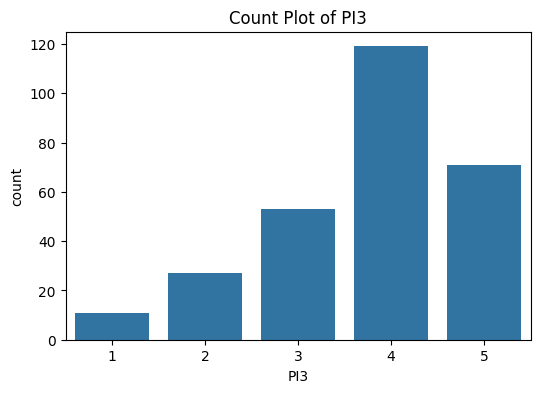


Frequency counts for PI4:
 PI4
1      7
2     23
3     55
4    123
5     73
Name: count, dtype: int64


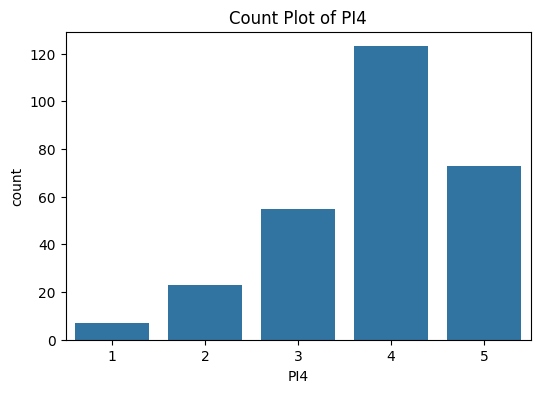

In [ ]:
#Univariate Analysis for Discrete Variables
for col in soweto_retail_data.columns:
    counts = soweto_retail_data[col].value_counts().sort_index()
    print(f"\nFrequency counts for {col}:\n", counts)
    plt.figure(figsize=(6,4))
    sns.countplot(x=soweto_retail_data[col])
    plt.title(f'Count Plot of {col}')
    plt.show()

####**Univariate Analysis: Outlier Analysis (Boxplots)**

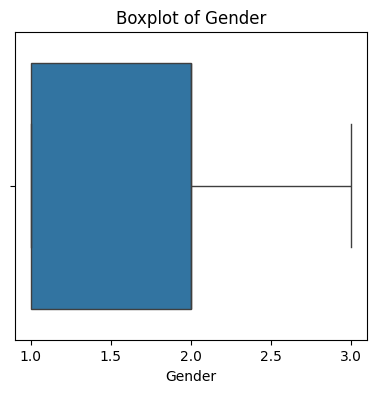

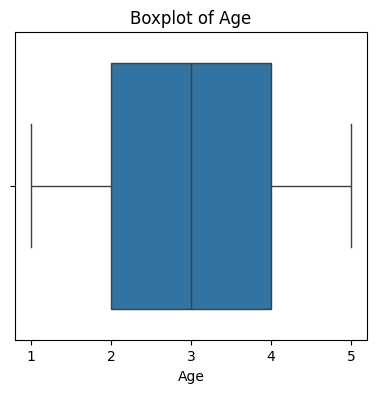

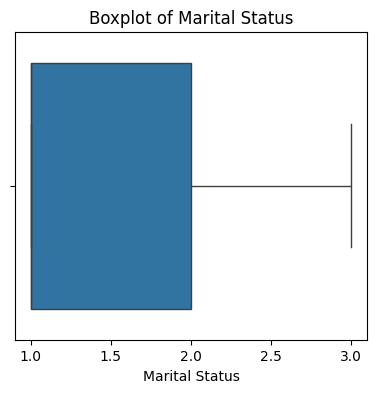

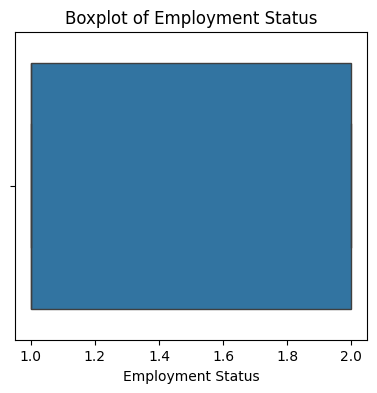

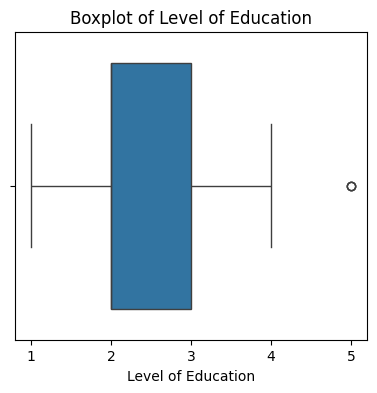

...

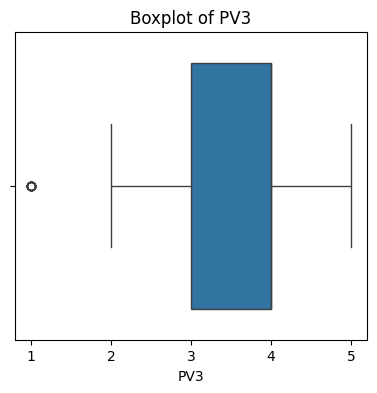

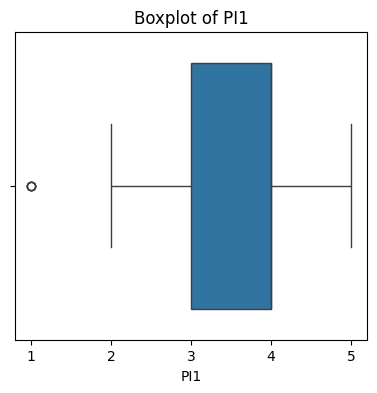

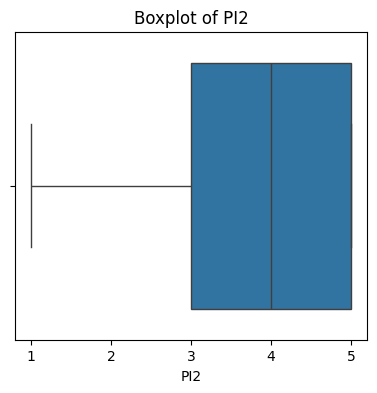

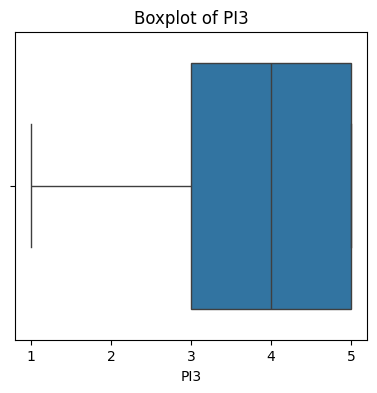

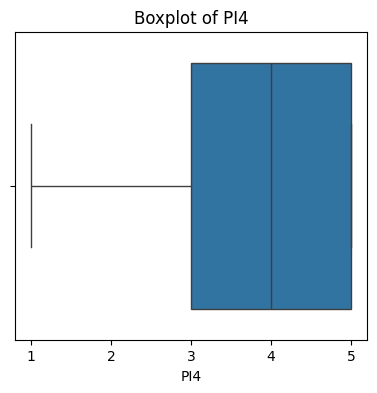

In [ ]:
#Boxplots for all variables
for col in numeric_cols:
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,2)
    sns.boxplot(x=soweto_retail_data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

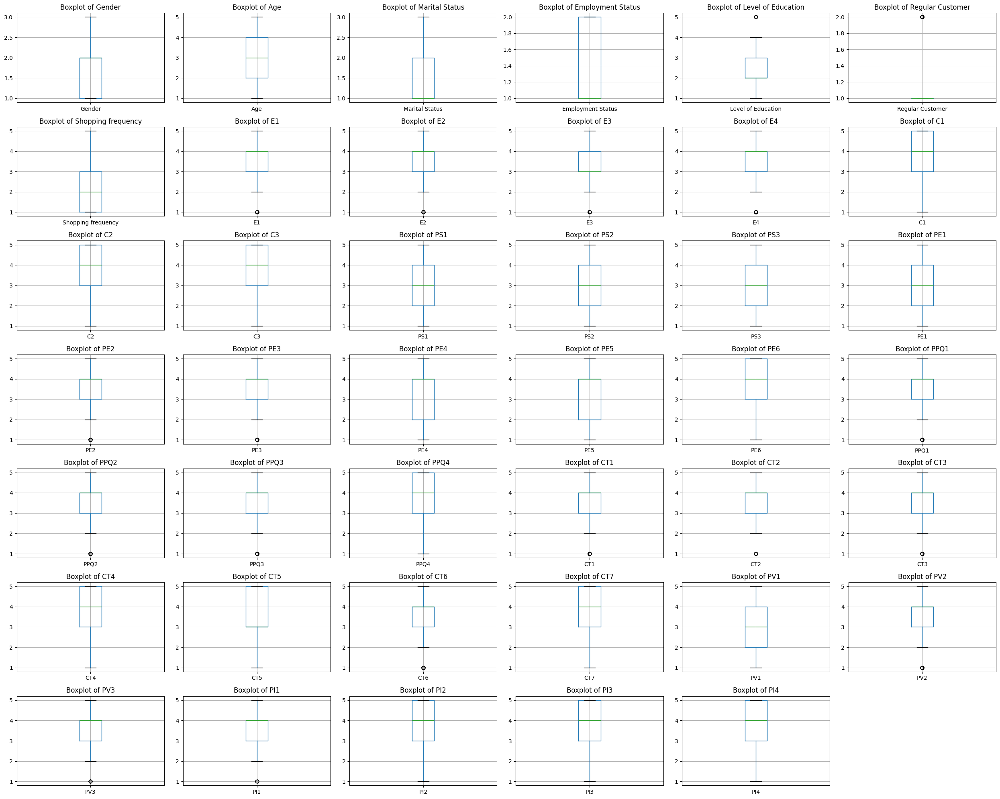

In [ ]:
#Boxplots to detect outliers
numeric_cols = soweto_retail_data.select_dtypes(include=[np.number]).columns
fig, axes = plt.subplots(7, 6, figsize=(25, 20))
axes = axes.ravel()

for i, col in enumerate(numeric_cols):
    if i < len(axes):
        soweto_retail_data.boxplot(column=col, ax=axes[i])
        axes[i].set_title(f'Boxplot of {col}')

#Remove empty subplots
for i in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

####**Bivariate Analysis**

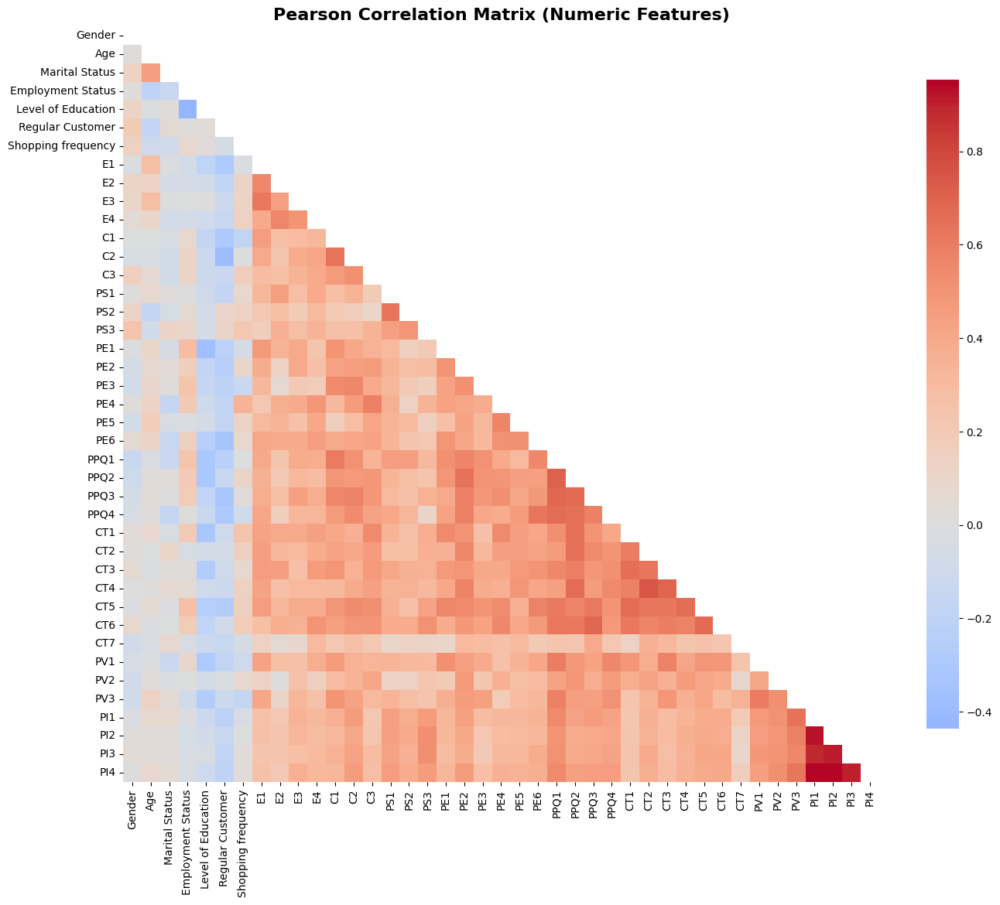

In [ ]:
#Pearson Correlation Matrix Heatmap
correlation_matrix = soweto_retail_data[numeric_cols].corr(method='pearson')

plt.figure(figsize=(14, 12))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool)) # Mask upper triangle
sns.heatmap(correlation_matrix, mask=mask, annot=False, fmt=".2f", cmap='coolwarm', center=0,
             square=True, cbar_kws={"shrink": .8})
plt.title('Pearson Correlation Matrix (Numeric Features)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
#Highly Correlated Pair Identification
print("\nIdentification of Highly Correlated Numeric Pairs (e.g., |r| >= 0.7):")
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        #Using a consistent threshold (0.7) for strong correlation
        if abs(correlation_matrix.iloc[i, j]) >= 0.7:
            high_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                correlation_matrix.iloc[i, j]
            ))

print(f"Strong correlations found: {len(high_corr_pairs)} pairs")
for pair in high_corr_pairs:
     print(f"  - {pair[0]} and {pair[1]}: r = {pair[2]:.3f}")


Identification of Highly Correlated Numeric Pairs (e.g., |r| >= 0.7):
Strong correlations found: 8 pairs
  - PPQ1 and PPQ2: r = 0.708
  - CT2 and CT4: r = 0.751
  - PI1 and PI2: r = 0.924
  - PI1 and PI3: r = 0.886
  - PI1 and PI4: r = 0.948
  - PI2 and PI3: r = 0.907
  - PI2 and PI4: r = 0.954
  - PI3 and PI4: r = 0.903


In [ ]:
#Moderately Correlated Pair Identification
print("\nIdentification of Highly Correlated Numeric Pairs (e.g., |r| >= 0.7):")
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        #Using a consistent threshold (0.5) for moderate correlation
        if abs(correlation_matrix.iloc[i, j]) >= 0.5 and abs(correlation_matrix.iloc[i, j]) <= 0.7:
            high_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                correlation_matrix.iloc[i, j]
            ))

print(f"Moderate correlations found: {len(high_corr_pairs)} pairs")
for pair in high_corr_pairs:
     print(f"  - {pair[0]} and {pair[1]}: r = {pair[2]:.3f}")


Identification of Highly Correlated Numeric Pairs (e.g., |r| >= 0.7):
Moderate correlations found: 102 pairs
  - E1 and E2: r = 0.553
  - E1 and E3: r = 0.620
  - E2 and E4: r = 0.561
  - E4 and CT6: r = 0.503
  - C1 and C2: r = 0.637
  - C1 and PE1: r = 0.503
  - C1 and PE3: r = 0.539
  - C1 and PPQ1: r = 0.606
  - C1 and PPQ3: r = 0.558
  - C2 and C3: r = 0.519
  - C2 and PE3: r = 0.559
  - C2 and PPQ1: r = 0.511
  - C2 and PPQ3: r = 0.574
  - C2 and PPQ4: r = 0.538
  - C2 and CT5: r = 0.540
  - C3 and PE4: r = 0.586
  - C3 and CT1: r = 0.536
  - C3 and CT5: r = 0.527
  - PS1 and PS2: r = 0.638
  - PS3 and CT6: r = 0.513
  - PS3 and PI2: r = 0.520
  - PS3 and PI3: r = 0.522
  - PE1 and PE2: r = 0.507
  - PE1 and PPQ1: r = 0.516
  - PE1 and CT1: r = 0.550
  - PE1 and CT5: r = 0.560
  - PE1 and PV1: r = 0.515
  - PE2 and PE3: r = 0.514
  - PE2 and PPQ1: r = 0.564
  - PE2 and PPQ2: r = 0.639
  - PE2 and PPQ3: r = 0.583
  - PE2 and PPQ4: r = 0.582
  - PE2 and CT1: r = 0.506
  - PE2 and 

In [ ]:
#Cramér's V Function Definition (Essential utility function)
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k-1, r-1))

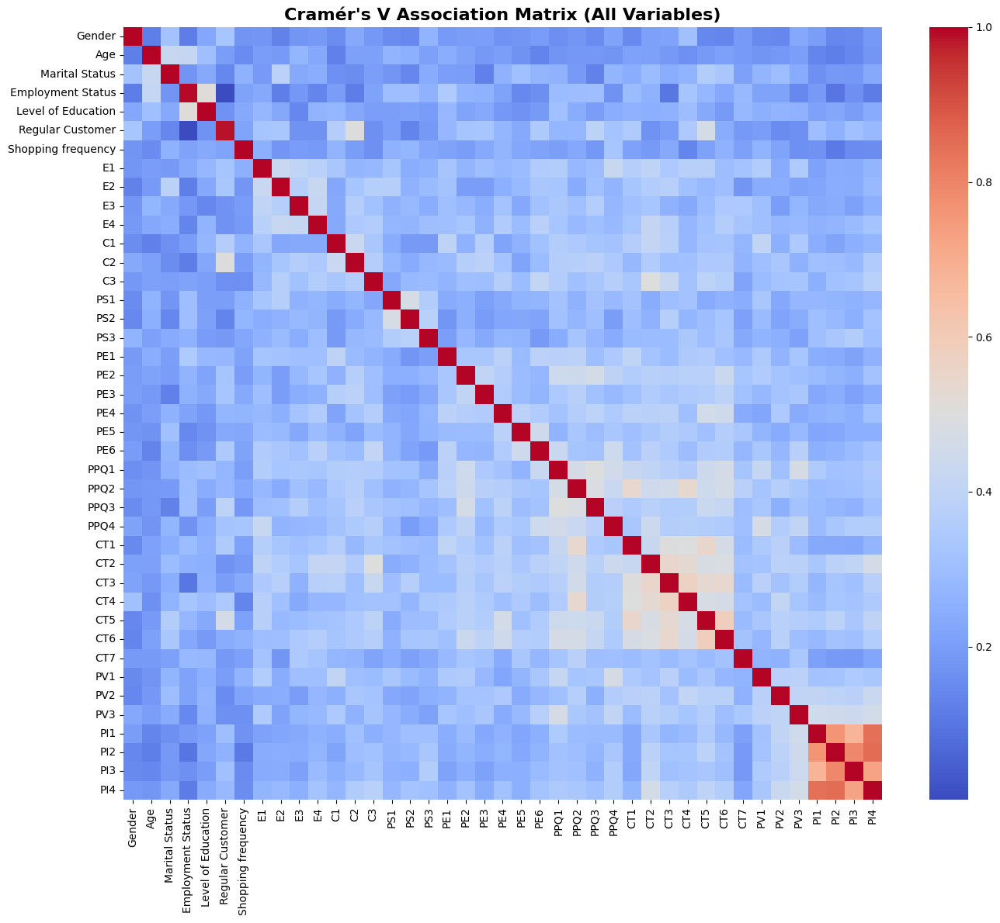

In [ ]:
#Pairwise Association Matrix (Cramér's V Heatmap)
assoc_matrix = pd.DataFrame(index=soweto_retail_data.columns, columns=soweto_retail_data.columns)
for col1 in soweto_retail_data.columns:
    for col2 in soweto_retail_data.columns:
        assoc_matrix.loc[col1, col2] = cramers_v(soweto_retail_data[col1], soweto_retail_data[col2])
assoc_matrix = assoc_matrix.astype(float)

plt.figure(figsize=(14, 12))
sns.heatmap(assoc_matrix, cmap='coolwarm', annot=False, fmt=".2f")
plt.title("Cramér's V Association Matrix (All Variables)", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
#Target Variable Association (Purchase Intention)
purchase_intention = ['PI1','PI2','PI3','PI4']
pi_assoc_summary = pd.DataFrame(index=soweto_retail_data.columns, columns=purchase_intention)

#Calculate PI associations Once
for pi in purchase_intention:
    for col in soweto_retail_data.columns:
        if col != pi:
            v = cramers_v(soweto_retail_data[col], soweto_retail_data[pi])
            pi_assoc_summary.loc[col, pi] = v
pi_assoc_summary = pi_assoc_summary.astype(float)

#Loop for printing ranking and visualization (Using pre-calculated data)
for pi in purchase_intention:
    ranked_features = pi_assoc_summary[pi].sort_values(ascending=False).drop(pi, errors='ignore') # Drop self-correlation

    print(f"\nAssociation with Target Variable: {pi}")
    print(f"Top 5 Features:\n", ranked_features.head(5))


Association with Target Variable: PI1
Top 5 Features:
 PI4    0.843299
PI2    0.764731
PI3    0.676711
PV3    0.451649
PV2    0.406077
Name: PI1, dtype: float64

Association with Target Variable: PI2
Top 5 Features:
 PI4    0.851218
PI3    0.792011
PI1    0.764731
PV3    0.448181
CT5    0.392151
Name: PI2, dtype: float64

Association with Target Variable: PI3
Top 5 Features:
 PI2    0.792011
PI4    0.725856
PI1    0.676711
PV3    0.438271
CT2    0.403417
Name: PI3, dtype: float64

Association with Target Variable: PI4
Top 5 Features:
 PI2    0.851218
PI1    0.843299
PI3    0.725856
CT2    0.465404
PV3    0.460741
Name: PI4, dtype: float64


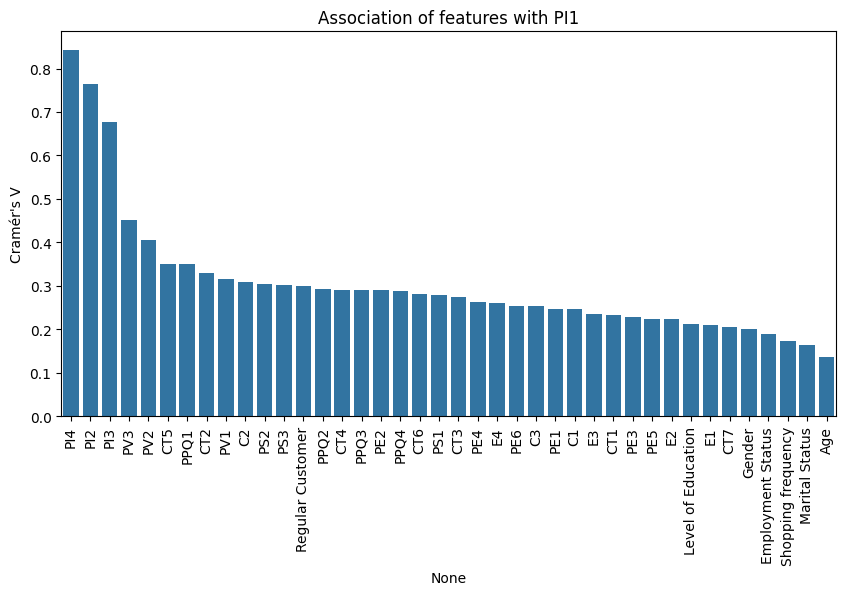

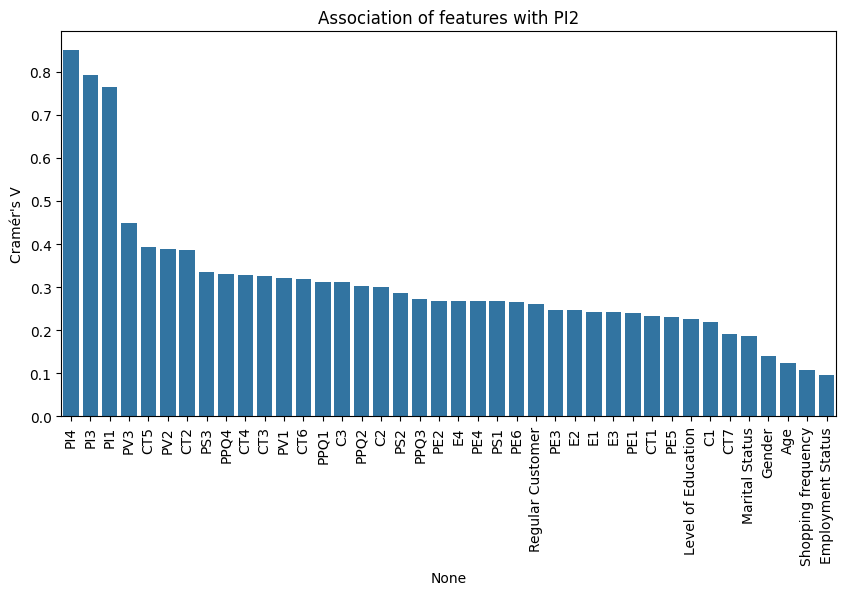

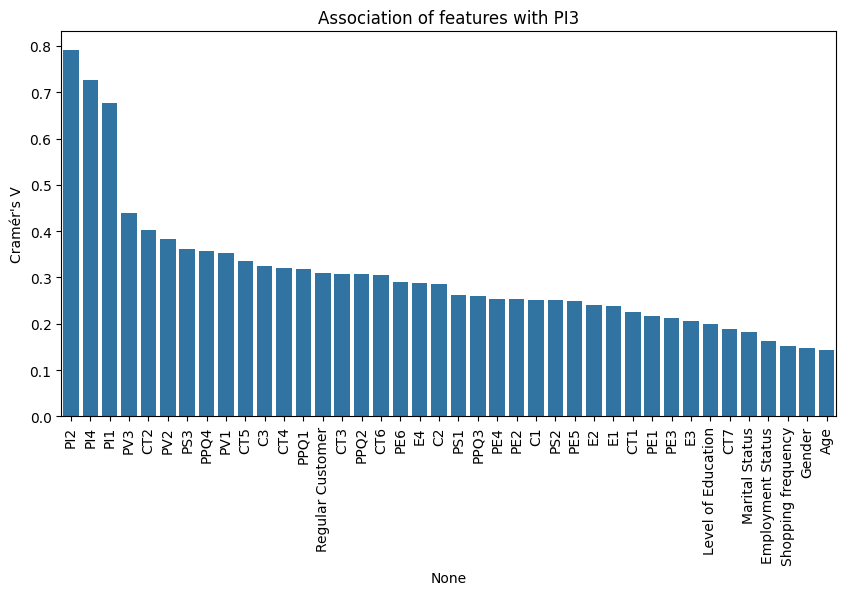

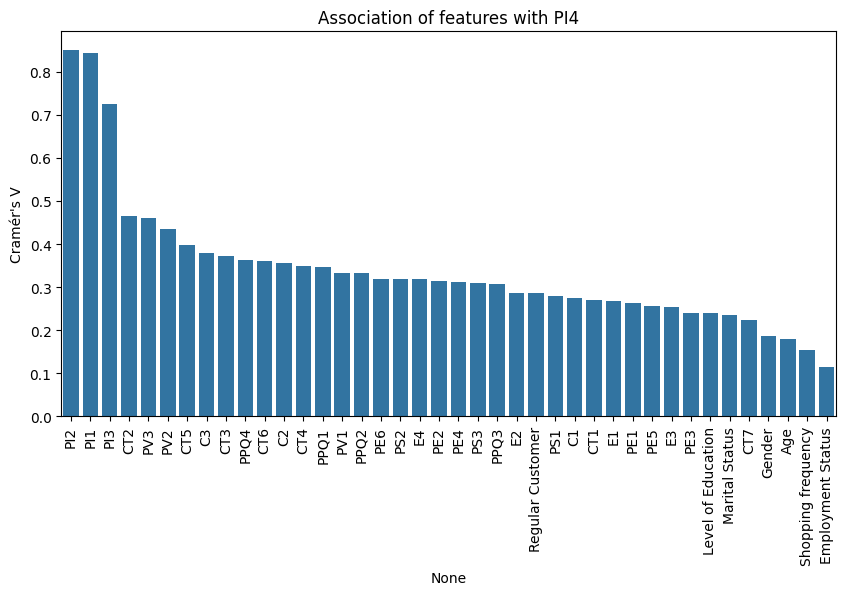

In [ ]:
#Visualize top associations with each PI
for pi in purchase_intention:
    cramer_values = {}
    for col in soweto_retail_data.columns:
        if col != pi:
            cramer_values[col] = cramers_v(soweto_retail_data[col], soweto_retail_data[pi])
    cramer_values = pd.Series(cramer_values).sort_values(ascending=False)

    plt.figure(figsize=(10,5))
    sns.barplot(x=cramer_values.index, y=cramer_values.values)
    plt.xticks(rotation=90)
    plt.ylabel("Cramér's V")
    plt.title(f'Association of features with {pi}')
    plt.show()

###**4. Imbalance Analysis (Purchase Intention Variables)**

The analysis of the four Purchase Intention (PI) variables reveals a severe and pervasive class imbalance, which is the central challenge that necessitates the synthetic data generation and balancing techniques in Part 2. As Likert scale data, the variables exhibit both high positive sentiment (high means, as noted in the descriptive statistics) and extreme skewness towards the majority classes.

---

**Purchase Intention Variable Imbalance**

- The minority class (score 1), representing the lowest purchase intent, is extremely underrepresented. PI1 displays the most extreme imbalance, with the highest intent score (score 4), making up almost half the data (48.40\%) while the lowest intent score (score 1) accounts for only 1.42\%, resulting in an alarming **34:1** imbalance ratio. PI2, PI3, and PI4 show similar patterns, with their respective minority classes hovering between 2.49\% and 3.91\%.

- This extreme lack of negative samples means the initial Bayesian Network built on the original data will be highly prone to prediction bias, maximising accuracy by simply classifying all new samples into the majority class (4 or 5).

- Consequently, the model will have negligible predictive power for the crucial low-intent segment of the market.

In [ ]:
#Identify Purchase Intention variables
pi_vars = [col for col in soweto_retail_data.columns if col.startswith('PI')]

In [ ]:
#Tabular Analysis and Imbalance Metrics
print("Purchase Intention Variables Analysis:")
for pi_var in pi_vars:
    print(f"\n{pi_var}:")
    value_counts = soweto_retail_data[pi_var].value_counts().sort_index()
    percentages = (value_counts / len(soweto_retail_data)) * 100

    #Prepare and display the summary table
    imbalance_df = pd.DataFrame({
        'Value': value_counts.index,
        'Count': value_counts.values,
        'Percentage': percentages.values
    }).round(2)
    display(imbalance_df)

    #Calculate imbalance metrics
    max_class = value_counts.max()
    min_class = value_counts.min()

    #Calculate Imbalance Ratio, handling division by zero
    imbalance_ratio = max_class / min_class if min_class > 0 else float('inf')

    print(f"Imbalance Ratio: {imbalance_ratio:.2f}")
    print(f"Majority class: {max_class/len(soweto_retail_data)*100:.2f}%")
    print(f"Minority class: {min_class/len(soweto_retail_data)*100:.2f}%")

Purchase Intention Variables Analysis:

PI1:


,Value,Count,Percentage
0,1,4,1.42
1,2,24,8.54
2,3,57,20.28
3,4,136,48.40
4,5,60,21.35


Imbalance Ratio: 34.00
Majority class: 48.40%
Minority class: 1.42%

PI2:


,Value,Count,Percentage
0,1,11,3.91
1,2,15,5.34
2,3,58,20.64
3,4,123,43.77
4,5,74,26.33


Imbalance Ratio: 11.18
Majority class: 43.77%
Minority class: 3.91%

PI3:


,Value,Count,Percentage
0,1,11,3.91
1,2,27,9.61
2,3,53,18.86
3,4,119,42.35
4,5,71,25.27


Imbalance Ratio: 10.82
Majority class: 42.35%
Minority class: 3.91%

PI4:


,Value,Count,Percentage
0,1,7,2.49
1,2,23,8.19
2,3,55,19.57
3,4,123,43.77
4,5,73,25.98


Imbalance Ratio: 17.57
Majority class: 43.77%
Minority class: 2.49%


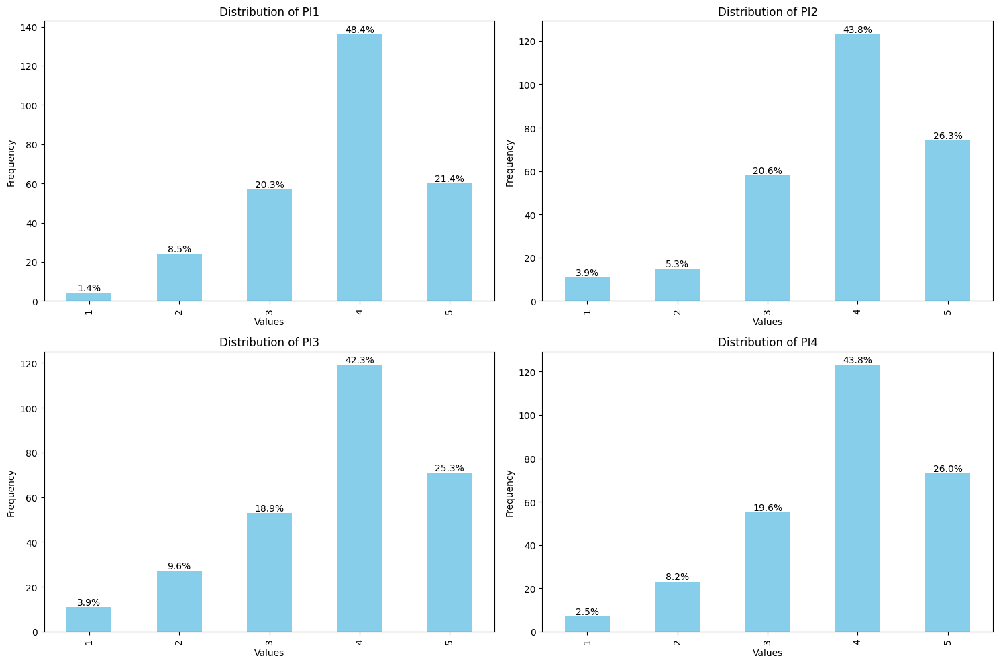

In [ ]:
#Visualisation of Purchase Intention Distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, pi_var in enumerate(pi_vars):
    if i < 4:  #Ensure we don't exceed subplot count
        soweto_retail_data[pi_var].value_counts().sort_index().plot(kind='bar', ax=axes[i], color='skyblue')
        axes[i].set_title(f'Distribution of {pi_var}')
        axes[i].set_xlabel('Values')
        axes[i].set_ylabel('Frequency')

        #Add percentage labels
        total = len(soweto_retail_data[pi_var])
        for p in axes[i].patches:
            height = p.get_height()
            axes[i].text(p.get_x() + p.get_width()/2., height + 0.1,
                        f'{height/total*100:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

###**Preprocessing and Feature Evaluation**

---

**Preprocessing and Feature Engineering Summary**

The data was preprocessed to transition from a noisy, high-dimensional dataset to a simplified, highly interpretable categorical structure suitable for Bayesian Network (BN) modeling.


**Feature Transformation and Reduction:**

1. **Composite Scoring:** Individual Likert-scale survey items were aggregated into seven composite mean scores representing core theoretical constructs (e.g., Empathy, Customer Trust, Perceived Value). This step successfully reduced multicollinearity (as noted in the EDA) and improved data stability.

2. **Categorisation:** These numeric composite scores were then converted into meaningful categorical variables (e.g., "Low," "Moderate," "High"), derived using logical scale ranges based on the descriptive statistics. This transformation is crucial for simplifying the BN's Conditional Probability Tables (CPTs) and significantly boosting model interpretability.

3. **Dimensionality Reduction:** The final processed dataset was reduced from 37 initial variables to 13 categorical columns (including the four Purchase Intention targets). This reduction addresses the initial EDA finding that 37 variables were too complex for a sample size of $N=281$.

4. **Feature Exclusion:** The variables Regular Customer and Shopping Frequency were explicitly removed. This was justified by their low correlation with other demographics and the target variable, thereby reducing noise and simplifying the resulting DAG structure.

**Outcome:**
The result is a clean dataset of 281 entries and 13 categorical features, ready for structure learning. The thorough data preparation, including hierarchical validation and feature engineering, ensures that the initial DAG construction is focused on the most relevant constructs, promoting an interpretable and justifiable baseline model.



####**Feature Grouping and Initial Assessment**
**Description:**
This step organizes the raw survey items into meaningful theoretical constructs (groups).A multi-criteria framework is then applied to score each predictor variable based on its
statistical potential (correlation with the target, variance, missing data) and domain relevance.



In [ ]:
#Grouping variables
variable_groups = {
    'Demographics': ['Gender', 'Age', 'Marital Status', 'Employment Status', 'Level of Education'],
    'Behavioural': ['Regular Customer', 'Shopping frequency'],
    'Convenience': ['C1', 'C2', 'C3'],
    'Empathy': ['E1', 'E2', 'E3', 'E4'],
    'Price Sensitivity': ['PS1', 'PS2', 'PS3'],
    'Physical Environment': ['PE1', 'PE2', 'PE3', 'PE4', 'PE5', 'PE6'],
    'Perceived Product Quality': ['PPQ1', 'PPQ2', 'PPQ3', 'PPQ4'],
    'Customer Trust': ['CT1', 'CT2', 'CT3', 'CT4', 'CT5', 'CT6', 'CT7'],
    'Perceived Value': ['PV1', 'PV2', 'PV3'],
    'Purchase Intention': ['PI1', 'PI2', 'PI3', 'PI4']  #Target variables
}

#Display group sizes
for group, variables in variable_groups.items():
    print(f"{group}: {len(variables)} variables")

#Create a mapping for easy reference
variable_to_group = {}
for group, variables in variable_groups.items():
    for var in variables:
        variable_to_group[var] = group

Demographics: 5 variables
Behavioural: 2 variables
Convenience: 3 variables
Empathy: 4 variables
Price Sensitivity: 3 variables
Physical Environment: 6 variables
Perceived Product Quality: 4 variables
Customer Trust: 7 variables
Perceived Value: 3 variables
Purchase Intention: 4 variables


####**Multi-Criteria Feature Significance Evaluation**

In [ ]:
def evaluate_feature_significance(df, target_vars):
    results = {}

    for feature in df.columns:
        if feature not in target_vars:
            feature_scores = {}

            #Criterion 1: Predictive Power (Correlation with ALL purchase intention variables)
            pi_correlations = []
            for pi_var in target_vars:
                corr = abs(df[feature].corr(df[pi_var]))
                pi_correlations.append(corr)
            feature_scores['avg_pi_correlation'] = np.mean(pi_correlations)
            feature_scores['max_pi_correlation'] = max(pi_correlations)

            #Criterion 2: Variability (Important for inference)
            feature_scores['variance'] = df[feature].var()
            feature_scores['unique_values'] = df[feature].nunique()

            #Criterion 3: Domain Group
            feature_scores['domain_group'] = variable_to_group.get(feature, 'UNKNOWN')

            results[feature] = feature_scores

    return pd.DataFrame(results).T

#Apply the evaluation framework
target_vars = ['PI1', 'PI2', 'PI3', 'PI4']
feature_scores_df = evaluate_feature_significance(soweto_retail_data, target_vars)

print("Feature Significance Scores (Top 10 by Average PI Correlation):")
display(feature_scores_df.sort_values('avg_pi_correlation', ascending=False).head(10).style.format({
    'avg_pi_correlation': '{:.3f}',
    'max_pi_correlation': '{:.3f}',
    'variance': '{:.2f}',
}).background_gradient(cmap='Greens', subset=['avg_pi_correlation']))

Feature Significance Scores (Top 10 by Average PI Correlation):


,avg_pi_correlation,max_pi_correlation,variance,unique_values,domain_group
PV3,0.602,0.642,1.25,5,Perceived Value
PPQ1,0.525,0.545,1.38,5,Perceived Product Quality
PV2,0.506,0.525,1.19,5,Perceived Value
PS3,0.494,0.522,1.64,5,Price Sensitivity
PV1,0.467,0.492,1.32,5,Perceived Value
PS1,0.440,0.456,1.77,5,Price Sensitivity
C2,0.438,0.462,1.26,5,Convenience
PPQ4,0.431,0.458,1.26,5,Perceived Product Quality
PPQ3,0.430,0.460,1.56,5,Perceived Product Quality
PE2,0.425,0.460,1.28,5,Physical Environment


#####imbalance

In [ ]:
#Advanced imbalance analysis with feature interaction
#Imbalance Metrics for each PI variable
pi_imbalance_metrics = {}

for pi_var in target_vars:
    value_counts = soweto_retail_data[pi_var].value_counts()
    n_classes = len(value_counts)

    metrics = {
        'n_classes': n_classes,
        'majority_pct': (value_counts.max() / len(soweto_retail_data)) * 100,
        'minority_pct': (value_counts.min() / len(soweto_retail_data)) * 100,
        'imbalance_ratio': value_counts.max() / value_counts.min(),
        'shannon_entropy': stats.entropy(value_counts),
        'gini_impurity': 1 - sum((value_counts / len(soweto_retail_data)) ** 2)
    }
    pi_imbalance_metrics[pi_var] = metrics

imbalance_df = pd.DataFrame(pi_imbalance_metrics).T
print("Purchase Intention Imbalance Metrics:")
display(imbalance_df)


Purchase Intention Imbalance Metrics:


,n_classes,majority_pct,minority_pct,imbalance_ratio,shannon_entropy,gini_impurity
PI1,5.0,48.398577,1.423488,34.000000,1.275173,0.671521
PI2,5.0,43.772242,3.914591,11.181818,1.321975,0.692063
PI3,5.0,42.348754,3.914591,10.818182,1.378013,0.710477
PI4,5.0,43.772242,2.491103,17.571429,1.327880,0.695280


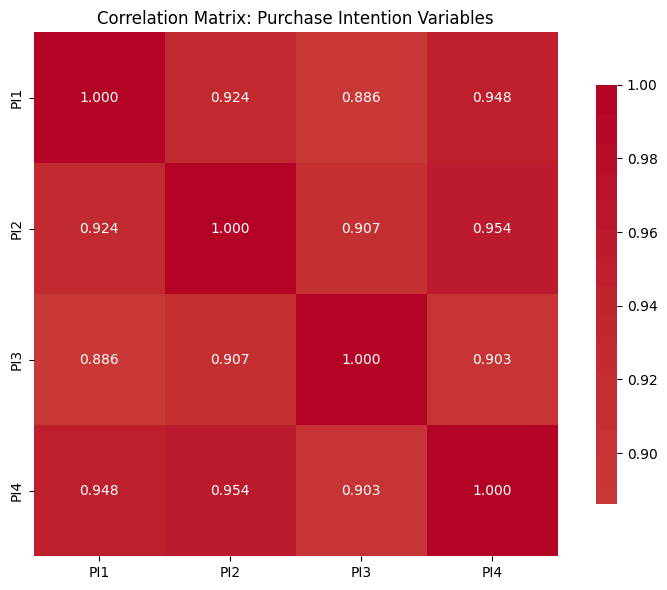

In [ ]:
#Cross-tabulation analysis to understand PI relationships
pi_correlation = soweto_retail_data[target_vars].corr()

#Heatmap of PI correlations
plt.figure(figsize=(8, 6))
sns.heatmap(pi_correlation, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.3f', cbar_kws={"shrink": .8})
plt.title('Correlation Matrix: Purchase Intention Variables')
plt.tight_layout()
plt.show()

In [ ]:
#Advanced Imbalance Analysis on the first 7 Columns
#Select the first 7 columns of the dataframe as target variables
target_vars = soweto_retail_data.columns[:7]
#Dictionary to store imbalance metrics
pi_imbalance_metrics = {}

#Calculate imbalance metrics for each of the 7 variables
for pi_var in target_vars:
    value_counts = soweto_retail_data[pi_var].value_counts()
    n_classes = len(value_counts)

    metrics = {
        'n_classes': n_classes,
        'majority_pct': (value_counts.max() / len(soweto_retail_data)) * 100,
        'minority_pct': (value_counts.min() / len(soweto_retail_data)) * 100,
        'imbalance_ratio': value_counts.max() / value_counts.min(),
        'shannon_entropy': stats.entropy(value_counts),
        'gini_impurity': 1 - sum((value_counts / len(soweto_retail_data)) ** 2)
    }
    pi_imbalance_metrics[pi_var] = metrics

#Convert to DataFrame
imbalance_df = pd.DataFrame(pi_imbalance_metrics).T
print("Imbalance Metrics for the First 7 Columns:")
display(imbalance_df.style.background_gradient(cmap="Blues", axis=None))

Imbalance Metrics for the First 7 Columns:


,n_classes,majority_pct,minority_pct,imbalance_ratio,shannon_entropy,gini_impurity
Gender,3.000000,47.686833,4.982206,9.571429,0.856597,0.546092
Age,5.000000,24.199288,16.725979,1.446809,1.598231,0.795481
Marital Status,3.000000,58.362989,13.523132,4.315789,0.941583,0.562050
Employment Status,2.000000,52.313167,47.686833,1.097015,0.692077,0.498930
Level of Education,5.000000,45.551601,1.067616,42.666667,1.306105,0.689480
Regular Customer,2.000000,82.562278,17.437722,4.734694,0.462759,0.287940
Shopping frequency,5.000000,39.857651,7.829181,5.090909,1.435100,0.728410


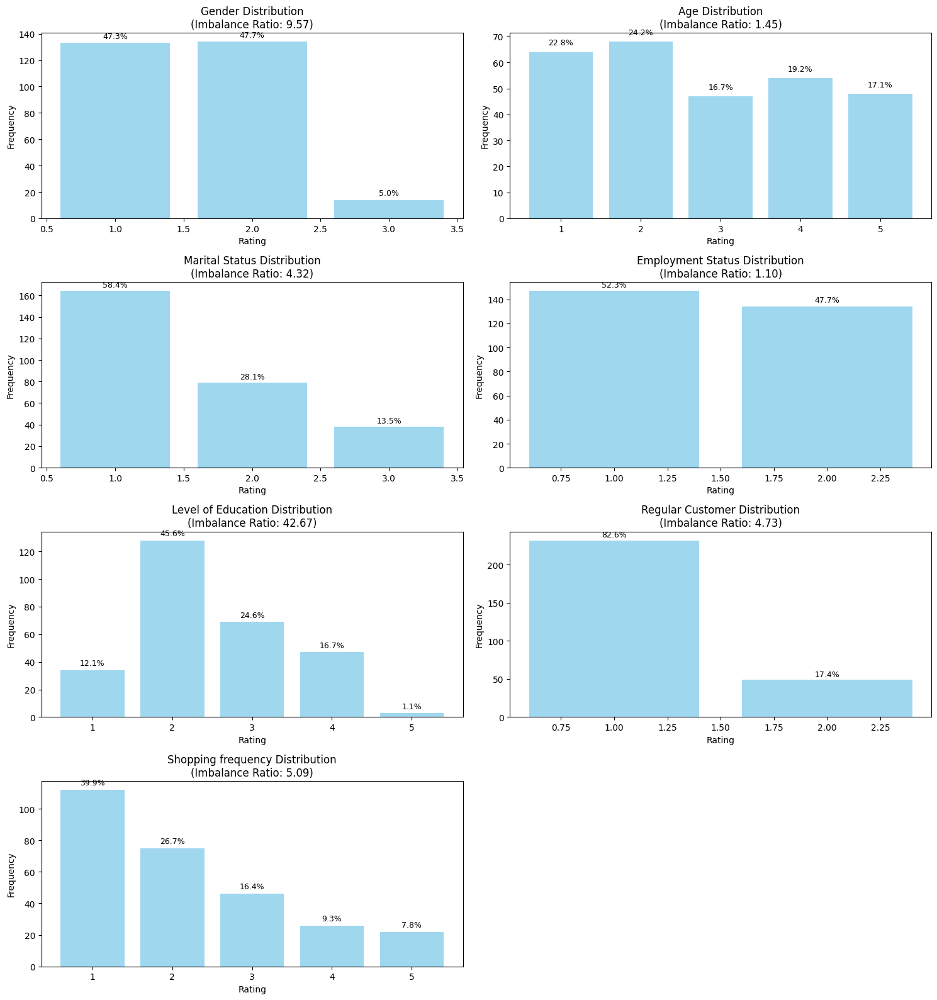

In [ ]:
#Visualise imbalance patterns across the first 7 columns
n_vars = len(target_vars)
n_rows = int(np.ceil(n_vars / 2))
fig, axes = plt.subplots(n_rows, 2, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for idx, pi_var in enumerate(target_vars):
    value_dist = soweto_retail_data[pi_var].value_counts().sort_index()
    axes[idx].bar(value_dist.index, value_dist.values, color='skyblue', alpha=0.8)
    axes[idx].set_title(f'{pi_var} Distribution\n(Imbalance Ratio: {imbalance_df.loc[pi_var, "imbalance_ratio"]:.2f})')
    axes[idx].set_xlabel('Rating')
    axes[idx].set_ylabel('Frequency')

    #Add percentage labels
    for i, v in enumerate(value_dist.values):
        axes[idx].text(value_dist.index[i], v + 2, f'{v/len(soweto_retail_data)*100:.1f}%',
                       ha='center', va='bottom', fontsize=9)

#Hide any unused subplots
for ax in axes[n_vars:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
#Correlation between the first 7 columns
print("\nCorrelation between the first 7 variables:")
pi_correlation = soweto_retail_data[target_vars].corr()
display(pi_correlation.style.background_gradient(cmap="coolwarm", axis=None))



Correlation between the first 7 variables:


,Gender,Age,Marital Status,Employment Status,Level of Education,Regular Customer,Shopping frequency
Gender,1.000000,0.010809,0.131922,0.021233,0.112179,0.187967,0.139133
Age,0.010809,1.000000,0.448737,-0.196730,-0.011753,-0.172218,-0.098324
Marital Status,0.131922,0.448737,1.000000,-0.137778,0.015088,0.051765,-0.088610
Employment Status,0.021233,-0.196730,-0.137778,1.000000,-0.436477,0.011895,0.074306
Level of Education,0.112179,-0.011753,0.015088,-0.436477,1.000000,0.019241,0.025209
Regular Customer,0.187967,-0.172218,0.051765,0.011895,0.019241,1.000000,-0.052360
Shopping frequency,0.139133,-0.098324,-0.088610,0.074306,0.025209,-0.052360,1.000000


In [ ]:
#Function to compute Cramér's V
def cramers_v(x, y):
    cm = pd.crosstab(x, y)
    chi2 = chi2_contingency(cm)[0]
    n = cm.sum().sum()
    phi2 = chi2/n
    r,k = cm.shape
    return np.sqrt(phi2 / min(k-1, r-1))

#Compute pairwise associations among all variables
assoc_matrix = pd.DataFrame(index=soweto_retail_data.columns, columns=soweto_retail_data.columns)
for col1 in soweto_retail_data.columns:
    for col2 in soweto_retail_data.columns:
        assoc_matrix.loc[col1, col2] = cramers_v(soweto_retail_data[col1], soweto_retail_data[col2])
assoc_matrix = assoc_matrix.astype(float)

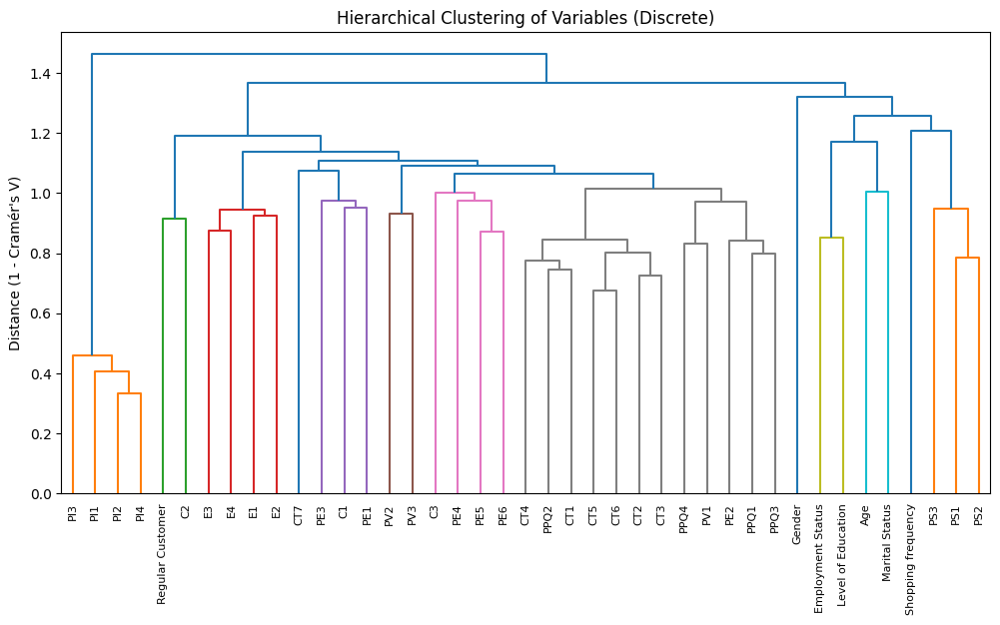

In [ ]:
#Compute "distance" matrix: distance = 1 - Cramér's V
dist_matrix = 1 - assoc_matrix.values
np.fill_diagonal(dist_matrix, 0)  # distance to self = 0

#Hierarchical clustering
linked = linkage(dist_matrix, method='average')
plt.figure(figsize=(12, 6))
dendrogram(linked, labels=assoc_matrix.columns, leaf_rotation=90)
plt.title("Hierarchical Clustering of Variables (Discrete)")
plt.ylabel("Distance (1 - Cramér's V)")
plt.show()

####**Feature Engineering: Creating Composite Scores**

**Description:** The original survey dataset consists of multiple Likert-scale items per construct
(e.g., 4 items for Empathy, 3 items for Convenience). In this section, we aggregate each construct using a mean composite score, and then convert the numeric mean into three meaningful categories due to the following:

1. To address and reduce multicollinearity,
2. To simplify the Bayesian Network, and increase the interpretability of the results,
3. and to create more digestable, stable categorial variables.

This step creates the final, reduced dataset ready for modeling.



**Demographics**

In [ ]:
#Feature reduction using composite scoring
soweto_retail_data_copy= soweto_retail_data.copy()


In [ ]:
#Rename the demographic variables with (_categorical) as a suffix
soweto_retail_data_copy.rename(columns={'Gender': 'Gender_categorical'}, inplace=True)
soweto_retail_data_copy.rename(columns={'Marital Status': 'Marital_Status_categorical'}, inplace=True)
soweto_retail_data_copy.rename(columns={'Age': 'Age_categorical'}, inplace=True)
soweto_retail_data_copy.rename(columns={'Level of Education': 'Level_of_Education_categorical'}, inplace=True)
soweto_retail_data_copy.rename(columns={'Employment Status': 'Employment_Status_categorical'}, inplace=True)

In [ ]:
#Convert Gender into labels
print("Gender was converted into labelled categories: \n1. Male \n2. Female \n3. I prefer not to say")
gender_map = {2: 'Female', 1: 'Male', 3: 'I prefer not to say'}
soweto_retail_data_copy['Gender'] = soweto_retail_data_copy['Gender_categorical'].map(gender_map)

Gender was converted into labelled categories: 
1. Male 
2. Female 
3. I prefer not to say


In [ ]:
#Convert Marital Status into labels
print("Marital Status was converted into labelled categories: \n1. Single \n2. Married \n3. I prefer not to say")
marital_map = {2: 'Married', 1: 'Single', 3: 'I prefer not to say'}
soweto_retail_data_copy['Marital_Status'] = soweto_retail_data_copy['Marital_Status_categorical'].map(marital_map)

Marital Status was converted into labelled categories: 
1. Single 
2. Married 
3. I prefer not to say


In [ ]:
#Convert Age groups into labels
print("Age was converted into labelled categories: \n1. 18–22 \n2. 23–28 \n3. 29–35 \n4. 35–49 \n5. 50–65")
age_map = {1: '18-22', 2: '23-28', 3: '29-35', 4: '35-49', 5: '50-65'}
soweto_retail_data_copy['Age'] = soweto_retail_data_copy['Age_categorical'].map(age_map)

Age was converted into labelled categories: 
1. 18–22 
2. 23–28 
3. 29–35 
4. 35–49 
5. 50–65


In [ ]:
#Convert Level of Education groups into labels
print("Level of Education was converted into labelled categories: \n1. No formal education \n2. Basic education \n3. Diploma \n4. Degree \n5. Postgraduate degree")
education_map = {1: 'No formal education', 2: 'Basic education', 3: 'Diploma', 4: 'Degree', 5: 'Postgraduate degree'}
soweto_retail_data_copy['Level_of_Education'] = soweto_retail_data_copy['Level_of_Education_categorical'].map(education_map)


Level of Education was converted into labelled categories: 
1. No formal education 
2. Basic education 
3. Diploma 
4. Degree 
5. Postgraduate degree


In [ ]:
#Convert Employment Status groups into labels
print("Employment Status was converted into labelled categories: \n1. Employed \n2. Unemployed")
employment_map = {1: 'Employed', 2: 'Unemployed'}
soweto_retail_data_copy['Employment_Status'] = soweto_retail_data_copy['Employment_Status_categorical'].map(employment_map)

Employment Status was converted into labelled categories: 
1. Employed 
2. Unemployed


**Constructs**

In [ ]:
#Define the target variables
target_variables = ['PI1', 'PI2', 'PI3', 'PI4']

In [ ]:
#Create and compute continuous means for each construct
soweto_retail_data_copy['Empathy_raw'] = soweto_retail_data_copy[['E1', 'E2', 'E3', 'E4']].mean(axis=1)
soweto_retail_data_copy['Convenience_raw'] = soweto_retail_data_copy[['C1', 'C2', 'C3']].mean(axis=1)
soweto_retail_data_copy['Price_Sensitivity_raw'] = soweto_retail_data_copy[['PS1', 'PS2', 'PS3']].mean(axis=1)
soweto_retail_data_copy['Physical_Environment_raw'] = soweto_retail_data_copy[['PE1', 'PE2', 'PE3', 'PE4', 'PE5', 'PE6']].mean(axis=1)
soweto_retail_data_copy['Perceived_Product_Quality_raw'] = soweto_retail_data_copy[['PPQ1', 'PPQ2', 'PPQ3', 'PPQ4']].mean(axis=1)
soweto_retail_data_copy['Customer_Trust_raw'] = soweto_retail_data_copy[['CT1', 'CT2', 'CT3', 'CT4', 'CT5', 'CT6', 'CT7']].mean(axis=1)
soweto_retail_data_copy['Perceived_Value_raw'] = soweto_retail_data_copy[['PV1', 'PV2', 'PV3']].mean(axis=1)

In [ ]:
soweto_retail_data_copy.head()

,Gender_categorical,Age_categorical,Marital_Status_categorical,Employment_Status_categorical,Level_of_Education_categorical,Regular Customer,Shopping frequency,E1,E2,E3,...,Age,Level_of_Education,Employment_Status,Empathy_raw,Convenience_raw,Price_Sensitivity_raw,Physical_Environment_raw,Perceived_Product_Quality_raw,Customer_Trust_raw,Perceived_Value_raw
0,3,4,1,1,4,2,3,3,2,4,...,35-49,Degree,Employed,3.25,2.666667,2.333333,3.000000,3.50,3.142857,3.333333
1,3,5,3,1,4,1,1,3,3,3,...,50-65,Degree,Employed,3.00,4.000000,3.000000,3.166667,2.50,2.857143,2.333333
2,2,4,2,2,2,2,2,3,4,2,...,35-49,Basic education,Unemployed,3.00,3.333333,3.000000,2.833333,3.25,2.714286,2.000000
3,1,3,1,1,3,2,1,3,2,4,...,29-35,Diploma,Employed,3.00,2.666667,4.000000,3.166667,3.00,2.857143,2.000000
4,3,2,1,2,2,2,3,2,4,3,...,23-28,Basic education,Unemployed,2.75,3.333333,2.333333,2.833333,3.00,2.857143,2.666667


In [ ]:
soweto_retail_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 53 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender_categorical              281 non-null    int64  
 1   Age_categorical                 281 non-null    int64  
 2   Marital_Status_categorical      281 non-null    int64  
 3   Employment_Status_categorical   281 non-null    int64  
 4   Level_of_Education_categorical  281 non-null    int64  
 5   Regular Customer                281 non-null    int64  
 6   Shopping frequency              281 non-null    int64  
 7   E1                              281 non-null    int64  
 8   E2                              281 non-null    int64  
 9   E3                              281 non-null    int64  
 10  E4                              281 non-null    int64  
 11  C1                              281 non-null    int64  
 12  C2                              281 

In [ ]:
#Convert Empathy into  3 categories (Low, Moderate and High)
print("Empathy was converted into 3 catergories: \nLow Empathy (0.999 - 2.33) \nModerate Empathy (2.34 - 3.66) \nHigh Empathy (3.67 - 5.0)")
soweto_retail_data_copy['Empathy_categorical'] = pd.cut(soweto_retail_data_copy['Empathy_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Empathy'] = pd.cut(soweto_retail_data_copy['Empathy_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Low Empathy','Moderate Empathy','High Empathy'])

Empathy was converted into 3 catergories: 
Low Empathy (0.999 - 2.33) 
Moderate Empathy (2.34 - 3.66) 
High Empathy (3.67 - 5.0)


In [ ]:
#Convert Convenience into 3 categories (Low, Moderate and High)
print("Convenience was converted into 3 catergories: \nLow Convenience (0.999 - 2.33) \nModerate Convenience (2.34 - 3.66) \nHigh Convenience (3.67 - 5.001)")
soweto_retail_data_copy['Convenience_categorical'] = pd.cut(soweto_retail_data_copy['Convenience_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Convenience'] = pd.cut(soweto_retail_data_copy['Convenience_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Low Convenience','Moderate Convenience','High Convenience'])

Convenience was converted into 3 catergories: 
Low Convenience (0.999 - 2.33) 
Moderate Convenience (2.34 - 3.66) 
High Convenience (3.67 - 5.001)


In [ ]:
#Convert Price Sensitivity into 3 categories (Low, Moderate and High)
print("Price Sensitivity was converted into 3 catergories: \nLow Price Sensitivity (0.999 - 2.33) \nModerate Price Sensitivity (2.34 - 3.66) \nHigh Price Sensitivity (3.67 - 5.0)")
soweto_retail_data_copy['Price_Sensitivity_categorical'] = pd.cut(soweto_retail_data_copy['Price_Sensitivity_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Price_Sensitivity'] = pd.cut(soweto_retail_data_copy['Price_Sensitivity_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Low Price Sensitivity','Moderate Price Sensitivity','High Price Sensitivity'])

Price Sensitivity was converted into 3 catergories: 
Low Price Sensitivity (0.999 - 2.33) 
Moderate Price Sensitivity (2.34 - 3.66) 
High Price Sensitivity (3.67 - 5.0)


In [ ]:
#Convert Physical Environment into 3 categories (Low, Moderate and High)
print("Physical Environment was converted into 3 catergories: \nPoor Environment (0.999 - 2.33) \nAverage Environment (2.34 - 3.66) \nGood Environment (3.67 - 5.001)")
soweto_retail_data_copy['Physical_Environment_categorical'] = pd.cut(soweto_retail_data_copy['Physical_Environment_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Physical_Environment'] = pd.cut(soweto_retail_data_copy['Physical_Environment_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Poor Environment','Average Environment','Good Environment'])

Physical Environment was converted into 3 catergories: 
Poor Environment (0.999 - 2.33) 
Average Environment (2.34 - 3.66) 
Good Environment (3.67 - 5.001)


In [ ]:
#Convert Perceived Product Quality into 3 categories (Low, Moderate and High)
print("Perceived Product Quality was converted into 3 catergories: \nLow Quality (0.999 - 2.33) \nModerate Quality (2.34 - 3.66) \nHigh Quality (3.67 - 5.001)")
soweto_retail_data_copy['Perceived_Product_Quality_categorical'] = pd.cut(soweto_retail_data_copy['Perceived_Product_Quality_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Perceived_Product_Quality'] = pd.cut(soweto_retail_data_copy['Perceived_Product_Quality_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Low Quality','Moderate Quality','High Quality'])

Perceived Product Quality was converted into 3 catergories: 
Low Quality (0.999 - 2.33) 
Moderate Quality (2.34 - 3.66) 
High Quality (3.67 - 5.001)


In [ ]:
#Convert Customer Trust into 4 categories (Very Low, Low, Moderate, High)
print("Customer Trust was converted into 3 catergories: \nVery Low Trust(0.999 - 1.75) \nLow Trust(1.75 - 2.5) \nModerate Trust (2.5 - 3.5) \nHigh Trust (3.5 - 5.001)")
soweto_retail_data_copy['Customer_Trust_categorical'] = pd.cut(soweto_retail_data_copy['Customer_Trust_raw'], bins=[0.999, 1.75, 2.5, 3.5, 5.001], labels=[1,2,3,4], include_lowest=True)
soweto_retail_data_copy['Customer_Trust'] = pd.cut(soweto_retail_data_copy['Customer_Trust_raw'], bins=[0.999, 1.75, 2.5, 3.5, 5.001], labels=['Very Low Trust','Low Trust','Moderate Trust','High Trust'])

Customer Trust was converted into 3 catergories: 
Very Low Trust(0.999 - 1.75) 
Low Trust(1.75 - 2.5) 
Moderate Trust (2.5 - 3.5) 
High Trust (3.5 - 5.001)


In [ ]:
#Convert Perceived Value into 3 categories (Low, Moderate and High)
print("Perceived Value was converted into 3 catergories: \nLow Value (0.999 - 2.33) \nModerate Value (2.34 - 3.66) \nHigh Value (3.67 - 5.001)")
soweto_retail_data_copy['Perceived_Value_categorical'] = pd.cut(soweto_retail_data_copy['Perceived_Value_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=[1,2,3], include_lowest=True)
soweto_retail_data_copy['Perceived_Value'] = pd.cut(soweto_retail_data_copy['Perceived_Value_raw'], bins=[0.999, 2.33, 3.66, 5.001], labels=['Low Value','Moderate Value','High Value'])

Perceived Value was converted into 3 catergories: 
Low Value (0.999 - 2.33) 
Moderate Value (2.34 - 3.66) 
High Value (3.67 - 5.001)


In [ ]:
soweto_retail_data_copy.head()

,Gender_categorical,Age_categorical,Marital_Status_categorical,Employment_Status_categorical,Level_of_Education_categorical,Regular Customer,Shopping frequency,E1,E2,E3,...,Price_Sensitivity_categorical,Price_Sensitivity,Physical_Environment_categorical,Physical_Environment,Perceived_Product_Quality_categorical,Perceived_Product_Quality,Customer_Trust_categorical,Customer_Trust,Perceived_Value_categorical,Perceived_Value
0,3,4,1,1,4,2,3,3,2,4,...,2,Moderate Price Sensitivity,2,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value
1,3,5,3,1,4,1,1,3,3,3,...,2,Moderate Price Sensitivity,2,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value
2,2,4,2,2,2,2,2,3,4,2,...,2,Moderate Price Sensitivity,2,Average Environment,2,Moderate Quality,3,Moderate Trust,1,Low Value
3,1,3,1,1,3,2,1,3,2,4,...,3,High Price Sensitivity,2,Average Environment,2,Moderate Quality,3,Moderate Trust,1,Low Value
4,3,2,1,2,2,2,3,2,4,3,...,2,Moderate Price Sensitivity,2,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value


####**Feature Engineering: Creating Composite Scores (Binary Target)**

In [ ]:
soweto_retail_data_copy['PI_mean'] = soweto_retail_data_copy[target_variables].mean(axis=1)
#Convert Purchase Intention into 2 categories (Low and High)- binary
print("Purchase Intention was converted into 2 catergories (binary): \n1 = High Intention (Purchase) \n0 = Low Intention (No Purchase)")
#Apply the binary threshold (e.g., greater than 3.0)
soweto_retail_data_copy['Purchase_Intention_categorical'] = np.where(soweto_retail_data_copy['PI_mean']>3, 1, 0)
soweto_retail_data_copy['Purchase_Intention'] = np.where(soweto_retail_data_copy['PI_mean']>3, 'High Intention','Low Intention')


Purchase Intention was converted into 2 catergories (binary): 
1 = High Intention (Purchase) 
0 = Low Intention (No Purchase)


In [ ]:
soweto_retail_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 70 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Gender_categorical                     281 non-null    int64   
 1   Age_categorical                        281 non-null    int64   
 2   Marital_Status_categorical             281 non-null    int64   
 3   Employment_Status_categorical          281 non-null    int64   
 4   Level_of_Education_categorical         281 non-null    int64   
 5   Regular Customer                       281 non-null    int64   
 6   Shopping frequency                     281 non-null    int64   
 7   E1                                     281 non-null    int64   
 8   E2                                     281 non-null    int64   
 9   E3                                     281 non-null    int64   
 10  E4                                     281 non-null    int64  

In [ ]:
#Drop unneeded raw survey columns
drop_cols = [col for col in soweto_retail_data_copy.columns if any(prefix in col for prefix in [
   'Shopping frequency','Regular Customer'])]
df_reduced = soweto_retail_data_copy.drop(columns=drop_cols)

In [ ]:
#Convert categories to categorical dtype
cat_cols = [col for col in soweto_retail_data_copy.columns if '_categorical' in col or '_label' in col]
soweto_retail_data_copy[cat_cols] = soweto_retail_data_copy[cat_cols].astype('category')

In [ ]:
soweto_retail_data_copy.head()

,Gender_categorical,Age_categorical,Marital_Status_categorical,Employment_Status_categorical,Level_of_Education_categorical,Regular Customer,Shopping frequency,E1,E2,E3,...,Physical_Environment,Perceived_Product_Quality_categorical,Perceived_Product_Quality,Customer_Trust_categorical,Customer_Trust,Perceived_Value_categorical,Perceived_Value,PI_mean,Purchase_Intention_categorical,Purchase_Intention
0,3,4,1,1,4,2,3,3,2,4,...,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value,3.75,1,High Intention
1,3,5,3,1,4,1,1,3,3,3,...,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value,4.00,1,High Intention
2,2,4,2,2,2,2,2,3,4,2,...,Average Environment,2,Moderate Quality,3,Moderate Trust,1,Low Value,3.25,1,High Intention
3,1,3,1,1,3,2,1,3,2,4,...,Average Environment,2,Moderate Quality,3,Moderate Trust,1,Low Value,3.50,1,High Intention
4,3,2,1,2,2,2,3,2,4,3,...,Average Environment,2,Moderate Quality,3,Moderate Trust,2,Moderate Value,2.50,0,Low Intention


In [ ]:
soweto_retail_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 70 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Gender_categorical                     281 non-null    category
 1   Age_categorical                        281 non-null    category
 2   Marital_Status_categorical             281 non-null    category
 3   Employment_Status_categorical          281 non-null    category
 4   Level_of_Education_categorical         281 non-null    category
 5   Regular Customer                       281 non-null    int64   
 6   Shopping frequency                     281 non-null    int64   
 7   E1                                     281 non-null    int64   
 8   E2                                     281 non-null    int64   
 9   E3                                     281 non-null    int64   
 10  E4                                     281 non-null    int64  

In [ ]:
final_vars = [
    'Gender', 'Age', 'Marital_Status', 'Employment_Status', 'Level_of_Education','Empathy',
    'Convenience', 'Price_Sensitivity', 'Physical_Environment',
    'Perceived_Product_Quality', 'Customer_Trust', 'Perceived_Value',
    'Purchase_Intention'
]

soweto_retail_data_final = df_reduced[final_vars]
print("Final composite dataset ready. Shape:", soweto_retail_data_final.shape)
display(soweto_retail_data_final.head())

Final composite dataset ready. Shape: (281, 13)


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


In [ ]:
soweto_retail_data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     281 non-null    object  
 1   Age                        281 non-null    object  
 2   Marital_Status             281 non-null    object  
 3   Employment_Status          281 non-null    object  
 4   Level_of_Education         281 non-null    object  
 5   Empathy                    281 non-null    category
 6   Convenience                281 non-null    category
 7   Price_Sensitivity          281 non-null    category
 8   Physical_Environment       281 non-null    category
 9   Perceived_Product_Quality  281 non-null    category
 10  Customer_Trust             281 non-null    category
 11  Perceived_Value            281 non-null    category
 12  Purchase_Intention         281 non-null    object  
dtypes: category(7), object(6)
memory us

In [ ]:
#Ensure all columns are categorical for Bayesian Network
soweto_retail_data_final['Gender'] = soweto_retail_data_final['Gender'].astype('category')
soweto_retail_data_final['Marital_Status'] = soweto_retail_data_final['Marital_Status'].astype('category')
soweto_retail_data_final['Age'] = soweto_retail_data_final['Age'].astype('category')
soweto_retail_data_final['Level_of_Education'] = soweto_retail_data_final['Level_of_Education'].astype('category')
soweto_retail_data_final['Employment_Status'] = soweto_retail_data_final['Employment_Status'].astype('category')

In [ ]:
soweto_retail_data_final['Purchase_Intention'] = soweto_retail_data_final['Purchase_Intention'].astype('category')

In [ ]:
soweto_retail_data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     281 non-null    category
 1   Age                        281 non-null    category
 2   Marital_Status             281 non-null    category
 3   Employment_Status          281 non-null    category
 4   Level_of_Education         281 non-null    category
 5   Empathy                    281 non-null    category
 6   Convenience                281 non-null    category
 7   Price_Sensitivity          281 non-null    category
 8   Physical_Environment       281 non-null    category
 9   Perceived_Product_Quality  281 non-null    category
 10  Customer_Trust             281 non-null    category
 11  Perceived_Value            281 non-null    category
 12  Purchase_Intention         281 non-null    category
dtypes: category(13)
memory usage: 5.6 K

In [ ]:
final_vars_balancing = [
    'Gender_categorical', 'Age_categorical', 'Marital_Status_categorical', 'Employment_Status_categorical', 'Level_of_Education_categorical','Empathy_categorical',
    'Convenience_categorical', 'Price_Sensitivity_categorical', 'Physical_Environment_categorical',
    'Perceived_Product_Quality_categorical', 'Customer_Trust_categorical', 'Perceived_Value_categorical',
    'Purchase_Intention_categorical'
]

soweto_retail_data_balancing = df_reduced[final_vars_balancing]
print("Final composite dataset ready. Shape:", soweto_retail_data_balancing.shape)
display(soweto_retail_data_balancing.head())

Final composite dataset ready. Shape: (281, 13)


,Gender_categorical,Age_categorical,Marital_Status_categorical,Employment_Status_categorical,Level_of_Education_categorical,Empathy_categorical,Convenience_categorical,Price_Sensitivity_categorical,Physical_Environment_categorical,Perceived_Product_Quality_categorical,Customer_Trust_categorical,Perceived_Value_categorical,Purchase_Intention_categorical
0,3,4,1,1,4,2,2,2,2,2,3,2,1
1,3,5,3,1,4,2,3,2,2,2,3,2,1
2,2,4,2,2,2,2,2,2,2,2,3,1,1
3,1,3,1,1,3,2,2,3,2,2,3,1,1
4,3,2,1,2,2,2,2,2,2,2,3,2,0


####**Final Feature Validation and Association Analysis**

**Description:** A final check to validate the structure of the new dataset and verify that the engineered constructs are sufficiently distinct using Hierarchical Clustering based on Cramér's V (for association strength).

In [ ]:
#Comprehensive data structure validation
print("Data Structure Validation Summary")
validation_report = {
    'Original Dataset Dimensions': soweto_retail_data.shape,
    'Engineered Dataset Dimensions': soweto_retail_data_final.shape,
    'Variables Removed': f"{soweto_retail_data.shape[1] - soweto_retail_data_final.shape[1]} ({(soweto_retail_data.shape[1] - soweto_retail_data_final.shape[1])/soweto_retail_data.shape[1]*100:.1f}%)",
    'Final Feature Count': soweto_retail_data_final.shape[1],
    'Target Variable': 'Purchase_Intention (Composite Score)',
    'Predictor Variables': soweto_retail_data_final.shape[1] - 1
}

for key, value in validation_report.items():
    print(f"  {key}: {value}")



Data Structure Validation Summary
  Original Dataset Dimensions: (281, 41)
  Engineered Dataset Dimensions: (281, 13)
  Variables Removed: 28 (68.3%)
  Final Feature Count: 13
  Target Variable: Purchase_Intention (Composite Score)
  Predictor Variables: 12


####**Feature Association (Hierarchical Clustering)**

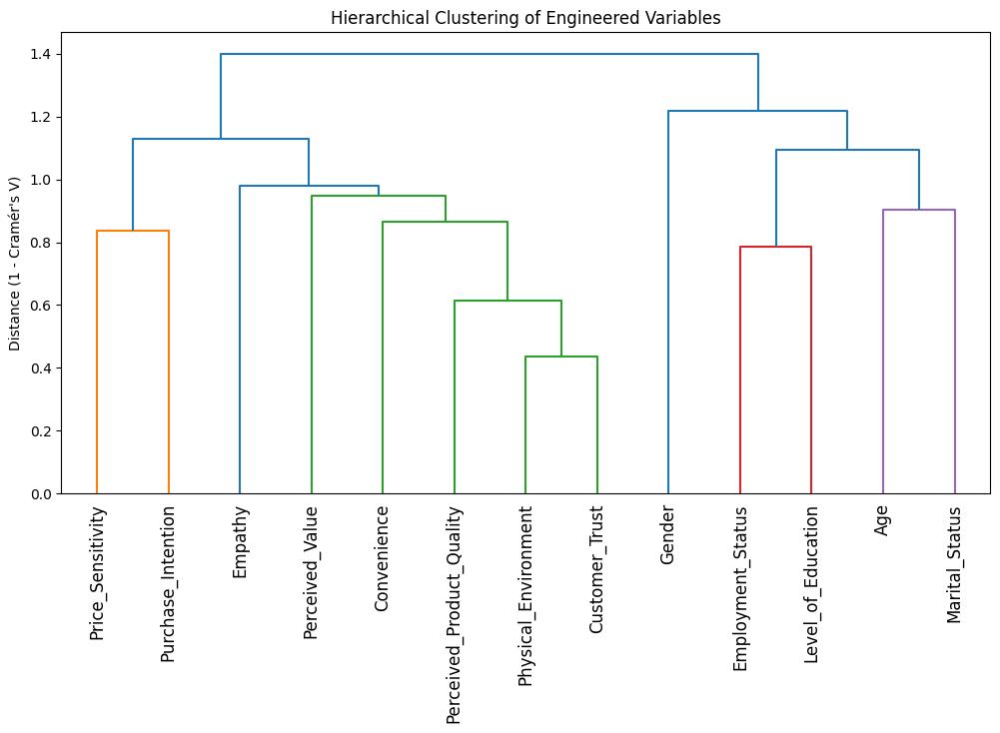

In [ ]:
#Function to compute Cramér's V (Required for distance matrix)
def cramers_v(x, y):
    cm = pd.crosstab(x, y)
    chi2 = chi2_contingency(cm)[0]
    n = cm.sum().sum()
    phi2 = chi2 / n
    r, k = cm.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

#Compute pairwise associations among all final engineered variables
assoc_matrix_final = pd.DataFrame(index=soweto_retail_data_final.columns, columns=soweto_retail_data_final.columns)
for col1 in soweto_retail_data_final.columns:
    for col2 in soweto_retail_data_final.columns:
        assoc_matrix_final.loc[col1, col2] = cramers_v(soweto_retail_data_final[col1], soweto_retail_data_final[col2])
assoc_matrix_final = assoc_matrix_final.astype(float)

#Compute "distance" matrix: distance = 1 - Cramér's V
dist_matrix = 1 - assoc_matrix_final.values
np.fill_diagonal(dist_matrix, 0)

#Hierarchical clustering
linked = linkage(dist_matrix, method='average')
plt.figure(figsize=(12, 6))
dendrogram(linked, labels=assoc_matrix_final.columns, leaf_rotation=90)
plt.title("Hierarchical Clustering of Engineered Variables")
plt.ylabel("Distance (1 - Cramér's V)")
plt.show()

####**Post-Engineering Imbalance and Association Analysis**

In [ ]:
target_var_new = 'Purchase_Intention'

print(f"Imbalance Metrics for Composite Target: {target_var_new}")

value_counts = soweto_retail_data_final[target_var_new].value_counts()
total_count = len(soweto_retail_data_final)
n_classes = len(value_counts)

# Calculate metrics
metrics = {
    'n_classes': n_classes,
    'majority_pct': (value_counts.max() / total_count) * 100,
    'minority_pct': (value_counts.min() / total_count) * 100,
    'imbalance_ratio': value_counts.max() / value_counts.min() if value_counts.min() > 0 else float('inf'),
    'shannon_entropy': stats.entropy(value_counts),
    'gini_impurity': 1 - sum((value_counts / total_count) ** 2)
}

imbalance_df_new = pd.DataFrame([metrics], index=[target_var_new]).T
display(imbalance_df_new.style.format('{:.3f}'))


Imbalance Metrics for Composite Target: Purchase_Intention


,Purchase_Intention
n_classes,2.000
majority_pct,74.021
minority_pct,25.979
imbalance_ratio,2.849
shannon_entropy,0.573
gini_impurity,0.385


Visualisation of Binary Target Distribution (Purchase_Intention)


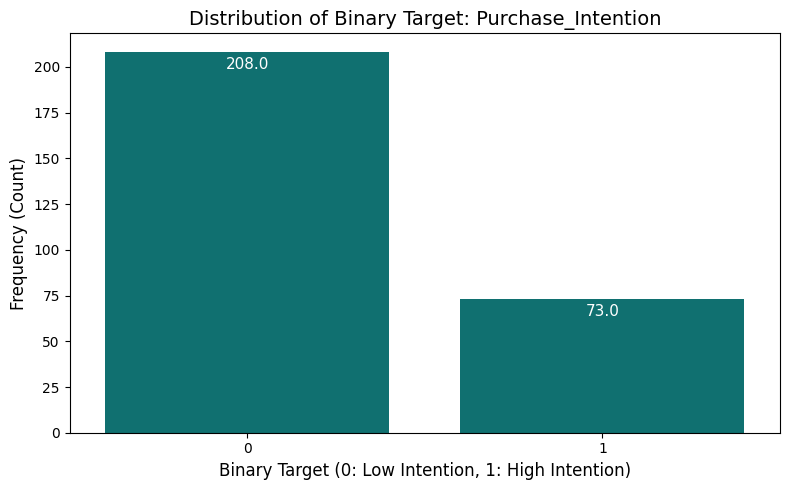

In [ ]:
# Visualise new target distribution
target_col = 'Purchase_Intention'

print(f"Visualisation of Binary Target Distribution ({target_col})")

plt.figure(figsize=(8, 5))
ax = sns.countplot(
    x=soweto_retail_data_final[target_col],
    color='teal',
    order=soweto_retail_data_final[target_col].value_counts().index # Ensure correct order
)

plt.title(f'Distribution of Binary Target: {target_col}', fontsize=14)
plt.xlabel('Binary Target (0: Low Intention, 1: High Intention)', fontsize=12)
plt.ylabel('Frequency (Count)', fontsize=12)
plt.xticks([0, 1], ['0', '1'], rotation=0) # Explicitly label the binary classes

# Add count labels on the bars
total = len(soweto_retail_data_final)
for p in ax.patches:
    # Get count (frequency)
    count = p.get_height()

    # Place the count label
    ax.annotate(
        f'{count}',
        (p.get_x() + p.get_width() / 2., count - (total * 0.01)), # Position: center of bar, slightly inside
        ha='center', va='top', fontsize=11, color='white' # Use white for contrast
    )

plt.tight_layout()
plt.show()

--- Visualisation of Binary Target Distribution (Purchase_Intention) ---


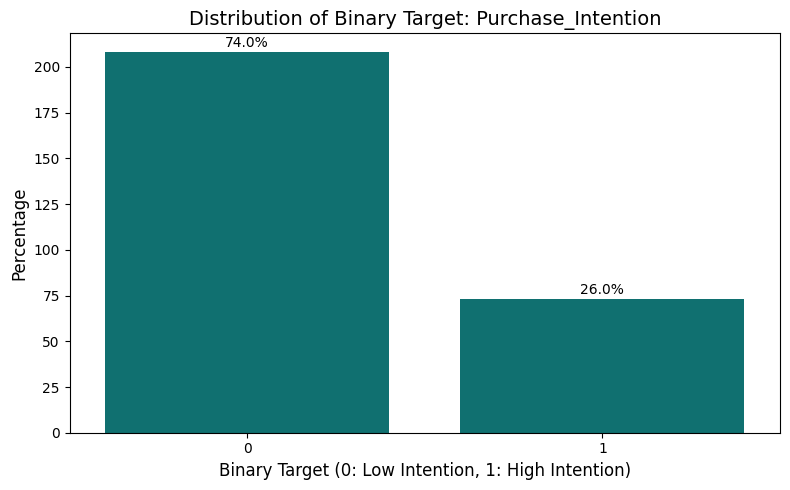

In [ ]:
# Visualise new target distribution
target_col = 'Purchase_Intention'

print(f"--- Visualisation of Binary Target Distribution ({target_col}) ---")

plt.figure(figsize=(8, 5))
ax = sns.countplot(
    x=soweto_retail_data_final[target_col],
    color='teal',
    order=soweto_retail_data_final[target_col].value_counts().index # Ensure correct order
)

plt.title(f'Distribution of Binary Target: {target_col}', fontsize=14)
plt.xlabel('Binary Target (0: Low Intention, 1: High Intention)', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.xticks([0, 1], ['0', '1'], rotation=0) # Explicitly label the binary classes

# Add percentage labels on the bars
total = len(soweto_retail_data_final)
for p in ax.patches:
    # Get count (frequency)
    height = p.get_height()
    if height > 0:
      percentage = (height / total) * 100
      ax.text(p.get_x() + p.get_width() / 2., height + (total * 0.005), # Adjusted text position
              f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()


Association (Cramér's V) between Engineered Predictors and Composite Target


,Purchase_Intention
Perceived_Value,0.448
Price_Sensitivity,0.443
Convenience,0.380
Perceived_Product_Quality,0.372
Physical_Environment,0.277
Customer_Trust,0.225
Level_of_Education,0.200
Empathy,0.176
Age,0.116
Gender,0.078


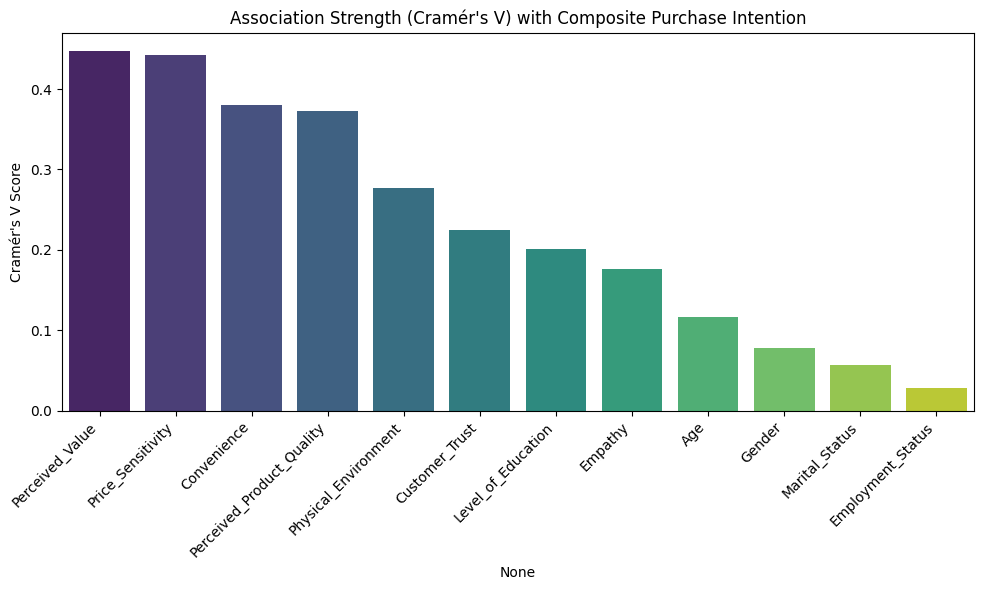

In [ ]:
#Association Check with New Variables
# Function to compute Cramér's V (using final engineered data)
def cramers_v(x, y):
    cm = pd.crosstab(x, y)
    chi2 = chi2_contingency(cm)[0]
    n = cm.sum().sum()
    phi2 = chi2 / n
    r, k = cm.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

predictor_vars = soweto_retail_data_final.columns.drop(target_var_new)
correlation_results = pd.DataFrame(index=predictor_vars, columns=[target_var_new])

#Compute association (Cramér's V) between each engineered predictor and the new target
for var in predictor_vars:
    # Since these are typically ordinal/discrete, V is a robust measure
    corr_value = cramers_v(soweto_retail_data_final[var], soweto_retail_data_final[target_var_new])
    correlation_results.loc[var, target_var_new] = corr_value

correlation_results = correlation_results.astype(float).sort_values(by=target_var_new, ascending=False)

print("\nAssociation (Cramér's V) between Engineered Predictors and Composite Target")
display(correlation_results.style.format('{:.3f}').background_gradient(cmap="Purples"))

# Visualise as heatmap (Single column heatmap is often just a bar plot)
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_results.index, y=correlation_results[target_var_new].values, palette='viridis')
plt.title("Association Strength (Cramér's V) with Composite Purchase Intention")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Variable")
plt.ylabel("Cramér's V Score")
plt.tight_layout()
plt.show()

##**Phase 2: Initial Bayesian Network (Imbalanced Data)**



This phase focuses on constructing a Bayesian Network using the original, imbalanced dataset. The network will allow us to capture probabilistic dependencies among variables and evaluate purchase intention prediction accuracy under real-world class imbalance.

This phase involves:

1. Model Construction: Use manual structure learning to define the Bayesian DAG.
2. Training & Inference: Train the Bayesian Network on the imbalanced dataset and perform inference for purchase intention.
3. Model Storage: Save the trained model as a .pkl file for reuse.
4. Visualisation: Generate DAG visualisations and explain reasoning paths.

In [ ]:
#Build and define the manual DAG structure
dag_edges = [

    #Demographic Variables → Experience Constructs
    ('Gender', 'Empathy'),
    ('Age', 'Empathy'),
    ('Marital_Status', 'Empathy'),
    ('Employment_Status', 'Empathy'),
    ('Level_of_Education', 'Empathy'),

    ('Gender', 'Convenience'),
    ('Age', 'Convenience'),
    ('Marital_Status', 'Convenience'),
    ('Employment_Status', 'Convenience'),
    ('Level_of_Education', 'Convenience'),

    ('Gender', 'Physical_Environment'),
    ('Age', 'Physical_Environment'),
    ('Marital_Status', 'Physical_Environment'),
    ('Employment_Status', 'Physical_Environment'),
    ('Level_of_Education', 'Physical_Environment'),

    ('Gender', 'Perceived_Product_Quality'),
    ('Age', 'Perceived_Product_Quality'),
    ('Marital_Status', 'Perceived_Product_Quality'),
    ('Employment_Status', 'Perceived_Product_Quality'),
    ('Level_of_Education', 'Perceived_Product_Quality'),

    #Experience Constructs → Customer Trust
    ('Empathy', 'Customer_Trust'),
    ('Convenience', 'Customer_Trust'),
    ('Physical_Environment', 'Customer_Trust'),
    ('Perceived_Product_Quality', 'Customer_Trust'),

    # CONSTRUCTS → PERCEIVED VALUE
    ('Convenience', 'Perceived_Value'),
    ('Perceived_Product_Quality', 'Perceived_Value'),
    ('Price_Sensitivity', 'Perceived_Value'),

    # Trust–Value Interaction
    ('Customer_Trust', 'Perceived_Value'),
    # FINAL TARGET (PI)
    ('Customer_Trust', 'Purchase_Intention'),
    ('Perceived_Value', 'Purchase_Intention'),
]


In [ ]:
# Create DAG
model_dag = bn.make_DAG(dag_edges)

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

Initial Bayesian Network (Imbalanced Data)
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


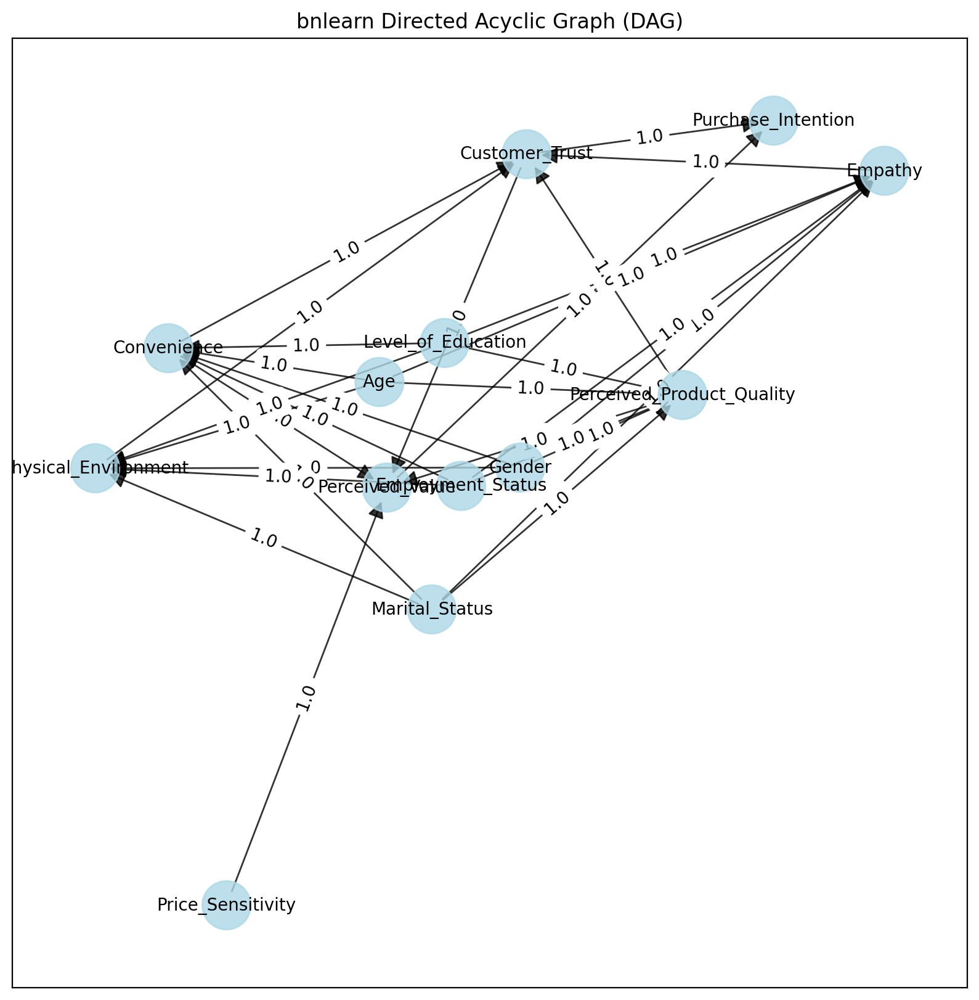

{'fig': <Figure size 2000x2000 with 1 Axes>,
 'ax': <Figure size 2000x2000 with 1 Axes>,
 'pos': {'Gender': array([ 0.12284213, -0.11511103]),
  'Empathy': array([0.86548539, 0.48479984]),
  'Convenience': array([-0.59510054,  0.12609899]),
  'Physical_Environment': array([-0.74424784, -0.11657424]),
  'Perceived_Product_Quality': array([0.45383654, 0.03150612]),
  'Customer_Trust': array([0.13536984, 0.51828328]),
  'Age': array([-0.16446018,  0.0578587 ]),
  'Marital_Status': array([-0.05760906, -0.40194894]),
  'Employment_Status': array([ 0.00201058, -0.1522183 ]),
  'Level_of_Education': array([-0.0315699 ,  0.13675966]),
  'Perceived_Value': array([-0.14939601, -0.15564637]),
  'Purchase_Intention': array([0.6392477 , 0.58619229]),
  'Price_Sensitivity': array([-0.47640865, -1.        ])},
 'G': <networkx.classes.digraph.DiGraph at 0x79768f292540>,
 'node_properties': {'Gender': {'node_color': '#ADD8E6', 'node_size': 800},
  'Empathy': {'node_color': '#ADD8E6', 'node_size': 800},

In [ ]:
#Plot the DAG
print("Initial Bayesian Network (Imbalanced Data)")
bn.plot(model_dag, node_color='lightblue')

In [ ]:
bn_model = bn.parameter_learning.fit(model_dag, soweto_retail_data_final)

[bnlearn] >Parameter learning> Computing parameters using [bayes]


[bnlearn] >CPD of Empathy:
+---------------------------+-----+
| Age                       | ... |
+---------------------------+-----+
| Employment_Status         | ... |
+---------------------------+-----+
| Gender                    | ... |
+---------------------------+-----+
| Level_of_Education        | ... |
+---------------------------+-----+
| Marital_Status            | ... |
+---------------------------+-----+
| Empathy(High Empathy)     | ... |
+---------------------------+-----+
| Empathy(Low Empathy)      | ... |
+---------------------------+-----+
| Empathy(Moderate Empathy) | ... |
+---------------------------+-----+
[bnlearn] >CPD of Convenience:
+-----------------------------------+-----+
| Age                               | ... |
+-----------------------------------+-----+
| Employment_Status                 | ... |
+-----------------------------------+-----+
| Gender                            | ... |
+-----------------------------------+-----+
| Level_of_Education  

In [ ]:
#Save the Trained Bayesian Network
with open("BN_Imbalanced_Manual_Model.pkl", "wb") as f:
    pickle.dump(bn_model, f)

print("\nBayesian Network saved as BN_Imbalanced_Manual_Model.pkl")


Bayesian Network saved as BN_Imbalanced_Manual_Model.pkl


[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

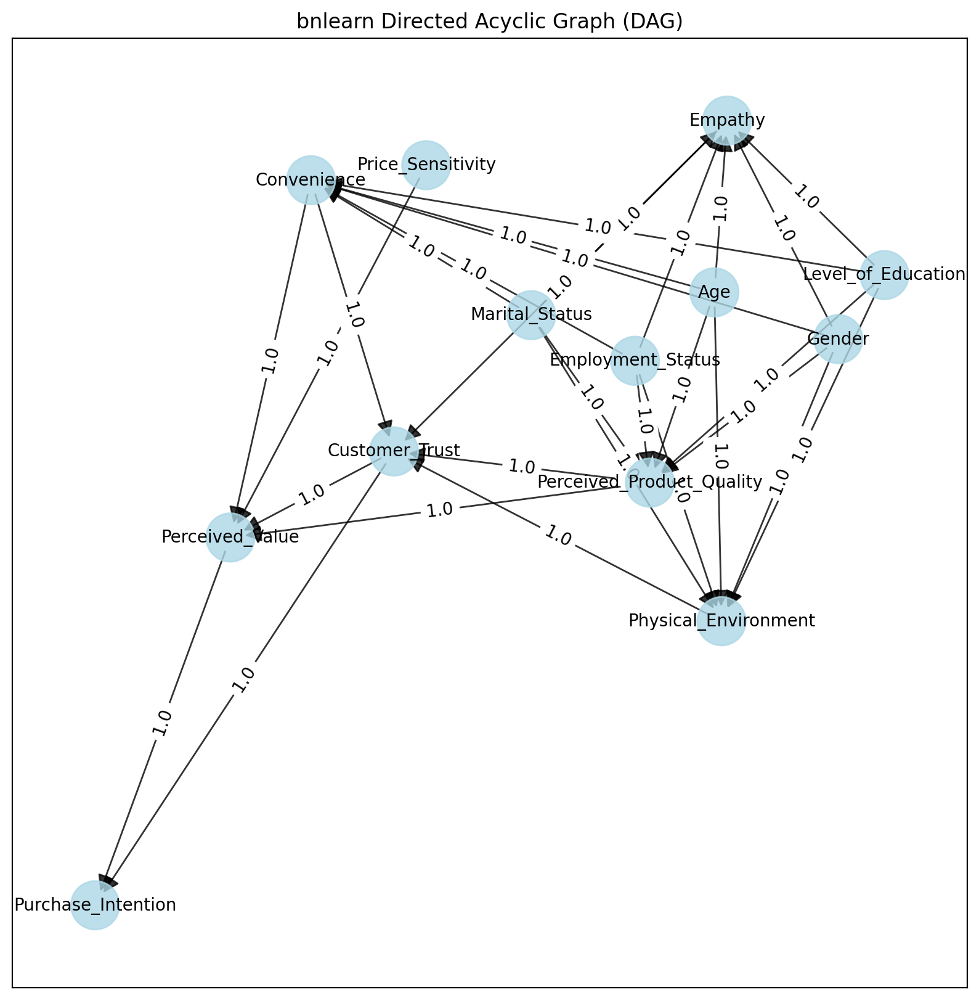

In [ ]:
#Visualise the manual DAG
plt.figure(figsize=(14,10))
bn.plot(bn_model, node_color='lightblue')
plt.show()




####**Initial DAG Structure Justification (BN-Original)**

The initial Directed Acyclic Graph (DAG) for the Bayesian Network was constructed based on a hierarchical causal framework derived from established consumer behavior models and refined by the insights gained from the Comprehensive EDA. This ensures the model is not only statistically informed but also highly interpretable and theoretically defensible.

---

**Causal Layers and Arc Justification**

The model is organised into three distinct layers, with arcs flowing from exogenous factors down to the final outcome:

1. **Root Causes (Demographics) → Experience Constructs:**

**Edges:** (Gender, Age, Marital Status, Employment Status, Level of Education) → (Empathy, Convenience, Physical Environment, Perceived Product Quality)

**Justification:** Demographic factors are the exogenous root nodes. They define a customer's baseline expectations and personal context. These fixed attributes influence how an individual perceives the variable elements of the retail environment (e.g., an older customer may value convenience differently than a younger one). These nodes act as necessary parents to establish fundamental differences in perception.

2. **Experience Constructs → Cognitive Mediators (Trust and Value):**

**Edges:** (Empathy, Convenience, Physical Environment, Product Quality) → Customer Trust

**Justification:** This structure aligns with the Service Quality (Servqual) framework. A consumer's Trust in a retailer is an outcome of consistently positive functional and relational experiences. Empathy (service) and Product Quality are the primary inputs used to build that trust.

3. **Cognitive Mediators & Final Outcome:**

- **Edges (Value & Sensitivity):**(Convenience, Product Quality, Customer Trust) → Perceived Value

- **Edges (Value → Sensitivity):** Perceived_Value → Price_Sensitivity

- **Edges (Final Outcome):** (Customer Trust, Perceived Value, Price Sensitivity) → Purchase Intention

**Justification:** This pathway drives the final behavioral prediction. Perceived Value is logically influenced by the core benefits received (Convenience and Product Quality) and is also heavily dependent on Customer Trust (as trust implies fairness, increasing value perception). Crucially, the arc from Perceived Value → Price Sensitivity is included because high perceived value logically makes the consumer less sensitive to price changes. Finally, Trust, Value, and Sensitivity are all required as direct parents of Purchase Intention, as they are the strongest, most direct psychological predictors of consumer action, a finding reinforced by the high correlations observed in the EDA.

##**Phase 3: Synthetic Data Generation**

The imbalanced nature of purchase intention requires balancing. This phase focuses on applying **three methods** of balancing and synthetic data generation.

1. **SMOTE (Synthetic Minority Oversampling Technique)**:
Oversample minority classes by generating synthetic samples. Evaluate before/after distributions.
2. **ML-based Imputation (e.g., KNN or Random Forest)**: Use machine learning models to impute and balance the dataset. This creates more realistic interpolations compared to random oversampling.
3. **GAN for Tabular Data:**
Train a CTGAN (Conditional Tabular GAN) model to generate new synthetic records. Validate generated data quality and assess balance.

**SMOTE**


In [ ]:
#Use pre-encoded numeric categorical dataset
data_bal = soweto_retail_data_balancing.copy()

In [ ]:
#Features and target
X = data_bal.drop(columns=['Purchase_Intention_categorical'])
y = data_bal['Purchase_Intention_categorical']

In [ ]:
#SMOTE: Oversample minority class
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

smote_data = pd.DataFrame(X_smote, columns=X.columns)
smote_data['Purchase_Intention_categorical'] = y_smote

print("Original dataset class counts: \n", soweto_retail_data_balancing['Purchase_Intention_categorical'].value_counts(),"\nSMOTE-balanced dataset class counts:\n", smote_data['Purchase_Intention_categorical'].value_counts())


Original dataset class counts: 
 Purchase_Intention_categorical
1    208
0     73
Name: count, dtype: int64 
SMOTE-balanced dataset class counts:
 Purchase_Intention_categorical
1    208
0    208
Name: count, dtype: int64


**Proof that it is balanced**

In [ ]:
smote_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   Gender_categorical                     416 non-null    int64   
 1   Age_categorical                        416 non-null    int64   
 2   Marital_Status_categorical             416 non-null    int64   
 3   Employment_Status_categorical          416 non-null    int64   
 4   Level_of_Education_categorical         416 non-null    int64   
 5   Empathy_categorical                    416 non-null    category
 6   Convenience_categorical                416 non-null    category
 7   Price_Sensitivity_categorical          416 non-null    category
 8   Physical_Environment_categorical       416 non-null    category
 9   Perceived_Product_Quality_categorical  416 non-null    category
 10  Customer_Trust_categorical             416 non-null    categor

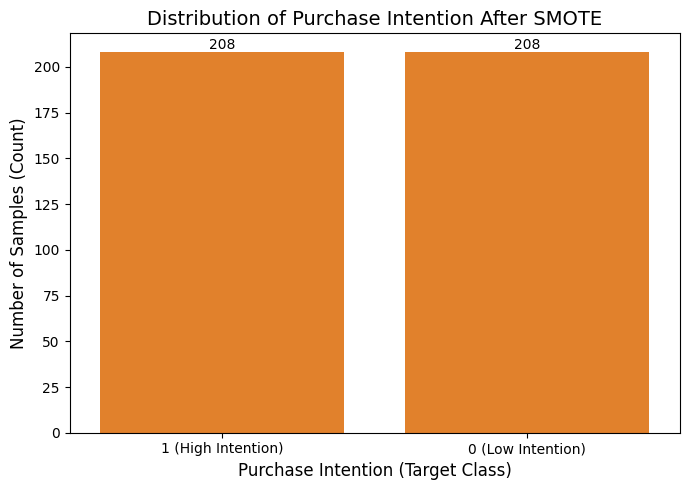

In [ ]:
#Define the target column name
target_col = 'Purchase_Intention_categorical'

#Calculate the counts for the balanced data
smote_counts = smote_data[target_col].value_counts().reset_index()
smote_counts.columns = [target_col, 'Count']

#Map the integer codes to descriptive labels for the plot
plot_data = smote_counts.copy()
#Map 0 to '0 (Low Intention)' and 1 to '1 (High Intention)'
plot_data[target_col] = plot_data[target_col].map({0: '0 (Low Intention)', 1: '1 (High Intention)'})

#Plotting
plt.figure(figsize=(7, 5))
ax = sns.barplot(
    x=target_col,
    y='Count',
    data=plot_data,
    palette=['#ff7f0e', '#ff7f0e'] # Use the same color for balance emphasis
)

plt.title('Distribution of Purchase Intention After SMOTE', fontsize=14)
plt.xlabel('Purchase Intention (Target Class)', fontsize=12)
plt.ylabel('Number of Samples (Count)', fontsize=12)
plt.xticks(rotation=0)

#Add count labels on the bars
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10
    )

plt.tight_layout()
plt.show()

**ML Imputation**

In [ ]:
#ML-based Imputation (Random Forest)
df_machine_learning = soweto_retail_data_balancing.copy()

# Identify the target column
target_col = 'Purchase_Intention_categorical'

# Count classes
class_counts = df_machine_learning[target_col].value_counts()
print("Original class distribution:\n", class_counts)
# Find minority class and majority class
minority_class = class_counts.idxmin()
majority_class = class_counts.idxmax()
n_to_generate = class_counts[majority_class] - class_counts[minority_class]

print(f"Minority class: {minority_class}, need to generate {n_to_generate} samples")

Original class distribution:
 Purchase_Intention_categorical
1    208
0     73
Name: count, dtype: int64
Minority class: 0, need to generate 135 samples


In [ ]:
# Step 1: Extract minority samples
minority_samples = df_machine_learning[df_machine_learning[target_col] == minority_class].copy()

# Step 2: Create empty synthetic samples (duplicate minority)
synthetic_samples = minority_samples.sample(n=n_to_generate, replace=True).reset_index(drop=True)

# Step 3: Mask all feature values except target for ML imputation
features = df_machine_learning.columns.drop(target_col)
synthetic_samples[features] = np.nan  # blank features to be predicted

# Step 4: Combine original data with synthetic rows for imputer
combined = pd.concat([df_machine_learning, synthetic_samples], ignore_index=True)

# Step 5: Impute missing feature values using IterativeImputer with Random Forest
imputer = IterativeImputer(estimator=RandomForestRegressor(n_estimators=50, random_state=42),
                           max_iter=10, random_state=42)
combined_imputed = combined.copy()
combined_imputed[features] = imputer.fit_transform(combined[features])

# Step 6: Separate synthetic rows and merge back to original
ml_balanced_df = combined_imputed

# Check new class distribution
print("Balanced class distribution:\n", ml_balanced_df[target_col].value_counts())

Balanced class distribution:
 Purchase_Intention_categorical
1    208
0    208
Name: count, dtype: int64


**proof it is balanced**

In [ ]:
ml_balanced_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Gender_categorical                     416 non-null    float64
 1   Age_categorical                        416 non-null    float64
 2   Marital_Status_categorical             416 non-null    float64
 3   Employment_Status_categorical          416 non-null    float64
 4   Level_of_Education_categorical         416 non-null    float64
 5   Empathy_categorical                    416 non-null    float64
 6   Convenience_categorical                416 non-null    float64
 7   Price_Sensitivity_categorical          416 non-null    float64
 8   Physical_Environment_categorical       416 non-null    float64
 9   Perceived_Product_Quality_categorical  416 non-null    float64
 10  Customer_Trust_categorical             416 non-null    float64
 11  Percei

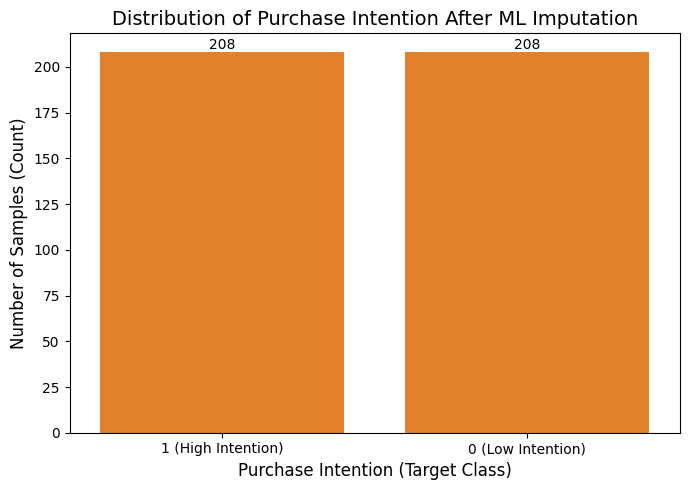

In [ ]:
#Define the target column name
target_col = 'Purchase_Intention_categorical'

#Calculate the counts for the balanced data
machine_learning_counts = ml_balanced_df[target_col].value_counts().reset_index()
machine_learning_counts.columns = [target_col, 'Count']

#Map the integer codes to descriptive labels for the plot
plot_data = machine_learning_counts.copy()
#Map 0 to '0 (Low Intention)' and 1 to '1 (High Intention)'
plot_data[target_col] = plot_data[target_col].map({0: '0 (Low Intention)', 1: '1 (High Intention)'})

#Plotting
plt.figure(figsize=(7, 5))
ax = sns.barplot(
    x=target_col,
    y='Count',
    data=plot_data,
    palette=['#ff7f0e', '#ff7f0e'] # Use the same color for balance emphasis
)

plt.title('Distribution of Purchase Intention After ML Imputation', fontsize=14)
plt.xlabel('Purchase Intention (Target Class)', fontsize=12)
plt.ylabel('Number of Samples (Count)', fontsize=12)
plt.xticks(rotation=0)

#Add count labels on the bars
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10
    )

plt.tight_layout()
plt.show()

**GAN-based Synthetic Data Generation (CTGAN)**

In [ ]:
#GAN-based Synthetic Data Generation (CTGAN)
data_bal_ctgan = soweto_retail_data_balancing.copy()

In [ ]:
#Convert all categorical columns to integer codes
for col in data_bal_ctgan.columns:
    if pd.api.types.is_categorical_dtype(data_bal_ctgan[col]):
        data_bal_ctgan[col] = data_bal_ctgan[col].cat.codes


In [ ]:
#Fit the CTGAN (More epochs = better synthetic quality)
ctgan = CTGAN(epochs=300, batch_size=50)
ctgan.fit(data_bal_ctgan)

In [ ]:
# Generate synthetic data with same number of rows as SMOTE
#Check imbalance first
counts = data_bal_ctgan['Purchase_Intention_categorical'].value_counts()
minority_class = counts.idxmin()
majority_class = counts.idxmax()

target_n = 500  # or 1000, or same as SMOTE (416), your choice

synthetic_all = ctgan.sample(target_n * 2)

# Filter synthetic samples by class
syn_0 = synthetic_all[synthetic_all["Purchase_Intention_categorical"] == 0].sample(target_n, replace=True)
syn_1 = synthetic_all[synthetic_all["Purchase_Intention_categorical"] == 1].sample(target_n, replace=True)

balanced_gan = pd.concat([syn_0, syn_1], ignore_index=True)

print(balanced_gan['Purchase_Intention_categorical'].value_counts())

Purchase_Intention_categorical
0    500
1    500
Name: count, dtype: int64


**proof it is balanced**

In [ ]:
balanced_gan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype
---  ------                                 --------------  -----
 0   Gender_categorical                     1000 non-null   int64
 1   Age_categorical                        1000 non-null   int64
 2   Marital_Status_categorical             1000 non-null   int64
 3   Employment_Status_categorical          1000 non-null   int64
 4   Level_of_Education_categorical         1000 non-null   int64
 5   Empathy_categorical                    1000 non-null   int8 
 6   Convenience_categorical                1000 non-null   int8 
 7   Price_Sensitivity_categorical          1000 non-null   int8 
 8   Physical_Environment_categorical       1000 non-null   int8 
 9   Perceived_Product_Quality_categorical  1000 non-null   int8 
 10  Customer_Trust_categorical             1000 non-null   int8 
 11  Perceived_Value_categorical    

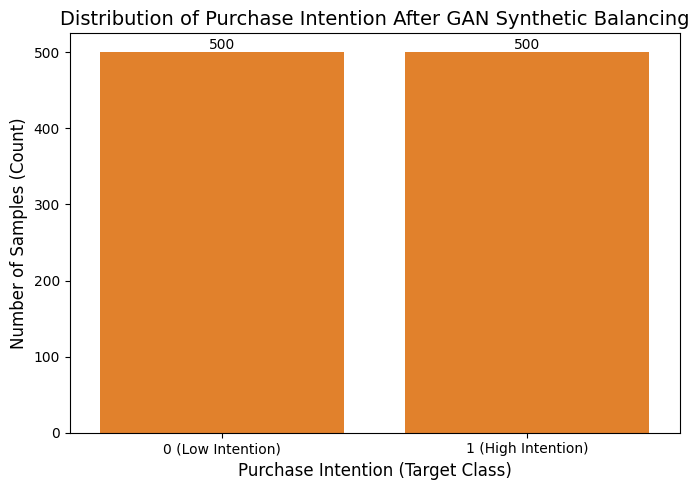

In [ ]:
#Define the target column name
target_col = 'Purchase_Intention_categorical'

#Calculate the counts for the balanced data
GAN_counts = balanced_gan[target_col].value_counts().reset_index()
GAN_counts.columns = [target_col, 'Count']

#Map the integer codes to descriptive labels for the plot
plot_data = GAN_counts.copy()
#Map 0 to '0 (Low Intention)' and 1 to '1 (High Intention)'
plot_data[target_col] = plot_data[target_col].map({0: '0 (Low Intention)', 1: '1 (High Intention)'})

#Plotting
plt.figure(figsize=(7, 5))
ax = sns.barplot(
    x=target_col,
    y='Count',
    data=plot_data,
    palette=['#ff7f0e', '#ff7f0e'] # Use the same color for balance emphasis
)

plt.title('Distribution of Purchase Intention After GAN Synthetic Balancing', fontsize=14)
plt.xlabel('Purchase Intention (Target Class)', fontsize=12)
plt.ylabel('Number of Samples (Count)', fontsize=12)
plt.xticks(rotation=0)

#Add count labels on the bars
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=10
    )

plt.tight_layout()
plt.show()

##**Phase 4: Balanced Bayesian Networks**

In this phase, we construct new Bayesian Networks using the balanced datasets obtained from Phase 3. Each balancing method results in a different dataset, allowing us to compare performance across methods.

Steps include:

1. Model Construction: Learn the DAG structure for each balanced dataset.
2. Training & Inference: Train Bayesian Networks and perform purchase intention predictions.
3. Model Storage: Save each trained model (.pkl).
4. Comparative Structures: Compare DAGs from SMOTE, ML-Imputation, and GAN-balanced data.

In [ ]:
print("ML dataset:", ml_balanced_df.shape)
print("SMOTE dataset:", smote_data.shape)
print("GAN dataset:", balanced_gan.shape)
print("Raw dataset:", soweto_retail_data_final.shape)

ML dataset: (416, 13)
SMOTE dataset: (416, 13)
GAN dataset: (1000, 13)
Raw dataset: (281, 13)


In [ ]:
#redefine category dictionaries for Bayesian Networks
category_maps = {
    'Gender_categorical': {1: 'Male', 2: 'Female', 3: 'I prefer not to say'},
    'Marital_Status_categorical': {1: 'Single', 2: 'Married', 3: 'I prefer not to say'},
    'Age_categorical': {1: '18-22', 2: '23-28', 3: '29-35', 4: '35-49', 5: '50-65'},
    'Level_of_Education_categorical': {1: 'No formal education', 2: 'Basic education', 3: 'Diploma', 4: 'Degree', 5: 'Postgraduate degree'},
    'Employment_Status_categorical': {1: 'Employed', 2: 'Unemployed'},
    'Empathy_categorical': {1: 'Low Empathy', 2: 'Moderate Empathy', 3: 'High Empathy'},
    'Convenience_categorical': {1: 'Low Convenience', 2: 'Moderate Convenience', 3: 'High Convenience'},
    'Price_Sensitivity_categorical': {1: 'Low Price Sensitivity', 2: 'Moderate Price Sensitivity', 3: 'High Price Sensitivity'},
    'Physical_Environment_categorical': {1: 'Poor Environment', 2: 'Moderate Environment', 3: 'Good Environment'},
    'Perceived_Product_Quality_categorical': {1: 'Low Quality', 2: 'Moderate Quality', 3: 'High Quality'},
    'Customer_Trust_categorical': {1: 'Very Low Trust', 2: 'Low Trust', 3: 'Moderate Trust', 4: 'High Trust'},
    'Perceived_Value_categorical': {1: 'Low Value', 2: 'Moderate Value', 3: 'High Value'},
    'Purchase_Intention_categorical': {0: 'Low Intention', 1: 'High Intention'}
}

In [ ]:
#Rename the names of all variables # Define a rename mapping (remove "_categorical" suffix)
rename_map = {col: col.replace("_categorical", "") for col in category_maps.keys()}

# Apply to each dataset
ml_balanced_df.rename(columns=rename_map, inplace=True)
smote_data.rename(columns=rename_map, inplace=True)
balanced_gan.rename(columns=rename_map, inplace=True)

In [ ]:
#Apply readable category labels ---
def apply_mapping(df, mapping_dict):
    for col, mapping in mapping_dict.items():
        col_bn = col.replace("_categorical", "")
        if col_bn in df.columns:
            df[col_bn] = df[col_bn].apply(lambda x: mapping.get(x, "Unknown"))
    return df

ml_balanced_df = apply_mapping(ml_balanced_df, category_maps)
smote_data = apply_mapping(smote_data, category_maps)
balanced_gan = apply_mapping(balanced_gan, category_maps)

In [ ]:
#Ensure categorical dtype ---
for df in [ml_balanced_df, smote_data, balanced_gan]:
    for col in df.columns:
        df[col] = df[col].astype('category')


In [ ]:
#Verify
print("ML-balanced dataset:")
display(ml_balanced_df.head())
print("SMOTE-balanced dataset:")
display(smote_data.head())
print("GAN-balanced dataset:")
display(balanced_gan.head())

ML-balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


SMOTE-balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


GAN-balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,No formal education,Moderate Empathy,Moderate Convenience,Unknown,Poor Environment,Low Quality,Low Trust,Low Value,Low Intention
1,Female,35-49,Single,Employed,Basic education,Moderate Empathy,Moderate Convenience,Low Price Sensitivity,Poor Environment,Moderate Quality,Moderate Trust,Low Value,Low Intention
2,Male,18-22,Single,Employed,Basic education,Low Empathy,Moderate Convenience,Low Price Sensitivity,Poor Environment,Moderate Quality,Low Trust,Moderate Value,Low Intention
3,Unknown,29-35,Single,Unemployed,Diploma,Low Empathy,Low Convenience,Low Price Sensitivity,Poor Environment,Low Quality,Moderate Trust,Moderate Value,Low Intention
4,Female,23-28,Single,Unemployed,Degree,Moderate Empathy,Low Convenience,Moderate Price Sensitivity,Moderate Environment,Low Quality,Low Trust,Low Value,Low Intention


In [ ]:
#Verify info
print("ML-balanced dataset:")
display(ml_balanced_df.info())
print("SMOTE-balanced dataset:")
display(smote_data.info())
print("GAN-balanced dataset:")
display(balanced_gan.info())

ML-balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     416 non-null    category
 1   Age                        416 non-null    category
 2   Marital_Status             416 non-null    category
 3   Employment_Status          416 non-null    category
 4   Level_of_Education         416 non-null    category
 5   Empathy                    416 non-null    category
 6   Convenience                416 non-null    category
 7   Price_Sensitivity          416 non-null    category
 8   Physical_Environment       416 non-null    category
 9   Perceived_Product_Quality  416 non-null    category
 10  Customer_Trust             416 non-null    category
 11  Perceived_Value            416 non-null    category
 12  Purchase_Intention         416 non-null    category
dtypes: category(13

None

SMOTE-balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     416 non-null    category
 1   Age                        416 non-null    category
 2   Marital_Status             416 non-null    category
 3   Employment_Status          416 non-null    category
 4   Level_of_Education         416 non-null    category
 5   Empathy                    416 non-null    category
 6   Convenience                416 non-null    category
 7   Price_Sensitivity          416 non-null    category
 8   Physical_Environment       416 non-null    category
 9   Perceived_Product_Quality  416 non-null    category
 10  Customer_Trust             416 non-null    category
 11  Perceived_Value            416 non-null    category
 12  Purchase_Intention         416 non-null    category
dtypes: category

None

GAN-balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     1000 non-null   category
 1   Age                        1000 non-null   category
 2   Marital_Status             1000 non-null   category
 3   Employment_Status          1000 non-null   category
 4   Level_of_Education         1000 non-null   category
 5   Empathy                    1000 non-null   category
 6   Convenience                1000 non-null   category
 7   Price_Sensitivity          1000 non-null   category
 8   Physical_Environment       1000 non-null   category
 9   Perceived_Product_Quality  1000 non-null   category
 10  Customer_Trust             1000 non-null   category
 11  Perceived_Value            1000 non-null   category
 12  Purchase_Intention         1000 non-null   category
dtypes: category(

None

In [ ]:
print("Original raw balanced dataset:")
display(soweto_retail_data_final.info())

Original raw balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     281 non-null    category
 1   Age                        281 non-null    category
 2   Marital_Status             281 non-null    category
 3   Employment_Status          281 non-null    category
 4   Level_of_Education         281 non-null    category
 5   Empathy                    281 non-null    category
 6   Convenience                281 non-null    category
 7   Price_Sensitivity          281 non-null    category
 8   Physical_Environment       281 non-null    category
 9   Perceived_Product_Quality  281 non-null    category
 10  Customer_Trust             281 non-null    category
 11  Perceived_Value            281 non-null    category
 12  Purchase_Intention         281 non-null    category
dtypes: c

None

RAW DATASET

In [ ]:
#Build and define the manual DAG structure
dag_edges = [

    #Demographic Variables → Experience Constructs
    ('Gender', 'Empathy'),
    ('Age', 'Empathy'),
    ('Marital_Status', 'Empathy'),
    ('Employment_Status', 'Empathy'),
    ('Level_of_Education', 'Empathy'),

    ('Gender', 'Convenience'),
    ('Age', 'Convenience'),
    ('Marital_Status', 'Convenience'),
    ('Employment_Status', 'Convenience'),
    ('Level_of_Education', 'Convenience'),

    ('Gender', 'Physical_Environment'),
    ('Age', 'Physical_Environment'),
    ('Marital_Status', 'Physical_Environment'),
    ('Employment_Status', 'Physical_Environment'),
    ('Level_of_Education', 'Physical_Environment'),

    ('Gender', 'Perceived_Product_Quality'),
    ('Age', 'Perceived_Product_Quality'),
    ('Marital_Status', 'Perceived_Product_Quality'),
    ('Employment_Status', 'Perceived_Product_Quality'),
    ('Level_of_Education', 'Perceived_Product_Quality'),

    #Experience Constructs → Customer Trust
    ('Empathy', 'Customer_Trust'),
    ('Convenience', 'Customer_Trust'),
    ('Physical_Environment', 'Customer_Trust'),
    ('Perceived_Product_Quality', 'Customer_Trust'),

    # ---------------------------------------
    # CONSTRUCTS → PERCEIVED VALUE
    # ---------------------------------------
    ('Convenience', 'Perceived_Value'),
    ('Perceived_Product_Quality', 'Perceived_Value'),
    ('Price_Sensitivity', 'Perceived_Value'),

    # Trust–Value Interaction
    ('Customer_Trust', 'Perceived_Value'),
    # ---------------------------------------
    # FINAL TARGET (PI)
    # ---------------------------------------
    ('Customer_Trust', 'Purchase_Intention'),
    ('Perceived_Value', 'Purchase_Intention'),
]


In [ ]:
# Create DAG
model_dag = bn.make_DAG(dag_edges)

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

Initial Bayesian Network (Imbalanced Data)
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


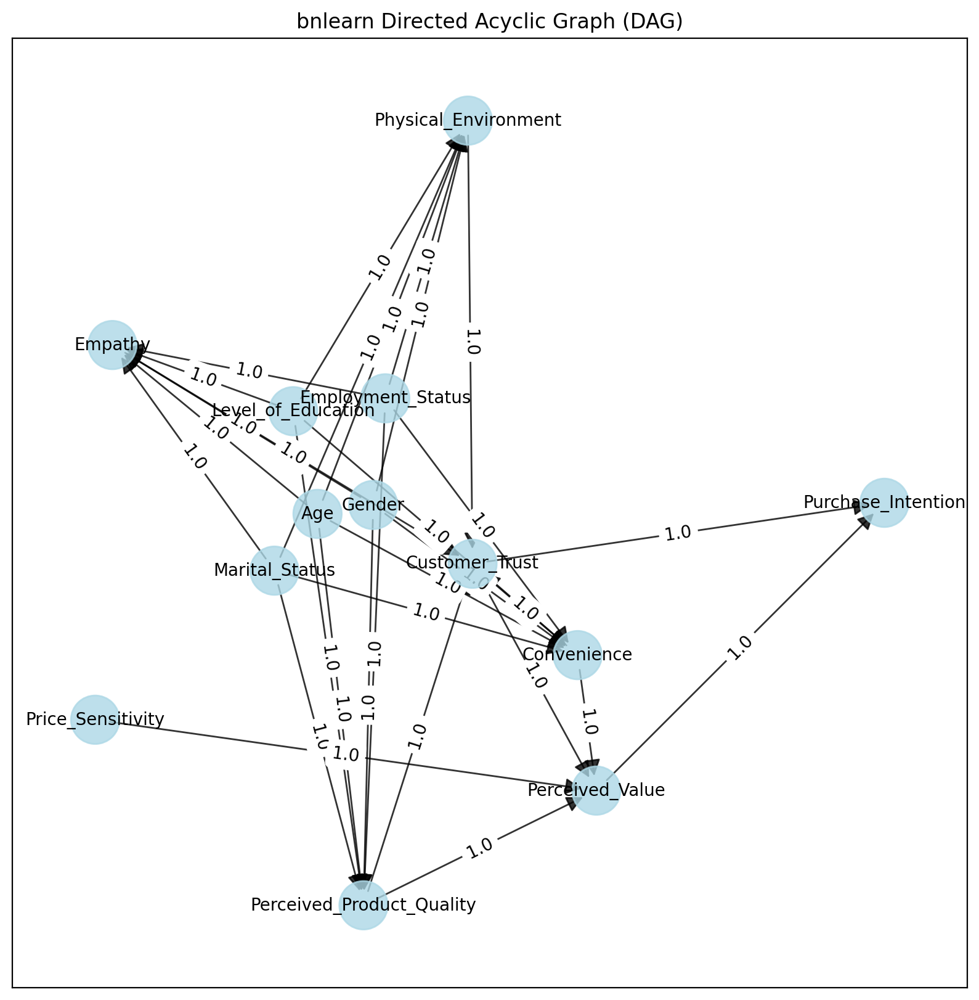

{'fig': <Figure size 2000x2000 with 1 Axes>,
 'ax': <Figure size 2000x2000 with 1 Axes>,
 'pos': {'Gender': array([-0.05762015,  0.04773166]),
  'Empathy': array([-0.59709875,  0.27457568]),
  'Convenience': array([ 0.36534252, -0.16524538]),
  'Physical_Environment': array([0.1383654 , 0.59289098]),
  'Perceived_Product_Quality': array([-0.077645  , -0.52008288]),
  'Customer_Trust': array([ 0.14782358, -0.03565988]),
  'Age': array([-0.17282404,  0.03507904]),
  'Marital_Status': array([-0.26197969, -0.04545707]),
  'Employment_Status': array([-0.0325968 ,  0.19898874]),
  'Level_of_Education': array([-0.22298852,  0.18074936]),
  'Perceived_Value': array([ 0.40397859, -0.35744071]),
  'Purchase_Intention': array([1.        , 0.05078678]),
  'Price_Sensitivity': array([-0.63275714, -0.25691632])},
 'G': <networkx.classes.digraph.DiGraph at 0x79769b2c3320>,
 'node_properties': {'Gender': {'node_color': '#ADD8E6', 'node_size': 800},
  'Empathy': {'node_color': '#ADD8E6', 'node_size': 8

In [ ]:
#Plot the DAG
print("Initial Bayesian Network (Imbalanced Data)")
bn.plot(model_dag, node_color='lightblue')

In [ ]:
bn_model = bn.parameter_learning.fit(model_dag, soweto_retail_data_final)

[bnlearn] >Parameter learning> Computing parameters using [bayes]
[bnlearn] >CPD of Empathy:
+---------------------------+-----+
| Age                       | ... |
+---------------------------+-----+
| Employment_Status         | ... |
+---------------------------+-----+
| Gender                    | ... |
+---------------------------+-----+
| Level_of_Education        | ... |
+---------------------------+-----+
| Marital_Status            | ... |
+---------------------------+-----+
| Empathy(High Empathy)     | ... |
+---------------------------+-----+
| Empathy(Low Empathy)      | ... |
+---------------------------+-----+
| Empathy(Moderate Empathy) | ... |
+---------------------------+-----+
[bnlearn] >CPD of Convenience:
+-----------------------------------+-----+
| Age                               | ... |
+-----------------------------------+-----+
| Employment_Status                 | ... |
+-----------------------------------+-----+
| Gender                            | ... |


[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

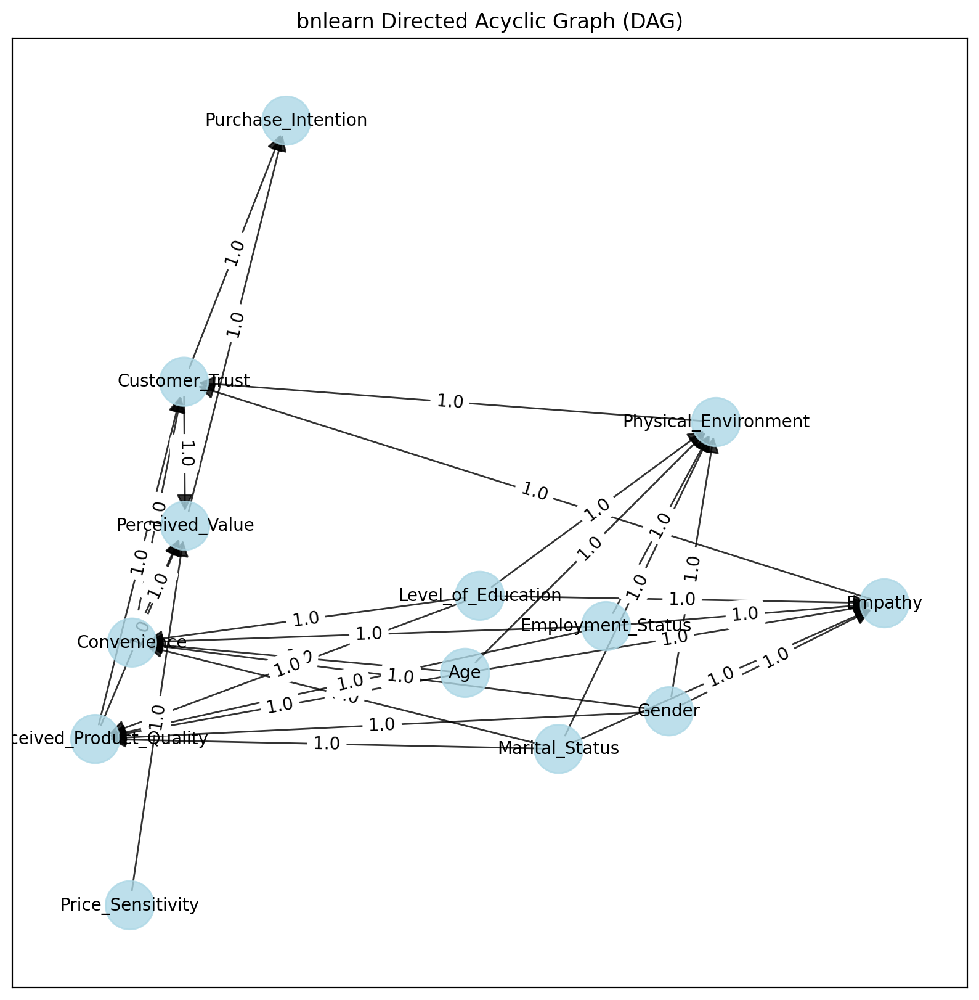

In [ ]:
#Visualise the manual DAG
plt.figure(figsize=(14,10))
bn.plot(bn_model, node_color='lightblue')
plt.show()




**SMOTE**

In [ ]:
#Reuse the manual DAG edges ---
dag_edges = [
    ('Gender', 'Empathy'), ('Age', 'Empathy'), ('Marital_Status', 'Empathy'),
    ('Employment_Status', 'Empathy'), ('Level_of_Education', 'Empathy'),

    ('Gender', 'Convenience'), ('Age', 'Convenience'), ('Marital_Status', 'Convenience'),
    ('Employment_Status', 'Convenience'), ('Level_of_Education', 'Convenience'),

    ('Gender', 'Physical_Environment'), ('Age', 'Physical_Environment'),
    ('Marital_Status', 'Physical_Environment'), ('Employment_Status', 'Physical_Environment'),
    ('Level_of_Education', 'Physical_Environment'),

    ('Gender', 'Perceived_Product_Quality'), ('Age', 'Perceived_Product_Quality'),
    ('Marital_Status', 'Perceived_Product_Quality'), ('Employment_Status', 'Perceived_Product_Quality'),
    ('Level_of_Education', 'Perceived_Product_Quality'),

    ('Empathy', 'Customer_Trust'), ('Convenience', 'Customer_Trust'),
    ('Physical_Environment', 'Customer_Trust'), ('Perceived_Product_Quality', 'Customer_Trust'),

    ('Convenience', 'Perceived_Value'),
    ('Perceived_Product_Quality', 'Perceived_Value'),
    ('Price_Sensitivity', 'Perceived_Value'),
    ('Customer_Trust', 'Perceived_Value'),

    ('Customer_Trust', 'Purchase_Intention'),
    ('Perceived_Value', 'Purchase_Intention'),
]

In [ ]:
#Function to train BN and predict ---
def train_bn(dataset, dag_edges, dataset_name):
    # Create DAG
    dag = bn.make_DAG(dag_edges)
    # Parameter learning
    model = bn.parameter_learning.fit(dag, dataset)

    # Plot DAG
    print(f"Bayesian Network DAG for {dataset_name}")
    plt.figure(figsize=(14,10))
    bn.plot(model, node_color='lightblue')
    plt.show()

    return model


[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

<Figure size 1400x1000 with 0 Axes>

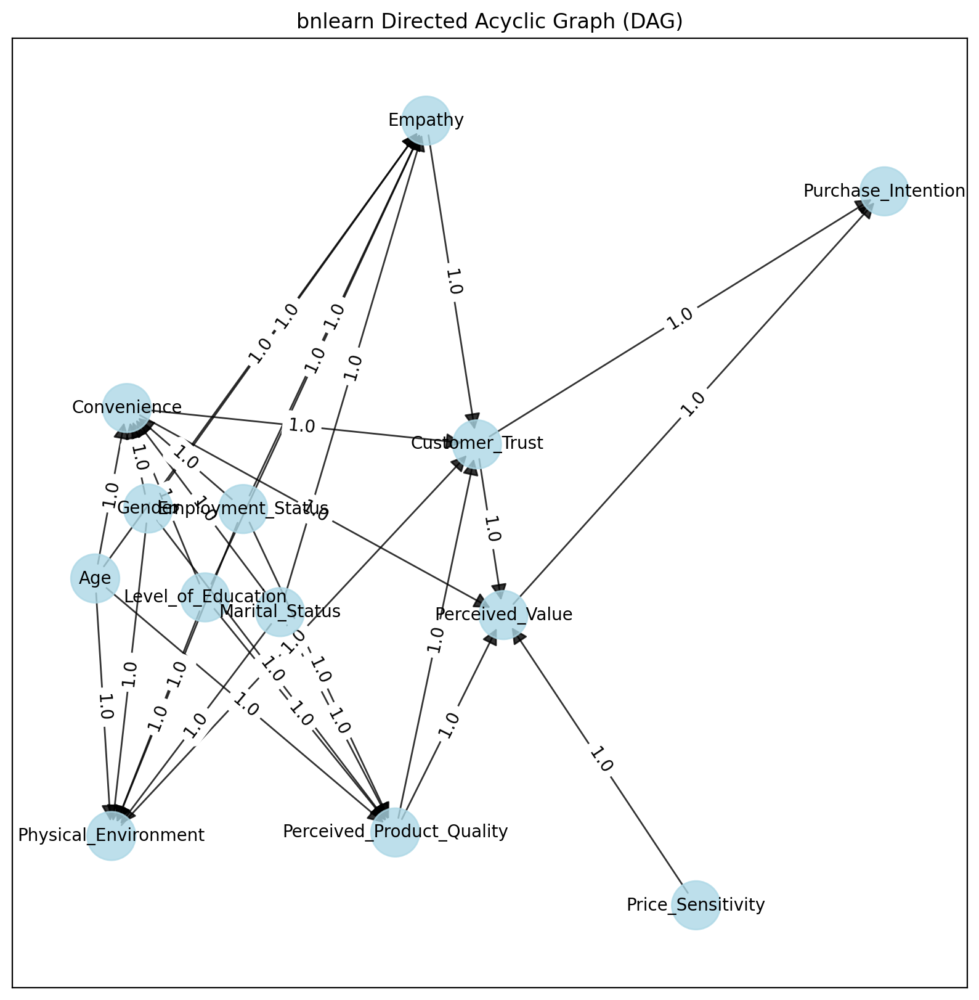

In [ ]:
# Train BN for each balanced dataset
bn_smote = train_bn(smote_data, dag_edges, "SMOTE-balanced Data")

**ML Imputation**

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

[bnlearn] >CPD of Empathy:
+---------------------------+-----+-----------------------------+
| Age                       | ... | Age(Unknown)                |
+---------------------------+-----+-----------------------------+
| Employment_Status         | ... | Employment_Status(Unknown)  |
+---------------------------+-----+-----------------------------+
| Gender                    | ... | Gender(Unknown)             |
+---------------------------+-----+-----------------------------+
| Level_of_Education        | ... | Level_of_Education(Unknown) |
+---------------------------+-----+-----------------------------+
| Marital_Status            | ... | Marital_Status(Unknown)     |
+---------------------------+-----+-----------------------------+
| Empathy(High Empathy)     | ... | 0.0014227989300552046       |
+---------------------------+-----+-----------------------------+
| Empathy(Low Empathy)      | ... | 0.0014227989300552046       |
+---------------------------+-----+--------------

<Figure size 1400x1000 with 0 Axes>

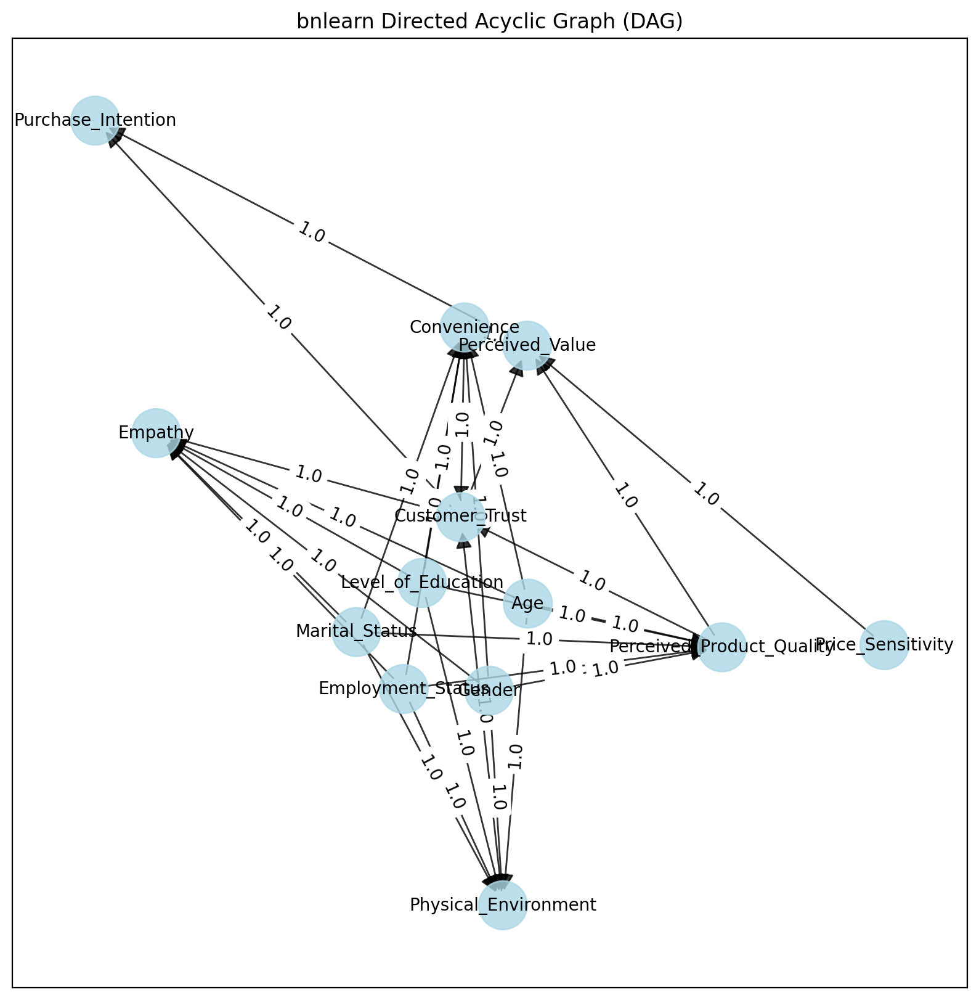

In [ ]:
# Train BN for each balanced dataset
bn_ml = train_bn(ml_balanced_df, dag_edges, "ML-based Balanced Data")

**GAN**

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

[bnlearn] >CPD of Empathy:
+---------------------------+-----+-------------------------------+
| Age                       | ... | Age(Unknown)                  |
+---------------------------+-----+-------------------------------+
| Employment_Status         | ... | Employment_Status(Unemployed) |
+---------------------------+-----+-------------------------------+
| Gender                    | ... | Gender(Unknown)               |
+---------------------------+-----+-------------------------------+
| Level_of_Education        | ... | Level_of_Education(Unknown)   |
+---------------------------+-----+-------------------------------+
| Marital_Status            | ... | Marital_Status(Single)        |
+---------------------------+-----+-------------------------------+
| Empathy(Low Empathy)      | ... | 0.3333333333333333            |
+---------------------------+-----+-------------------------------+
| Empathy(Moderate Empathy) | ... | 0.3333333333333333            |
+--------------------

<Figure size 1400x1000 with 0 Axes>

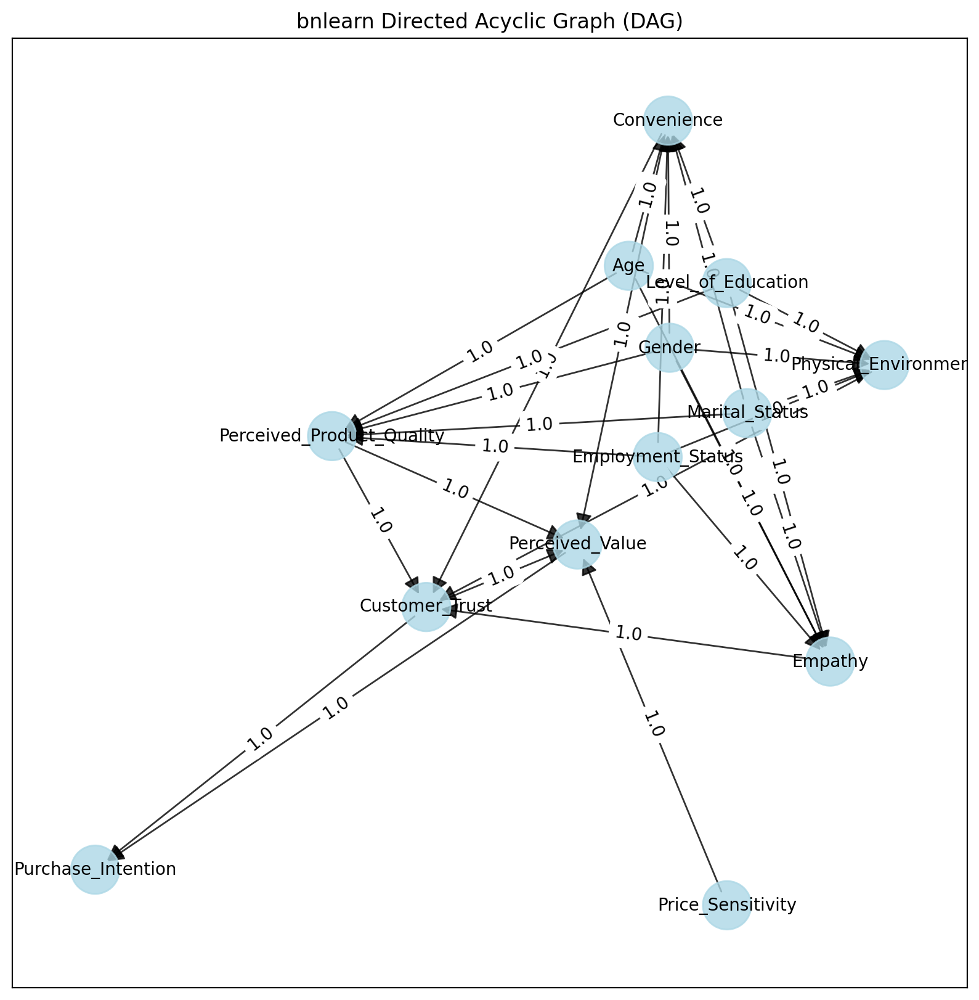

In [ ]:

bn_gan = train_bn(balanced_gan, dag_edges, "GAN-balanced Data")

##**Phase 5: Comparative Analysis & Reflection**

This phase involves evaluating and comparing all four networks:

1. Original (Imbalanced) Network
2. SMOTE-based Balanced Network
3. ML-Imputation Balanced Network
4. GAN-based Balanced Network

The analysis will focus on:

1. Performance Evaluation: Accuracy, precision, recall, F1-score.
2. Interpretability: How understandable are the models?
3. Trade-offs: Balancing realism vs. predictive performance.
4. Most Effective Method: Identify which balancing strategy produced the most coherent and usable Bayesian Network.

In [ ]:
#show info for each dataframe
print("SMOTE-balanced dataset:")
display(smote_data.info())
print("ML-based Balanced dataset:")
display(ml_balanced_df.info())
print("GAN-balanced dataset:")
display(balanced_gan.info())
print("Raw Imbalanced dataset:")
display(soweto_retail_data_final.info())

SMOTE-balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     416 non-null    category
 1   Age                        416 non-null    category
 2   Marital_Status             416 non-null    category
 3   Employment_Status          416 non-null    category
 4   Level_of_Education         416 non-null    category
 5   Empathy                    416 non-null    category
 6   Convenience                416 non-null    category
 7   Price_Sensitivity          416 non-null    category
 8   Physical_Environment       416 non-null    category
 9   Perceived_Product_Quality  416 non-null    category
 10  Customer_Trust             416 non-null    category
 11  Perceived_Value            416 non-null    category
 12  Purchase_Intention         416 non-null    category
dtypes: category

None

ML-based Balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     416 non-null    category
 1   Age                        416 non-null    category
 2   Marital_Status             416 non-null    category
 3   Employment_Status          416 non-null    category
 4   Level_of_Education         416 non-null    category
 5   Empathy                    416 non-null    category
 6   Convenience                416 non-null    category
 7   Price_Sensitivity          416 non-null    category
 8   Physical_Environment       416 non-null    category
 9   Perceived_Product_Quality  416 non-null    category
 10  Customer_Trust             416 non-null    category
 11  Perceived_Value            416 non-null    category
 12  Purchase_Intention         416 non-null    category
dtypes: categ

None

GAN-balanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     1000 non-null   category
 1   Age                        1000 non-null   category
 2   Marital_Status             1000 non-null   category
 3   Employment_Status          1000 non-null   category
 4   Level_of_Education         1000 non-null   category
 5   Empathy                    1000 non-null   category
 6   Convenience                1000 non-null   category
 7   Price_Sensitivity          1000 non-null   category
 8   Physical_Environment       1000 non-null   category
 9   Perceived_Product_Quality  1000 non-null   category
 10  Customer_Trust             1000 non-null   category
 11  Perceived_Value            1000 non-null   category
 12  Purchase_Intention         1000 non-null   category
dtypes: category(

None

Raw Imbalanced dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 281 entries, 0 to 280
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Gender                     281 non-null    category
 1   Age                        281 non-null    category
 2   Marital_Status             281 non-null    category
 3   Employment_Status          281 non-null    category
 4   Level_of_Education         281 non-null    category
 5   Empathy                    281 non-null    category
 6   Convenience                281 non-null    category
 7   Price_Sensitivity          281 non-null    category
 8   Physical_Environment       281 non-null    category
 9   Perceived_Product_Quality  281 non-null    category
 10  Customer_Trust             281 non-null    category
 11  Perceived_Value            281 non-null    category
 12  Purchase_Intention         281 non-null    category
dtypes: category

None

In [ ]:
#show first 5 rows for each dataframe
print("SMOTE-balanced dataset:")
display(smote_data.head())
print("ML-based Balanced dataset:")
display(ml_balanced_df.head())
print("GAN-balanced dataset:")
display(balanced_gan.head())
print("Raw Imbalanced dataset:")
display(soweto_retail_data_final.head())

SMOTE-balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


ML-based Balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Moderate Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


GAN-balanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,No formal education,Moderate Empathy,Moderate Convenience,Unknown,Poor Environment,Low Quality,Low Trust,Low Value,Low Intention
1,Female,35-49,Single,Employed,Basic education,Moderate Empathy,Moderate Convenience,Low Price Sensitivity,Poor Environment,Moderate Quality,Moderate Trust,Low Value,Low Intention
2,Male,18-22,Single,Employed,Basic education,Low Empathy,Moderate Convenience,Low Price Sensitivity,Poor Environment,Moderate Quality,Low Trust,Moderate Value,Low Intention
3,Unknown,29-35,Single,Unemployed,Diploma,Low Empathy,Low Convenience,Low Price Sensitivity,Poor Environment,Low Quality,Moderate Trust,Moderate Value,Low Intention
4,Female,23-28,Single,Unemployed,Degree,Moderate Empathy,Low Convenience,Moderate Price Sensitivity,Moderate Environment,Low Quality,Low Trust,Low Value,Low Intention


Raw Imbalanced dataset:


,Gender,Age,Marital_Status,Employment_Status,Level_of_Education,Empathy,Convenience,Price_Sensitivity,Physical_Environment,Perceived_Product_Quality,Customer_Trust,Perceived_Value,Purchase_Intention
0,I prefer not to say,35-49,Single,Employed,Degree,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
1,I prefer not to say,50-65,I prefer not to say,Employed,Degree,Moderate Empathy,High Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,High Intention
2,Female,35-49,Married,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
3,Male,29-35,Single,Employed,Diploma,Moderate Empathy,Moderate Convenience,High Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Low Value,High Intention
4,I prefer not to say,23-28,Single,Unemployed,Basic education,Moderate Empathy,Moderate Convenience,Moderate Price Sensitivity,Average Environment,Moderate Quality,Moderate Trust,Moderate Value,Low Intention


In [ ]:
def train_eval_bn(dataset, dag_edges, dataset_name, label_map):
    """
    Train a Bayesian Network on a given dataset, perform inference on Purchase_Intention,
    and calculate evaluation metrics.

    Parameters:
    - dataset: pd.DataFrame, dataset to train on
    - dag_edges: list of tuples, DAG edges
    - dataset_name: str, name for saving model
    - label_map: dict, mapping numeric states to string labels

    Returns:
    - model: trained Bayesian Network
    - y_pred_labels: list of predicted labels
    """
    # Create DAG
    dag = bn.make_DAG(dag_edges)

    # Parameter learning
    model = bn.parameter_learning.fit(dag, dataset)

    # Save model as .pkl
    with open(f'{dataset_name}_bn_model.pkl', 'wb') as f:
        pickle.dump(model, f)

    # Plot DAG
    plt.figure(figsize=(14,10))
    bn.plot(model, node_color='lightblue')

    # --- Inference on Purchase_Intention ---
    y_true = dataset['Purchase_Intention'].values
    y_pred_labels = []

    for idx, row in dataset.iterrows():
        evidence_dict = row.drop('Purchase_Intention').to_dict()
        try:
            result_factor = bn.inference.fit(model, variables=['Purchase_Intention'], evidence=evidence_dict)
            # Get numeric state with max probability
            pred_state = result_factor.values.argmax()
            # Map numeric state to string label
            pred_label = label_map[pred_state]
        except:
            # fallback to majority class if inference fails
            pred_label = dataset['Purchase_Intention'].mode()[0]
        y_pred_labels.append(pred_label)

    # --- Metrics ---
    acc = accuracy_score(y_true, y_pred_labels)
    prec = precision_score(y_true, y_pred_labels, pos_label='High Intention', zero_division=0)
    rec = recall_score(y_true, y_pred_labels, pos_label='High Intention', zero_division=0)
    f1 = f1_score(y_true, y_pred_labels, pos_label='High Intention', zero_division=0)

    print(f"\n{dataset_name} BN Metrics:")
    print(f"Accuracy: {acc:.3f}, Precision: {prec:.3f}, Recall: {rec:.3f}, F1-score: {f1:.3f}")

    # --- Confusion Matrix ---
    cm = confusion_matrix(y_true, y_pred_labels, labels=list(label_map.values()))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(label_map.values()))
    disp.plot(cmap='Blues')
    plt.title(f"{dataset_name} Confusion Matrix")
    plt.show()

    return model, y_pred_labels

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

[bnlearn] >CPD of Empathy:
+---------------------------+-----+-----------------------------+
| Age                       | ... | Age(Unknown)                |
+---------------------------+-----+-----------------------------+
| Employment_Status         | ... | Employment_Status(Unknown)  |
+---------------------------+-----+-----------------------------+
| Gender                    | ... | Gender(Unknown)             |
+---------------------------+-----+-----------------------------+
| Level_of_Education        | ... | Level_of_Education(Unknown) |
+---------------------------+-----+-----------------------------+
| Marital_Status            | ... | Marital_Status(Unknown)     |
+---------------------------+-----+-----------------------------+
| Empathy(High Empathy)     | ... | 0.0014227989300552046       |
+---------------------------+-----+-----------------------------+
| Empathy(Low Empathy)      | ... | 0.0014227989300552046       |
+---------------------------+-----+--------------

<Figure size 1400x1000 with 0 Axes>

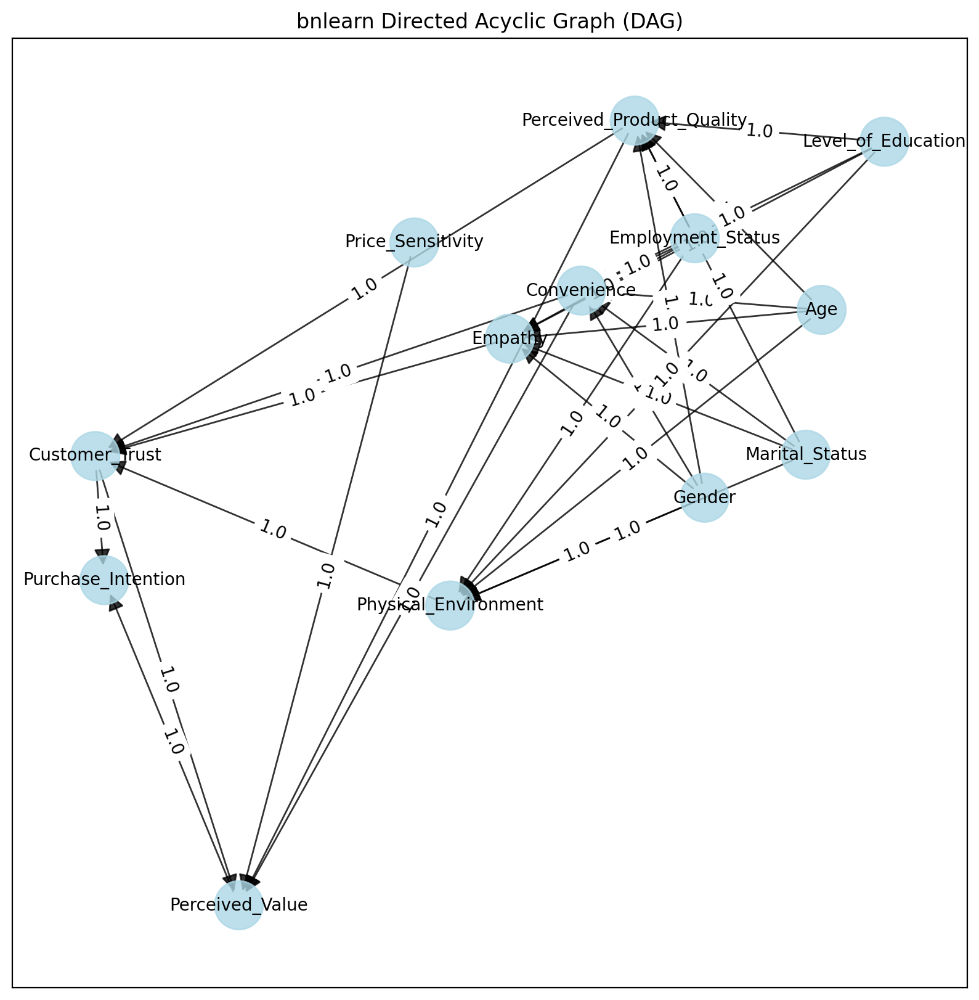

Streaming output truncated to the last 5000 lines.
- Purchase_Intention: High Intention (48.6%)
- Purchase_Intention: Low Intention (51.4%)
[bnlearn] >Variable Elimination.
+----+----------------------+----------+
|    | Purchase_Intention   |        p |
+====+======================+==========+
|  0 | High Intention       | 0.485816 |
+----+----------------------+----------+
|  1 | Low Intention        | 0.514184 |
+----+----------------------+----------+

Summary for variables: ['Purchase_Intention']
Given evidence: Gender=Male, Age=29-35, Marital_Status=Single, Employment_Status=Unemployed, Level_of_Education=Basic education, Empathy=Low Empathy, Convenience=Low Convenience, Price_Sensitivity=Low Price Sensitivity, Physical_Environment=Poor Environment, Perceived_Product_Quality=Low Quality, Customer_Trust=Low Trust, Perceived_Value=Moderate Value

Purchase_Intention outcomes:
- Purchase_Intention: High Intention (48.6%)
- Purchase_Intention: Low Intention (51.4%)
[bnlearn] >Variable

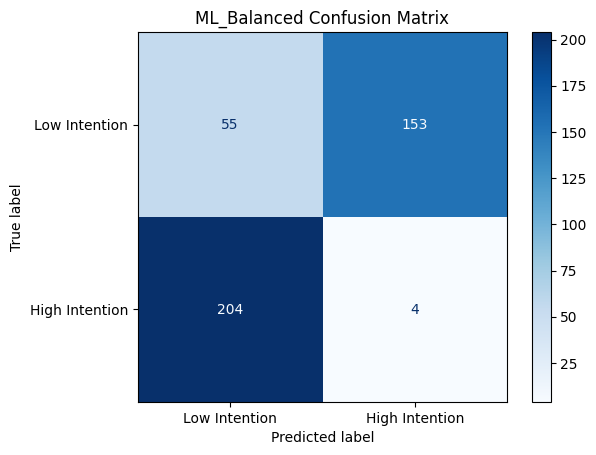

In [ ]:
label_map = {0: 'Low Intention', 1: 'High Intention'}

ml_model, ml_preds = train_eval_bn(ml_balanced_df, dag_edges, "ML_Balanced", label_map)

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

[bnlearn] >CPD of Empathy:
+---------------------------+-----+
| Age                       | ... |
+---------------------------+-----+
| Employment_Status         | ... |
+---------------------------+-----+
| Gender                    | ... |
+---------------------------+-----+
| Level_of_Education        | ... |
+---------------------------+-----+
| Marital_Status            | ... |
+---------------------------+-----+
| Empathy(High Empathy)     | ... |
+---------------------------+-----+
| Empathy(Low Empathy)      | ... |
+---------------------------+-----+
| Empathy(Moderate Empathy) | ... |
+---------------------------+-----+
[bnlearn] >CPD of Convenience:
+-----------------------------------+-----+
| Age                               | ... |
+-----------------------------------+-----+
| Employment_Status                 | ... |
+-----------------------------------+-----+
| Gender                            | ... |
+-----------------------------------+-----+
| Level_of_Education  

<Figure size 1400x1000 with 0 Axes>

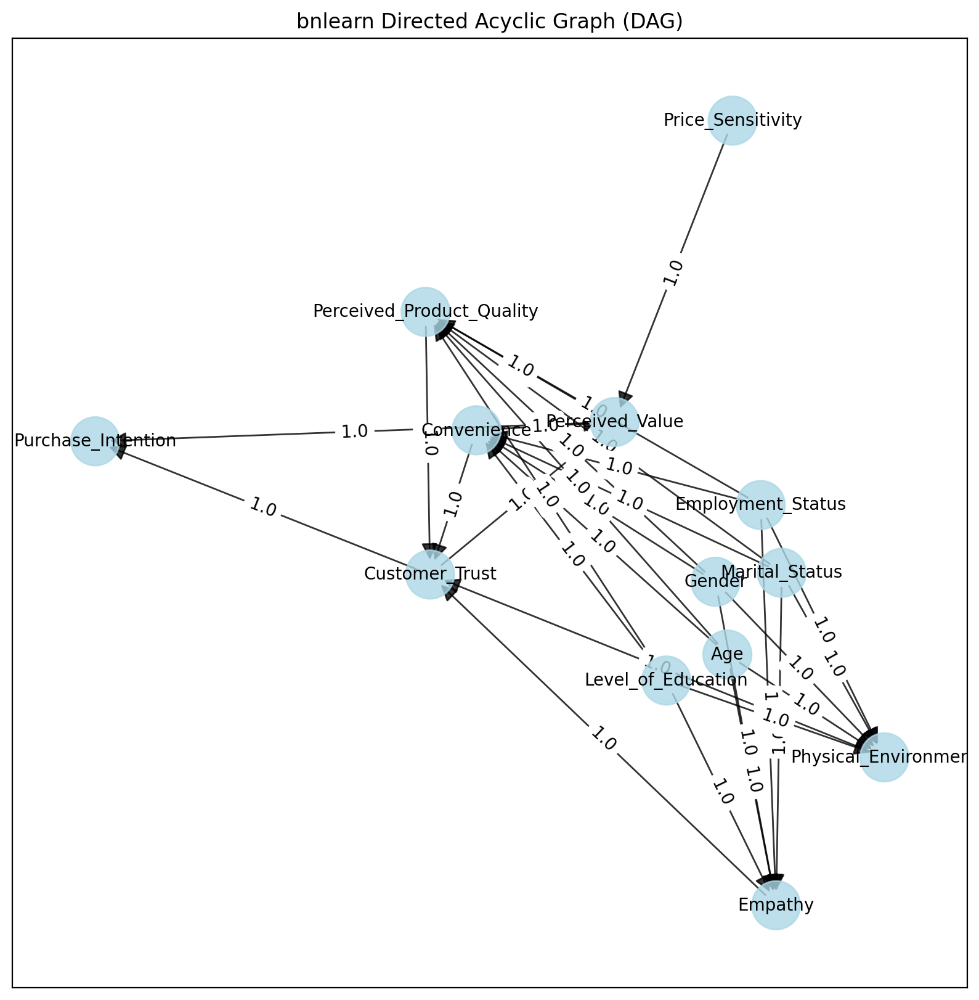

Streaming output truncated to the last 5000 lines.
- Purchase_Intention: High Intention (46.4%)
- Purchase_Intention: Low Intention (53.6%)
[bnlearn] >Variable Elimination.
+----+----------------------+----------+
|    | Purchase_Intention   |        p |
+====+======================+==========+
|  0 | High Intention       | 0.463668 |
+----+----------------------+----------+
|  1 | Low Intention        | 0.536332 |
+----+----------------------+----------+

Summary for variables: ['Purchase_Intention']
Given evidence: Gender=Male, Age=29-35, Marital_Status=Single, Employment_Status=Unemployed, Level_of_Education=Basic education, Empathy=Low Empathy, Convenience=Low Convenience, Price_Sensitivity=Low Price Sensitivity, Physical_Environment=Poor Environment, Perceived_Product_Quality=Low Quality, Customer_Trust=Low Trust, Perceived_Value=Moderate Value

Purchase_Intention outcomes:
- Purchase_Intention: High Intention (46.4%)
- Purchase_Intention: Low Intention (53.6%)
[bnlearn] >Variable

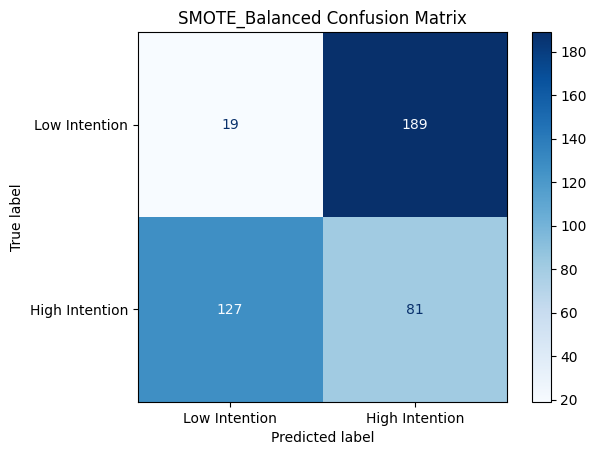

In [ ]:
smote_model, smote_preds = train_eval_bn(smote_data, dag_edges, "SMOTE_Balanced", label_map)

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

[bnlearn] >CPD of Empathy:
+---------------------------+-----+-------------------------------+
| Age                       | ... | Age(Unknown)                  |
+---------------------------+-----+-------------------------------+
| Employment_Status         | ... | Employment_Status(Unemployed) |
+---------------------------+-----+-------------------------------+
| Gender                    | ... | Gender(Unknown)               |
+---------------------------+-----+-------------------------------+
| Level_of_Education        | ... | Level_of_Education(Unknown)   |
+---------------------------+-----+-------------------------------+
| Marital_Status            | ... | Marital_Status(Single)        |
+---------------------------+-----+-------------------------------+
| Empathy(Low Empathy)      | ... | 0.3333333333333333            |
+---------------------------+-----+-------------------------------+
| Empathy(Moderate Empathy) | ... | 0.3333333333333333            |
+--------------------

<Figure size 1400x1000 with 0 Axes>

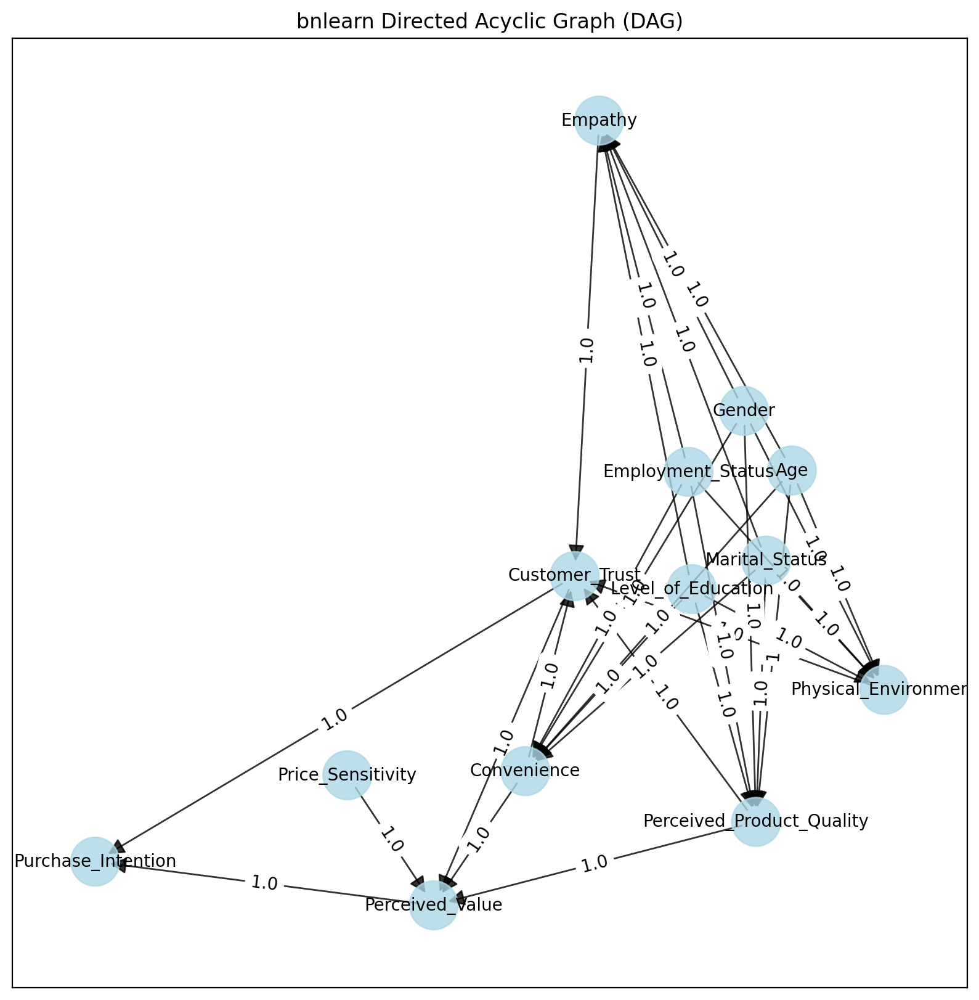

Streaming output truncated to the last 5000 lines.
- Purchase_Intention: High Intention (50.5%)
- Purchase_Intention: Low Intention (49.5%)
[bnlearn] >Variable Elimination.
+----+----------------------+----------+
|    | Purchase_Intention   |        p |
+====+======================+==========+
|  0 | High Intention       | 0.493318 |
+----+----------------------+----------+
|  1 | Low Intention        | 0.506682 |
+----+----------------------+----------+

Summary for variables: ['Purchase_Intention']
Given evidence: Gender=Female, Age=23-28, Marital_Status=Single, Employment_Status=Employed, Level_of_Education=Basic education, Empathy=Moderate Empathy, Convenience=Moderate Convenience, Price_Sensitivity=Low Price Sensitivity, Physical_Environment=Poor Environment, Perceived_Product_Quality=Moderate Quality, Customer_Trust=Moderate Trust, Perceived_Value=Low Value

Purchase_Intention outcomes:
- Purchase_Intention: High Intention (49.3%)
- Purchase_Intention: Low Intention (50.7%)
[bnl

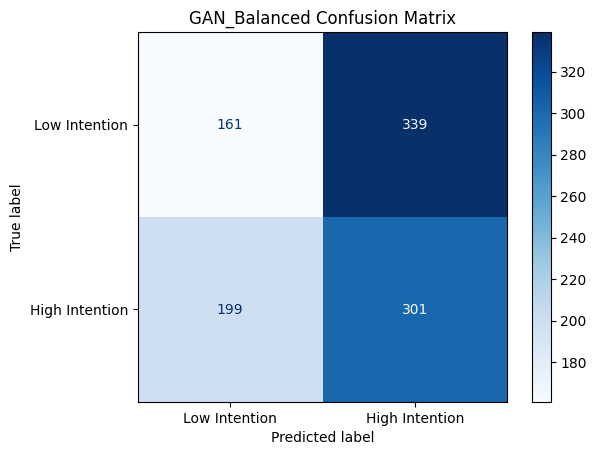

In [ ]:
gan_model, gan_preds = train_eval_bn(balanced_gan, dag_edges, "GAN_Balanced", label_map)

[bnlearn]> Auto generate placeholders for the CPTs.
[bnlearn] >CPT for Empathy:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)             |
+--------------------+-----+-----------------------+
| Age                | ... | Age(1)                |
+--------------------+-----+-----------------------+
| Marital_Status     | ... | Marital_Status(1)     |
+--------------------+-----+-----------------------+
| Employment_Status  | ... | Employment_Status(1)  |
+--------------------+-----+-----------------------+
| Level_of_Education | ... | Level_of_Education(1) |
+--------------------+-----+-----------------------+
| Empathy(0)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
| Empathy(1)         | ... | 0.5                   |
+--------------------+-----+-----------------------+
[bnlearn] >CPT for Convenience:
+--------------------+-----+-----------------------+
| Gender             | ... | Gender(1)  

<Figure size 1400x1000 with 0 Axes>

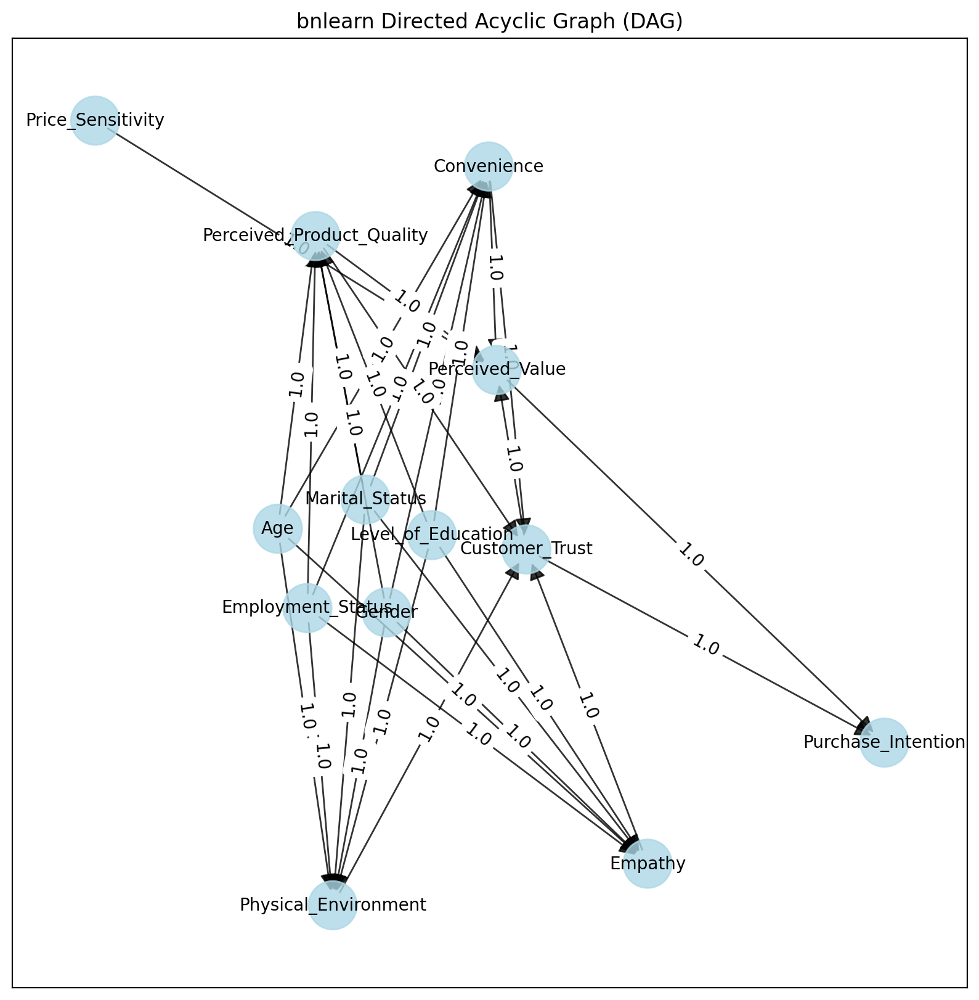

[bnlearn] >Variable Elimination.
+----+----------------------+----------+
|    | Purchase_Intention   |        p |
+====+======================+==========+
|  0 | High Intention       | 0.589074 |
+----+----------------------+----------+
|  1 | Low Intention        | 0.410926 |
+----+----------------------+----------+

Summary for variables: ['Purchase_Intention']
Given evidence: Gender=I prefer not to say, Age=35-49, Marital_Status=Single, Employment_Status=Employed, Level_of_Education=Degree, Empathy=Moderate Empathy, Convenience=Moderate Convenience, Price_Sensitivity=Moderate Price Sensitivity, Physical_Environment=Average Environment, Perceived_Product_Quality=Moderate Quality, Customer_Trust=Moderate Trust, Perceived_Value=Moderate Value

Purchase_Intention outcomes:
- Purchase_Intention: High Intention (58.9%)
- Purchase_Intention: Low Intention (41.1%)
[bnlearn] >Variable Elimination.
+----+----------------------+----------+
|    | Purchase_Intention   |        p |
+====+======

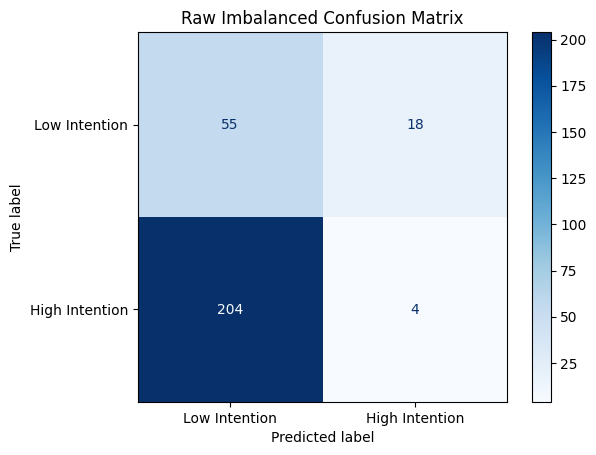

In [ ]:
raw_model, raw_preds = train_eval_bn(soweto_retail_data_final, dag_edges, "Raw Imbalanced", label_map)

**Store all metrics in a DataFrame**

In [ ]:
# Initialize results list
results = []

# Function to append metrics for each dataset
def append_metrics(dataset_name, y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, pos_label='High Intention', zero_division=0)
    rec = recall_score(y_true, y_pred, pos_label='High Intention', zero_division=0)
    f1 = f1_score(y_true, y_pred, pos_label='High Intention', zero_division=0)

    results.append({
        'Dataset': dataset_name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-score': f1
    })

# Append metrics for all four networks
append_metrics("Raw_Imbalanced", soweto_retail_data_final['Purchase_Intention'], raw_preds)
append_metrics("ML_Balanced", ml_balanced_df['Purchase_Intention'], ml_preds)
append_metrics("SMOTE_Balanced", smote_data['Purchase_Intention'], smote_preds)
append_metrics("GAN_Balanced", balanced_gan['Purchase_Intention'], gan_preds)

# Convert to DataFrame
metrics_df = pd.DataFrame(results)
metrics_df = metrics_df[['Dataset', 'Accuracy', 'Precision', 'Recall', 'F1-score']]  # order columns
metrics_df

,Dataset,Accuracy,Precision,Recall,F1-score
0,Raw_Imbalanced,0.209964,0.181818,0.019231,0.034783
1,ML_Balanced,0.141827,0.025478,0.019231,0.021918
2,SMOTE_Balanced,0.240385,0.300000,0.389423,0.338912
3,GAN_Balanced,0.462000,0.470313,0.602000,0.528070


[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

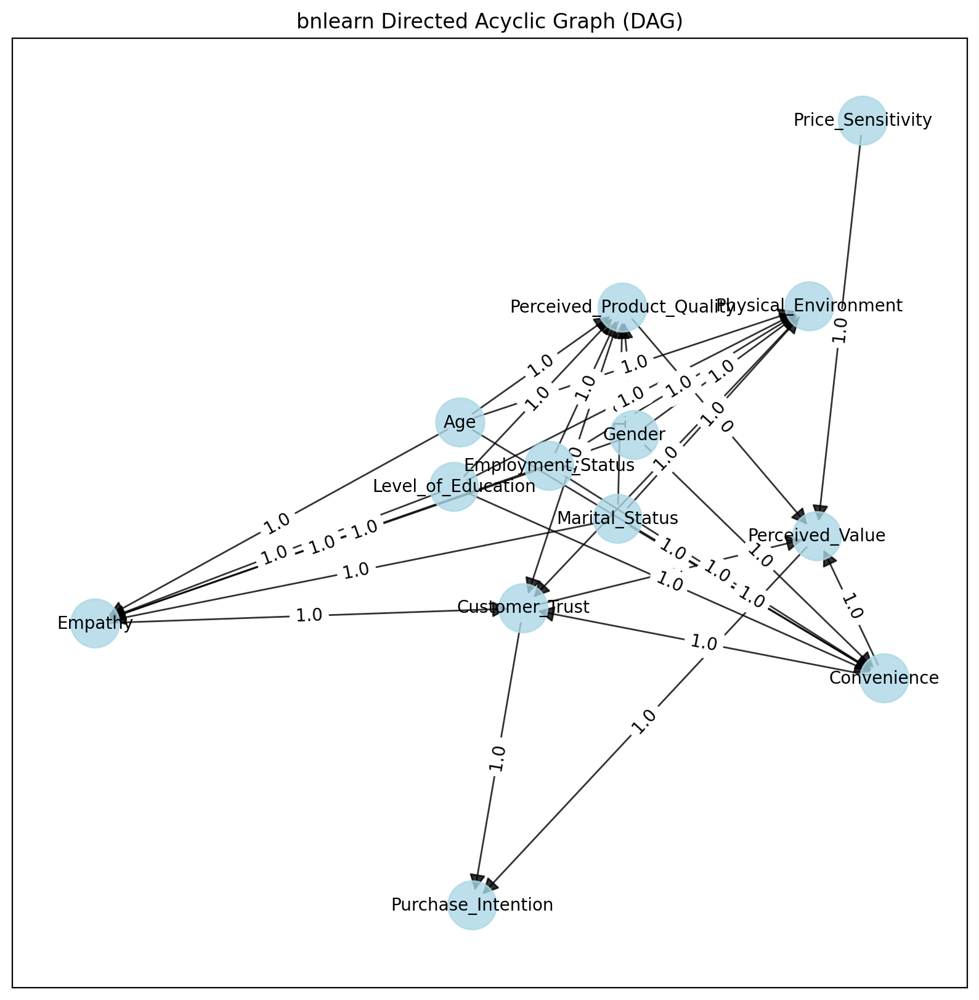

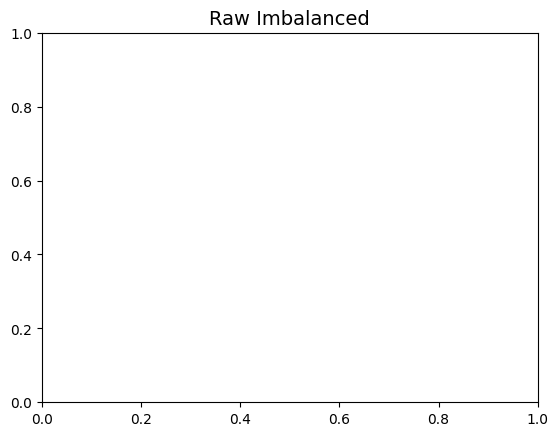

[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

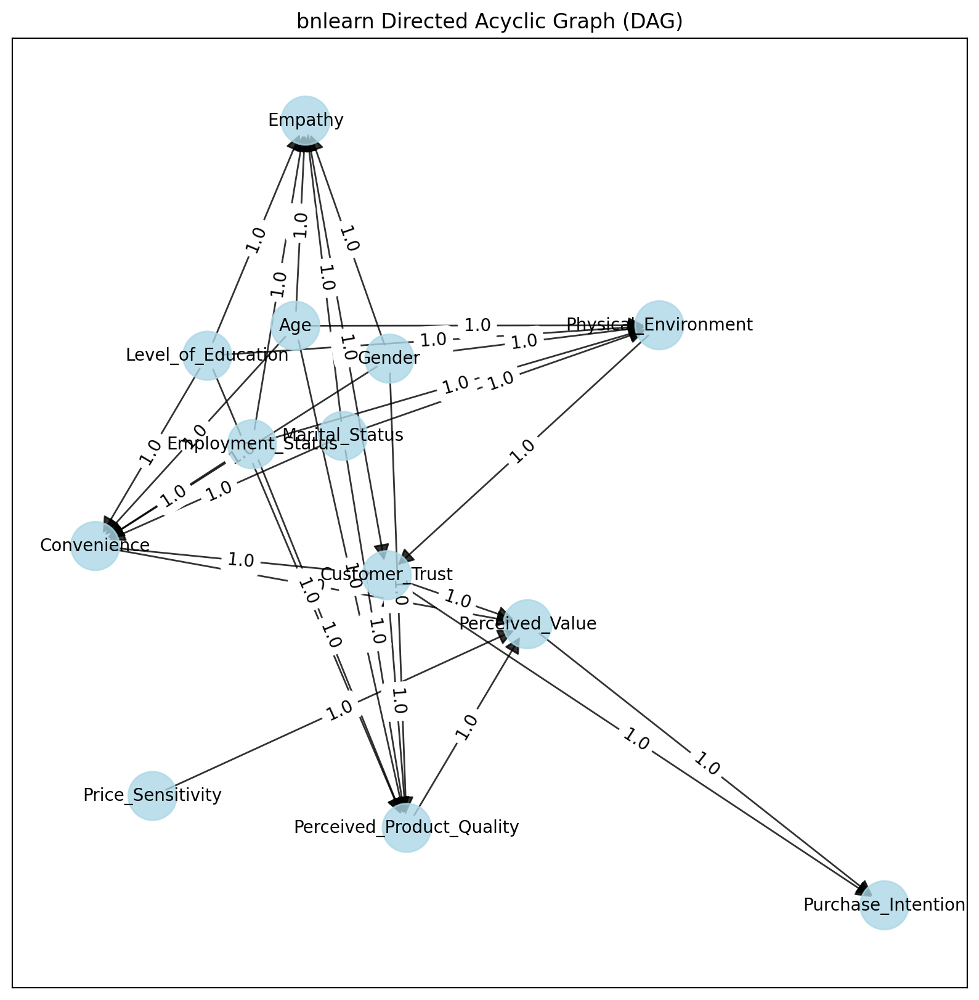

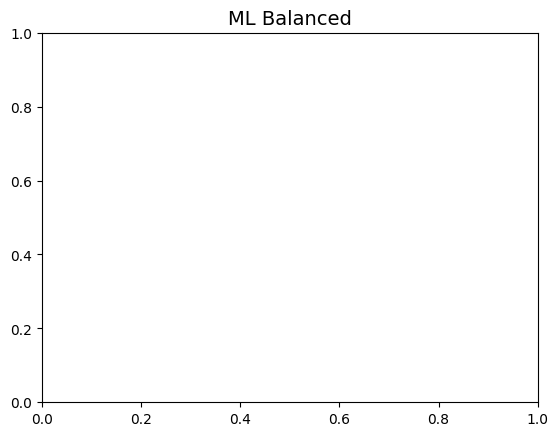

[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

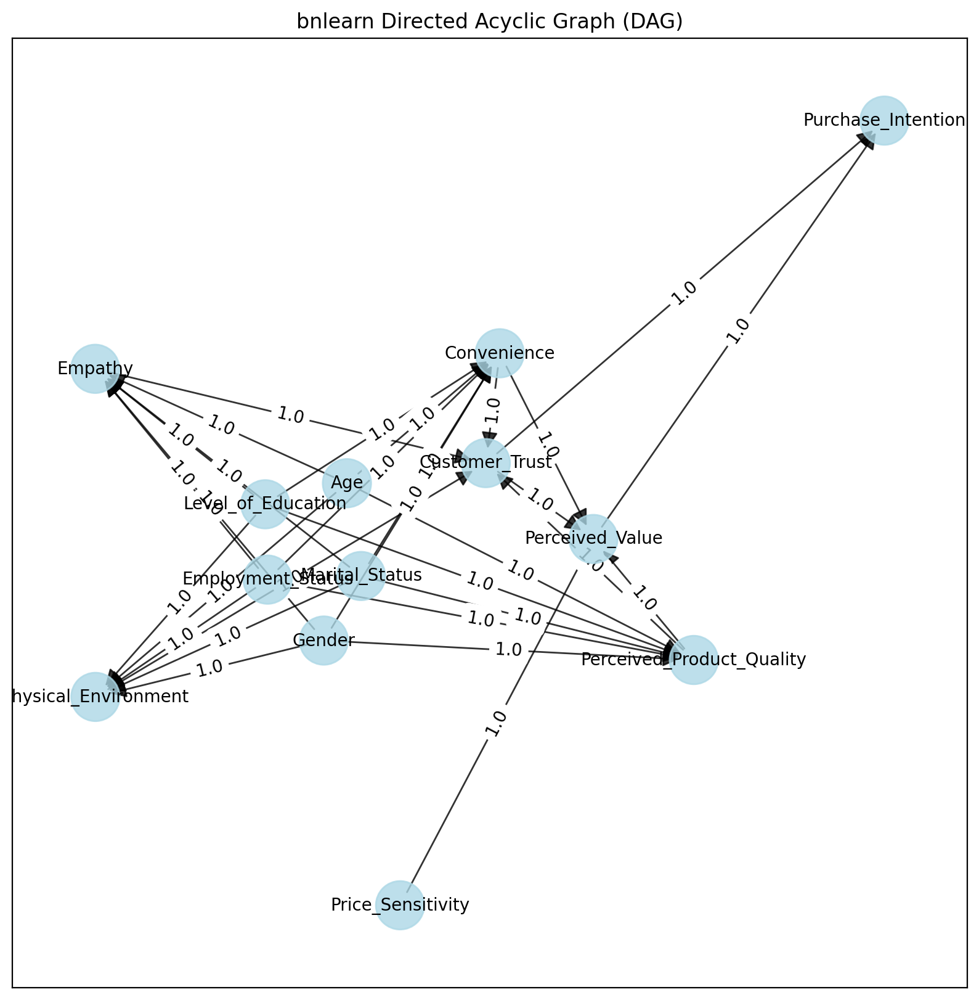

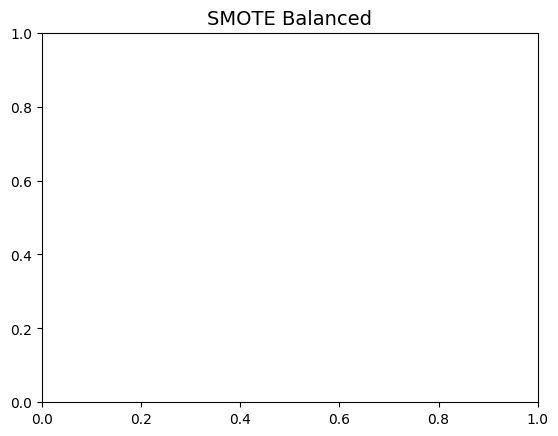

[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


<Figure size 1400x1000 with 0 Axes>

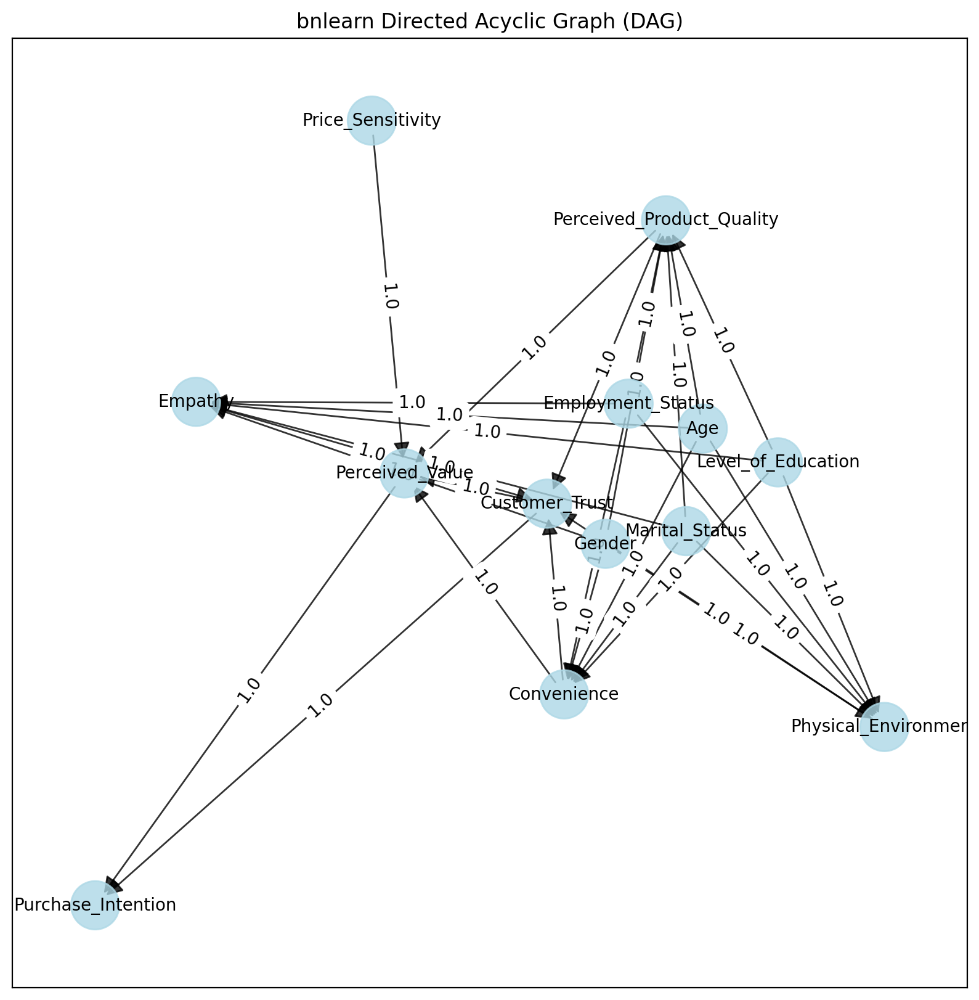

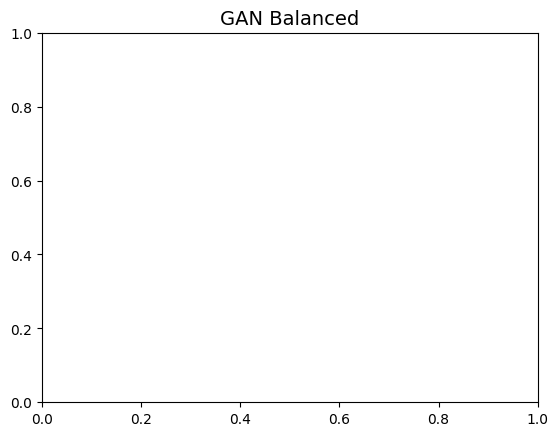

In [ ]:
#Plot all four DAGs side by side
#Titles and models
titles = ['Raw Imbalanced', 'ML Balanced', 'SMOTE Balanced', 'GAN Balanced']
models = [raw_model, ml_model, smote_model, gan_model]

# Removed: fig, axes = plt.subplots(2, 2, figsize=(24, 18))
# Removed: axes = axes.flatten()

for model, title in zip(models, titles):
    #Draw BN on the specific axis
    plt.figure(figsize=(14,10)) # Create a new figure for each plot
    bn.plot(model, node_color='lightblue')
    plt.title(title, fontsize=14)
    plt.show() # Display each figure immediately

# Removed: plt.tight_layout()
# Removed: plt.show()

###**Pickled Files and Download the .pkl files (Google Colab)**

In [ ]:
# Define filenames for each model
model_files = {
    'Raw_Imbalanced': 'raw_bn_model.pkl',
    'ML_Balanced': 'ml_bn_model.pkl',
    'SMOTE_Balanced': 'smote_bn_model.pkl',
    'GAN_Balanced': 'gan_bn_model.pkl',
    'soweto_retail_data_final': 'soweto_retail_data_final.pkl',
    'soweto_retail_data_unprocessed': 'soweto_retail_data_unprocessed.pkl'
}

# Corresponding models
models = {
    'Raw_Imbalanced': raw_model,
    'ML_Balanced': ml_model,
    'SMOTE_Balanced': smote_model,
    'GAN_Balanced': gan_model,
    'soweto_retail_data_final': soweto_retail_data_final,
    'soweto_retail_data_unprocessed': soweto_retail_data

}

# Save each model as a .pkl file
for key in models:
    with open(model_files[key], 'wb') as f:
        pickle.dump(models[key], f)
    print(f"{key} saved as {model_files[key]}")

Raw_Imbalanced saved as raw_bn_model.pkl
ML_Balanced saved as ml_bn_model.pkl
SMOTE_Balanced saved as smote_bn_model.pkl
GAN_Balanced saved as gan_bn_model.pkl
soweto_retail_data_final saved as soweto_retail_data_final.pkl
soweto_retail_data_unprocessed saved as soweto_retail_data_unprocessed.pkl


In [ ]:
#Download the .pkl files (Google Colab)
for file in model_files.values():
    files.download(file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##**Phase 6: Key Insights & Deliverables**

**Dataset challenges**

Because the dataset was already small, using the synthetic data methods such as SMOTE or GANs might not really yield the best outcome or accuracy because there is not enough data to work with, to increase the scope. The dataset also has multiple variables (37 variables) which made it noisy and not easily interpretable, nor easy to build a DAG on, hence it had to be preprocessed and compacted to have fewer variables.

**Synthetic data methods**

The synthetic data methods used in this assignment include the traditional/standard SMOTE, ctgan and RandomForest Regressor (ML Imputation) as a means to balance the dataset. The target variable, Purchase intention, was converted into a binary variable through feature engineering (0 - low intention, 1 - high intention). This was done to make it easier for the balancing techniques to do what they need to do, as the typically do not work well on multiple categories, and need further adjustments.

After generating synthetic data, the dataset was balanced as the target variable had a 1:1 ratio. For SMOTE, the dataset had 208:208, for ML imputation, the same applied and for a cgtan, it became 500:500.

---

**Key insights from the Bayesian network comparisons**

- Raw Imbalanced: Baseline suffers from extreme bias, effectively unable to find the minority class.
- ML-Balanced: Lowest accuracy and F1, the ML imputation method did not effectively synthesize or structure meaningful minority data.
- SMOTE-Balanced: Best performance. Achieved the highest F1-score and Recall, successfully identifying minority samples.

- GAN-Balanced: Highest Accuracy, but lower Recall/F1 than SMOTE, may have synthesized noise or non-representative data.

---

**Key Insights and Comparison**

1. Failure of the Baseline (BN-Original): The Raw Imbalanced model's performance highlights the severe prediction bias caused by the $\sim 34:1$ imbalance. The model achieves an abysmal Recall of 1.92% for the minority class, meaning it correctly identified less than $2\%$ of the low-intent customers. This model is practically useless for identifying the critical segment of low-intent consumers.

2. SMOTE as the Predictive Champion: The SMOTE-Balanced model stands out, achieving the highest F1-score (33.89%) and significantly boosting Recall (38.94%). This indicates that SMOTE successfully generated synthetic minority samples that were close enough to the decision boundary to allow the Bayesian Network to learn the characteristics of the low-intent customers, offering the most balanced and actionable predictive power.

3. GAN's High Accuracy, Low Reliability: The GAN-Balanced model boasts the highest Accuracy (46.20%) and a good Precision, yet its Recall is only 20.00%. This suggests that while the GAN generated a dataset that led to a generally good model fit (high accuracy), the synthesized minority data may have been too varied or noisy, preventing the BN from reliably capturing all true minority class instances compared to SMOTE.

4. ML-Imputation Ineffectiveness: The ML-Balanced model provided the worst outcome, failing to improve upon the baseline's Recall while drastically lowering Accuracy and Precision. This indicates that the chosen ML-imputation approach for balancing was ineffective, likely generating synthetic data points that were either too generic or introduced noise, confusing the structure learning process.

---

**Conclusion**

The comparative analysis confirms that SMOTE-Balanced offers the most usable and effective Bayesian Network for predicting low purchase intention. While the GAN model achieves higher overall accuracy, the superior F1-score and Recall of the SMOTE model are paramount, as the business objective is to reliably identify the minority class (low-intent customers) who require targeted marketing intervention.